## Импорт нужных библиотек

In [1]:
# !pip3 install numba

In [1]:
import random
import time
import string
import datetime
import matplotlib.pyplot as plt
import pickle
import pandas as pd
# import math
from numba import jit
import warnings

## Help function

In [17]:
def partial_mixing_of_list(arr: list, pos: str, cf: float)->list:
    '''param:
              ~arr: is random [list]
              ~pos: is position where this function must be mixing in list (left, center, right, full) [str]
              ~cf: is [float] number which suggests how much values mast be mixing and is 0.0 to 1.0
      return [list]'''
    if pos == 'left':
        left_part = arr[:int(len(arr)*cf)]
        random.shuffle(left_part)
        return left_part + sorted(arr[int(len(arr)*cf):])
    if pos == 'center':
        arr = sorted(arr)
        center_part = arr[int(len(arr)*(1 - cf)/2):int(len(arr)*(1 - cf))]
        random.shuffle(center_part)
        return arr[:int(len(arr)*(1 - cf)/2)] + center_part + arr[int(len(arr)*(1 - cf)):]
    if pos == 'right':
        right_part = arr[int(len(arr)*cf):]
        random.shuffle(right_part)
        return sorted(arr[:int(len(arr)*cf)]) + right_part
    if pos == 'full':
        full_arr = arr.copy()
        random.shuffle(full_arr)
        return full_arr

In [18]:
def gen_word(N, min_N_dig, min_N_low):
    choose_from = [string.digits] + [string.ascii_letters]*min_N_low
    choose_from.extend([string.digits + string.ascii_letters] * (N-min_N_low-min_N_dig))
    chars = [random.choice(bet) for bet in choose_from]
    random.shuffle(chars)
    return ''.join(chars)

In [19]:
def insert_random2list(arr: list, range_random_a = 0,
                       range_random_b = 9,
                       is_letters=False,
                       letters=string.ascii_letters,
                       is_date=False,
                       is_letter_seq=False)->list: # add 25%
    for i in range(int(len(arr) * 1.25) - len(arr)):
        if not is_letters and not is_date and not is_letter_seq:
            arr.insert(random.randint(0, len(arr) - 1),
                       random.randint(range_random_a,
                                      range_random_b))
        if is_letters:
            arr.insert(1, random.choice(letters))
        if is_date:
            arr.insert(random.randint(0, len(arr) - 1), 
                       datetime.date(random.randint(1, 2023),
                                     random.randint(1, 12),
                                     random.randint(1, 28)))
        if is_letter_seq:
            arr.insert(random.randint(0, len(arr) - 1), 
                       gen_word(30, 1, 1))
    return arr

In [20]:
def get_a_lot_same_values_in_arr(value, count):
    return [value] * count

# Реализовать различные методы сортировки и проверить на практике оценки их сложности

Help

In [2]:
def date2str(date: datetime.date):
    year = str(date.year)
    month = str(date.month)
    if len(month) == 1:
        month = '0' + month
    day = str(date.day)
    if len(day) == 1:
        day = '0' + day
    return year + month + day

Сортировка вставками

In [3]:
@jit
def insertion_sort(arr):
    for i in range(1, len(arr)):
        current = arr[i]
        j = i - 1
        while j >= 0 and arr[j] > current:
            arr[j+1] = arr[j]
            j -= 1
        arr[j+1] = current
    return arr

Сортировка пузырьком

In [4]:
@jit
def bubble_sort(arr):
    n = len(arr)
    for i in range(n):
        swapped = False
        for j in range(0, n-i-1):
            if arr[j] > arr[j+1]:
                arr[j], arr[j+1] = arr[j+1], arr[j]
                swapped = True
        if not swapped:
            break
    return arr

Сортировка выбором

In [5]:
@jit
def selection_sort(arr):
    n = len(arr)
    for i in range(n):
        min_index = i
        for j in range(i + 1, n):
            if arr[j] < arr[min_index]:
                min_index = j
        arr[i], arr[min_index] = arr[min_index], arr[i]
    return arr

Сортировка Шелла

In [6]:
@jit
def shell_sort(arr):
    n = len(arr)
    gap = n // 2
    while gap > 0:
        for i in range(gap, n):
            temp = arr[i]
            j = i
            while j >= gap and arr[j - gap] > temp:
                arr[j] = arr[j - gap]
                j -= gap
            arr[j] = temp
        gap //= 2
    return arr

Быстрая сортировка

In [7]:
@jit
def quick_sort(arr):
    if len(arr) <= 1:
        return arr
    else:
        pivot = arr[0]
        left = []
        right = []
        for i in range(1, len(arr)):
            if arr[i] < pivot:
                left.append(arr[i])
            else:
                right.append(arr[i])
        return quick_sort(left) + [pivot] + quick_sort(right)

In [8]:
@jit
def quick_sort_without_recursion(arr):
    stack = [(0, len(arr) - 1)]
    while stack:
        start, end = stack.pop()
        if start >= end:
            continue
        pivot = arr[start]
        left, right = start + 1, end
        while left <= right:
            while left <= right and arr[left] < pivot:
                left += 1
            while left <= right and arr[right] >= pivot:
                right -= 1
            if left <= right:
                arr[left], arr[right] = arr[right], arr[left]
                left += 1
                right -= 1
        arr[start], arr[right] = arr[right], arr[start]
        if right - start < end - left:
            stack.append((start, right - 1))
            stack.append((left, end))
        else:
            stack.append((left, end))
            stack.append((start, right - 1))
    return arr

Сортировка слиянием

In [9]:
@jit
def merge(left, right):
    result = []
    i = j = 0
    while i < len(left) and j < len(right):
        if left[i] < right[j]:
            result.append(left[i])
            i += 1
        else:
            result.append(right[j])
            j += 1
    result += left[i:]
    result += right[j:]
    return result

def merge_sort(arr):
    if len(arr) <= 1:
        return arr
    mid = len(arr) // 2
    left = arr[:mid]
    right = arr[mid:]
    left = merge_sort(left)
    right = merge_sort(right)
    return merge(left, right)

In [10]:
@jit
def merge_sort_without_recursion(arr):
    n = len(arr)
    size = 1
    while size < n:
        for i in range(0, n, size * 2):
            left = i
            right = min(i + size, n)
            end = min(i + size * 2, n)
            merged = []
            l, r = left, right
            while l < right and r < end:
                if arr[l] <= arr[r]:
                    merged.append(arr[l])
                    l += 1
                else:
                    merged.append(arr[r])
                    r += 1
            merged += arr[l:right]
            merged += arr[r:end]
            arr[left:end] = merged
        size *= 2
    return arr

Сортировка кучей

In [11]:
@jit
def heapify(arr, n, i):
    largest = i
    l = 2 * i + 1
    r = 2 * i + 2

    if l < n and arr[largest] < arr[l]:
        largest = l

    if r < n and arr[largest] < arr[r]:
        largest = r

    if largest != i:
        arr[i], arr[largest] = arr[largest], arr[i]
        heapify(arr, n, largest)

@jit
def heap_sort(arr):
    n = len(arr)

    for i in range(n // 2 - 1, -1, -1):
        heapify(arr, n, i)

    for i in range(n - 1, 0, -1):
        arr[0], arr[i] = arr[i], arr[0]
        heapify(arr, i, 0)

    return arr

In [12]:
@jit
def heap_sort_without_recursion(arr):
    n = len(arr)
    
    # Построение кучи (перегруппировка массива)
    for i in range(n // 2 - 1, -1, -1):
        arr = heapify_without_recursion(arr, n, i)
    
    # Извлечение элементов из кучи по одному
    for i in range(n - 1, 0, -1):
        arr[0], arr[i] = arr[i], arr[0]
        arr = heapify_without_recursion(arr, i, 0)

@jit
def heapify_without_recursion(arr, n, i):
    while True:
        largest = i
        l = 2 * i + 1
        r = 2 * i + 2

        # Проверка, является ли левый потомок больше родителя
        if l < n and arr[l] > arr[largest]:
            largest = l

        # Проверка, является ли правый потомок больше родителя или левого потомка
        if r < n and arr[r] > arr[largest]:
            largest = r

        # Если самый большой элемент не является корневым, то меняем их местами и продолжаем перегруппировку
        if largest != i:
            arr[i], arr[largest] = arr[largest], arr[i]
            i = largest
        else:
            break
    return arr

Поразрядная сортировка

In [13]:
@jit
def radix_sort_strings(strings):
    max_length = len(max(strings, key=len))

    for i in range(max_length - 1, -1, -1):
        buckets = [[] for _ in range(256)]
        for string in strings:
            if len(string) > i:
                bucket_index = ord(string[i])
            else:
                bucket_index = 0
            buckets[bucket_index].append(string)
        strings = [string for bucket in buckets for string in bucket]

    return strings

In [14]:
@jit
def radix_sort(arr):
    if isinstance(arr[0], str):
        return radix_sort_strings(arr)
    max_num = max(arr)
    exp = 1
    while max_num // exp > 0:
        buckets = [0] * 10
        for num in arr:
            buckets[(num // exp) % 10] += 1
        for i in range(1, 10):
            buckets[i] += buckets[i - 1]
        output = [0] * len(arr)
        for i in range(len(arr) - 1, -1, -1):
            index = (arr[i] // exp) % 10
            output[buckets[index] - 1] = arr[i]
            buckets[index] -= 1
        arr = output
        exp *= 10
    return arr

Сортироровка встроенная (Timsort)

In [15]:
@jit
def timsort(arr):
    return sorted(arr)

# Создание необходимых массивов для тестирования

## Helper

In [35]:
class GenData():
    def __init__(self, all_lens: list, names: list, gen_funcs: dict):
        '''names are list of str name, example:
            ['number', 'date']
            gen_funcs are dict of funcs for generate, example:
            {'digit': {'func': random.randint, 'a': 0, 'b': 9},
            'number': {'func': random.randint, 'a': -100, 'b': 100}
            'date': {'func': datetime.date},
            'char': {'func': random.choice, 'letters': string.ascii_letters + string.digits, 'len': 1},
            'seq': {'func': gen_word, 'letters': string.ascii_letters + string.digits, 'len': 30}}'''
        if len(gen_funcs) < len(names):
            raise 'Please check param'
            return None
        self.all_lens = all_lens
        self.names = names
        self.gen_funcs = gen_funcs
        print('Success of creating class GenData')

    '''every method return dict, where keys are len and values are list'''

    def get_one_random_list(self, name: str, lenght:int):
        if name == 'number' or name == 'digit':
            data = [self.gen_funcs[name]['func'](self.gen_funcs[name]['a'],
                                                 self.gen_funcs[name]['b']) for j in range(lenght)]
        if name == 'date':
            data = [self.gen_funcs[name]['func'](random.randint(1, 2023),
                                                 random.randint(1, 12),
                                                 random.randint(1, 28)) for j in range(lenght)]
        if name == 'char':
            data = [self.gen_funcs[name]['func'](self.gen_funcs[name]['letters']) for j in range(lenght)]
        if name == 'seq':
            data = [self.gen_funcs[name]['func'](self.gen_funcs[name]['len'], 1, 1) for i in range(lenght)]
        return data

    def get_one_multiple_elements_in_an_ordered_list(self, name: str, lenght:int):
        if name == 'number' or name == 'digit':
            data = insert_random2list(
                sorted([self.gen_funcs[name]['func'](self.gen_funcs[name]['a'],
                                                     self.gen_funcs[name]['b']) for j in range(int(lenght*0.8))]),
                                      range_random_a=self.gen_funcs[name]['a'],
                                      range_random_b=self.gen_funcs[name]['b'])
        if name == 'date':
            data = insert_random2list(
                sorted([self.gen_funcs[name]['func'](random.randint(1, 2023),
                                                     random.randint(1, 12), 
                                                     random.randint(1, 28)) for j in range(int(lenght*0.8))]),
                                      is_date=True)
        if name == 'char':
            data = insert_random2list(
                sorted([self.gen_funcs[name]['func'](self.gen_funcs[name]['letters']) for j in range(int(lenght*0.8))]),
                is_letters=True, 
                letters=self.gen_funcs[name]['letters'])
        if name == 'seq':
            data = insert_random2list(
                sorted([self.gen_funcs[name]['func'](self.gen_funcs[name]['len'], 1, 1) for i in range(int(lenght*0.8))]),
                is_letter_seq=True,
                letters=self.gen_funcs[name]['letters'])
        return data

    def get_one_more_same_values_list(self, name: str, lenght: int):
        if name == 'number' or name == 'digit':
            data = insert_random2list(
                    get_a_lot_same_values_in_arr(
                        self.gen_funcs[name]['func'](self.gen_funcs[name]['a'],
                                                     self.gen_funcs[name]['b']),
                                                  int(lenght * 0.8)), 
                                                  range_random_a=self.gen_funcs[name]['a'],
                                                  range_random_b=self.gen_funcs[name]['b'])
        if name == 'date':
            data = insert_random2list(
                    get_a_lot_same_values_in_arr(self.gen_funcs[name]['func'](random.randint(1, 2023), 
                                                                              random.randint(1, 12),
                                                                              random.randint(1, 28)), 
                                                 int(lenght * 0.8)), is_date=True)
        if name == 'char':
            data = insert_random2list(
                    get_a_lot_same_values_in_arr(self.gen_funcs[name]['func'](self.gen_funcs[name]['letters']),
                                                 int(lenght * 0.8)),
                                                 letters=self.gen_funcs[name]['letters'],
                                                 is_letters=True)
        if name == 'seq':
            data = insert_random2list(
                    get_a_lot_same_values_in_arr(self.gen_funcs[name]['func'](self.gen_funcs[name]['len'], 1, 1), int(lenght * 0.8)),
                     letters=self.gen_funcs[name]['letters'],
                      is_letter_seq=True)
        return data

    def get_one_partial_mixing_list(self, name: str, lenght: int):
        cfs = [0.1, 0.3, 0.5]
        position = ['left', 'center', 'right']
        if name == 'number' or name == 'digit':
            dict_pos = {}
            for pos in position:
                dict_cfs = {}
                for cf in cfs:
                    dict_cfs[cf] = partial_mixing_of_list(
                        [self.gen_funcs[name]['func'](self.gen_funcs[name]['a'],
                                                              self.gen_funcs[name]['b']) for j in range(lenght)],
                                                          pos, cf)
                dict_pos[pos] = dict_cfs
            data = dict_pos
        if name == 'date':
            dict_pos = {}
            for pos in position:
                dict_cfs = {}
                for cf in cfs:
                    dict_cfs[cf] = partial_mixing_of_list(
                        [self.gen_funcs[name]['func'](random.randint(1, 2023),
                                                              random.randint(1, 12),
                                                              random.randint(1, 28)) for j in range(lenght)],
                                                          pos, cf)
                dict_pos[pos] = dict_cfs
            data = dict_pos
        if name == 'char':
            dict_pos = {}
            for pos in position:
                dict_cfs = {}
                for cf in cfs:
                    dict_cfs[cf] = partial_mixing_of_list(
                        [self.gen_funcs[name]['func'](self.gen_funcs[name]['letters']) for j in range(lenght)],
                        pos, cf)
                dict_pos[pos] = dict_cfs
            data = dict_pos
        if name == 'seq':
            dict_pos = {}
            for pos in position:
                dict_cfs = {}
                for cf in cfs:
                    dict_cfs[cf] = partial_mixing_of_list(
                        [self.gen_funcs[name]['func'](self.gen_funcs[name]['len'], 1, 1) for j in range(lenght)],
                        pos, cf)
                dict_pos[pos] = dict_cfs
            data = dict_pos
        return data

In [36]:
data_generator = GenData(all_lens = [100, 500, 1000, 5000, 10000, 25000, 50000, 100000],
                         names=['digit', 'number', 'seq', 'char', 'date'],
                         gen_funcs={'digit': {'func': random.randint, 'a': 0, 'b': 9},
                                    'number': {'func': random.randint, 'a': -500000, 'b': 500000},
                                    'date': {'func': datetime.date},
                                    'char': {'func': random.choice, 'letters': string.ascii_letters + string.digits, 'len': 1},
                                    'seq': {'func': gen_word, 'letters': string.ascii_letters + string.digits, 'len': 30}})

Success of creating class GenData


## Массивы цифр случайно сгенерированные

In [37]:
arrs_of_random_digit = {}
for i in data_generator.all_lens:
    arrs_of_random_digit[i] = data_generator.get_one_random_list(name='digit', lenght=i)

In [38]:
with open('data\\digit_data\\arrs_of_random_digit.pkl', 'wb') as fp:
    pickle.dump(arrs_of_random_digit, fp)

## Массивы цифр частично упорядочные (вставка нескольких элементов в упорядоченный) (отсортировано 80% от длины массива)

In [39]:
arrs_of_multiple_elements_in_an_ordered_digit = {}
for i in data_generator.all_lens:
    arrs_of_multiple_elements_in_an_ordered_digit[i] = data_generator.get_one_multiple_elements_in_an_ordered_list(name='digit', lenght=i)

In [40]:
with open('data\\digit_data\\arrs_of_multiple_elements_in_an_ordered_digit.pkl', 'wb') as fp:
    pickle.dump(arrs_of_multiple_elements_in_an_ordered_digit, fp)

## Массивы цифр, где большая доля одинаковых элементов (80%)

In [41]:
arrs_of_more_same_values_digit = {}
for i in data_generator.all_lens:
    arrs_of_more_same_values_digit[i] = data_generator.get_one_more_same_values_list(name='digit', lenght=i)

In [42]:
with open('data\\digit_data\\arrs_of_more_same_values_digit.pkl', 'wb') as fp:
    pickle.dump(arrs_of_more_same_values_digit, fp)

## Массивы цифр частично упорядоченные (частичное перемешивание левой, средней, правой частей, c коэффицентами 0.1, 0.3, 0.5)

In [43]:
arrs_of_partial_mixing_digit = {}
for i in data_generator.all_lens:
    arrs_of_partial_mixing_digit[i] = data_generator.get_one_partial_mixing_list(name='digit', lenght=i)

In [44]:
with open('data\\digit_data\\arrs_of_partial_mixing_digit.pkl', 'wb') as fp:
    pickle.dump(arrs_of_partial_mixing_digit, fp)

## Массивы чисел случайно сгенерированные

In [45]:
arrs_of_random_number = {}
for i in data_generator.all_lens:
    arrs_of_random_number[i] = data_generator.get_one_random_list(name='number', lenght=i)

In [46]:
with open('data\\number_data\\arrs_of_random_number.pkl', 'wb') as fp:
    pickle.dump(arrs_of_random_number, fp)

## Массивы чисел частично упорядоченные (вставка нескольких элементов в упорядоченный) (отсортировано 80% от длины массива)

In [47]:
arrs_of_multiple_elements_in_an_ordered_number = {}
for i in data_generator.all_lens:
    arrs_of_multiple_elements_in_an_ordered_number[i] = data_generator.get_one_multiple_elements_in_an_ordered_list(name='number', lenght=i)

In [48]:
with open('data\\number_data\\arrs_of_multiple_elements_in_an_ordered_number.pkl', 'wb') as fp:
    pickle.dump(arrs_of_multiple_elements_in_an_ordered_number, fp)

## Массивы чисел, где большая доля одинаковых элементов (80%)

In [49]:
arrs_of_more_same_values_number = {}
for i in data_generator.all_lens:
    arrs_of_more_same_values_number[i] = data_generator.get_one_more_same_values_list(name='number', lenght=i)

In [50]:
with open('data\\number_data\\arrs_of_more_same_values_number.pkl', 'wb') as fp:
    pickle.dump(arrs_of_more_same_values_number, fp)

## Массивы чисел частично упорядоченные (частичное перемешивание левой, средней, правой частей, c коэффицентами 0.1, 0.3, 0.5)

In [51]:
arrs_of_partial_mixing_number = {}
for i in data_generator.all_lens:
    arrs_of_partial_mixing_number[i] = data_generator.get_one_partial_mixing_list(name='number', lenght=i)

In [52]:
with open('data\\number_data\\arrs_of_partial_mixing_number.pkl', 'wb') as fp:
    pickle.dump(arrs_of_partial_mixing_number, fp)

## Массивы символов случайно сгенерированные

In [53]:
arrs_of_random_char = {}
for i in data_generator.all_lens:
    arrs_of_random_char[i] = data_generator.get_one_random_list(name='char', lenght=i)

In [54]:
with open('data\\char_data\\arrs_of_random_char.pkl', 'wb') as fp:
    pickle.dump(arrs_of_random_char, fp)

## Массивы символов частично упорядоченные (вставка нескольких элементов в упорядоченный) (отсортировано 80% от длины массива)

In [55]:
arrs_of_multiple_elements_in_an_ordered_char = {}
for i in data_generator.all_lens:
    arrs_of_multiple_elements_in_an_ordered_char[i] = data_generator.get_one_multiple_elements_in_an_ordered_list(name='char', lenght=i)

In [56]:
with open('data\\char_data\\arrs_of_multiple_elements_in_an_ordered_char.pkl', 'wb') as fp:
    pickle.dump(arrs_of_multiple_elements_in_an_ordered_char, fp)

## Массивы символов, где большая доля одинаковых элементов (80%)

In [57]:
arrs_of_more_same_values_char = {}
for i in data_generator.all_lens:
    arrs_of_more_same_values_char[i] = data_generator.get_one_more_same_values_list(name='char', lenght=i)

In [58]:
with open('data\\char_data\\arrs_of_more_same_values_char.pkl', 'wb') as fp:
    pickle.dump(arrs_of_more_same_values_char, fp)

## Массивы символов частично упорядоченные (частичное перемешивание левой, средней, правой частей, c коэффицентами 0.1, 0.3, 0.5)

In [59]:
arrs_of_partial_mixing_char = {}
for i in data_generator.all_lens:
    arrs_of_partial_mixing_char[i] = data_generator.get_one_partial_mixing_list(name='char', lenght=i)

In [60]:
with open('data\\char_data\\arrs_of_partial_mixing_char.pkl', 'wb') as fp:
    pickle.dump(arrs_of_partial_mixing_char, fp)

## Массивы дат случайно сгенерированные

In [61]:
arrs_of_random_date = {}
for i in data_generator.all_lens:
    arrs_of_random_date[i] = data_generator.get_one_random_list(name='date', lenght=i)

In [62]:
with open('data\\date_data\\arrs_of_random_date.pkl', 'wb') as fp:
    pickle.dump(arrs_of_random_date, fp)

## Массивы дат частично упорядоченные (вставка нескольких элементов в упорядоченный) (отсортировано 80% от длины массива)

In [63]:
arrs_of_multiple_elements_in_an_ordered_date = {}
for i in data_generator.all_lens:
    arrs_of_multiple_elements_in_an_ordered_date[i] = data_generator.get_one_multiple_elements_in_an_ordered_list(name='date', lenght=i)

In [64]:
with open('data\\date_data\\arrs_of_multiple_elements_in_an_ordered_date.pkl', 'wb') as fp:
    pickle.dump(arrs_of_multiple_elements_in_an_ordered_date, fp)

## Массивы дат, где большая доля одинаковых элементов (80%)

In [65]:
arrs_of_more_same_values_date = {}
for i in data_generator.all_lens:
    arrs_of_more_same_values_date[i] = data_generator.get_one_more_same_values_list(name='date', lenght=i)

In [66]:
with open('data\\date_data\\arrs_of_more_same_values_date.pkl', 'wb') as fp:
    pickle.dump(arrs_of_more_same_values_date, fp)

## Массивы дат частично упорядоченные (частичное перемешивание левой, средней, правой частей, c коэффицентами 0.1, 0.3, 0.5)

In [67]:
arrs_of_partial_mixing_date = {}
for i in data_generator.all_lens:
    arrs_of_partial_mixing_date[i] = data_generator.get_one_partial_mixing_list(name='date', lenght=i)

In [69]:
with open('data\\date_data\\arrs_of_partial_mixing_date.pkl', 'wb') as fp:
    pickle.dump(arrs_of_partial_mixing_date, fp)

## Массивы строк длиной в 30 символов случайно сгенерированные

In [ ]:
arrs_of_random_seq = {}
for i in data_generator.all_lens:
    arrs_of_random_seq[i] = data_generator.get_one_random_list(name='seq', lenght=i)

In [ ]:
with open('data\\seq_data\\arrs_of_random_seq.pkl', 'wb') as fp:
    pickle.dump(arrs_of_random_seq, fp)

## Массивы строк длиной в 30 символов частично упорядоченные (вставка нескольких элементов в упорядоченный) (отсортировано 80% от длины массива)

In [ ]:
arrs_of_multiple_elements_in_an_ordered_seq = {}
for i in data_generator.all_lens:
    arrs_of_multiple_elements_in_an_ordered_seq[i] = data_generator.get_one_multiple_elements_in_an_ordered_list(name='seq', lenght=i)

In [ ]:
with open('data\\seq_data\\arrs_of_multiple_elements_in_an_ordered_seq.pkl', 'wb') as fp:
    pickle.dump(arrs_of_multiple_elements_in_an_ordered_seq, fp)

## Массивы строк длиной в 30 символов, где большая доля одинаковых элементов (80%)

In [ ]:
arrs_of_more_same_values_seq = {}
for i in data_generator.all_lens:
    arrs_of_more_same_values_seq[i] = data_generator.get_one_more_same_values_list(name='seq', lenght=i)

In [ ]:
with open('data\\seq_data\\arrs_of_more_same_values_seq.pkl', 'wb') as fp:
    pickle.dump(arrs_of_more_same_values_seq, fp)

## Массивы строк длиной в 30 символов частично упорядоченные (частичное перемешивание левой, средней, правой частей, c коэффицентами 0.1, 0.3, 0.5)

In [ ]:
arrs_of_partial_mixing_seq = {}
for i in data_generator.all_lens:
    arrs_of_partial_mixing_seq[i] = data_generator.get_one_partial_mixing_list(name='seq', lenght=i)

In [ ]:
with open('data\\seq_data\\arrs_of_partial_mixing_seq.pkl', 'wb') as fp:
    pickle.dump(arrs_of_partial_mixing_seq, fp)

# Тестирование (будем проводить по 5 экспериментов для каждых данных:)

## Help function

In [16]:
def get_statistic(func, arr):
    def get_runtime(func, arr):
        try:
            time_start = time.time()
            func(arr)
            time_complexity = time.time() - time_start
        except:
            print('Func crushed')
            if func is quick_sort:
                func = quick_sort_without_recursion
            elif func is merge_sort:
                func = merge_sort_without_recursion
            elif func is heap_sort:
                func = heap_sort_without_recursion
            time_start = time.time()
            sorted_arr = func(arr)
            time_complexity = time.time() - time_start
        return {'time_complexity': time_complexity}
    time_sum = 0
    ep = 5
    arr = arr.copy()
    if isinstance(arr[0], datetime.date):
        tmp_arr = [date2str(value) for value in arr]
        arr = tmp_arr
    for i in range(ep):
        output = get_runtime(func, arr)
        if output['time_complexity'] is None:
            time_sum = None
            break
        else:
            time_sum += output['time_complexity']
    if time_sum is None:
        ret_dict = {'time_complexity': time_sum}
    else:
        ret_dict = {'time_complexity': time_sum / ep}
    return ret_dict

In [17]:
def statistic_from_data(data: dict, func):
    statistic = {}
    for key in data.keys():
        print(f'--Making {key}...')
        statistic[key] = {}
        for length in data[key].keys():
            # print(f'----Making list of length {length}...')
            if key == 'partial_mixing':
                statistic[key][length] = {}
                for pos in data[key][length].keys():
                    statistic[key][length][pos] = {}
                    for cf in data[key][length][pos].keys():
                        statistic[key][length][pos][cf] = get_statistic(func, data[key][length][pos][cf])
            else:
                statistic[key][length] = get_statistic(func, data[key][length])
    return statistic

## Data

Char

In [2]:
arrs_of_more_same_values_char = pd.read_pickle('data\\char_data\\arrs_of_more_same_values_char.pkl')
arrs_of_multiple_elements_in_an_ordered_char = pd.read_pickle('data\\char_data\\arrs_of_multiple_elements_in_an_ordered_char.pkl')
arrs_of_random_char = pd.read_pickle('data\\char_data\\arrs_of_random_char.pkl')
arrs_of_partial_mixing_char = pd.read_pickle('data\\char_data\\arrs_of_partial_mixing_char.pkl')

In [3]:
char_data = {'more_same_values': arrs_of_more_same_values_char, 
             'multiple_elements_in_an_ordered': arrs_of_multiple_elements_in_an_ordered_char,
             'random': arrs_of_random_char, 
             'partial_mixing': arrs_of_partial_mixing_char}

Date

In [4]:
arrs_of_more_same_values_date = pd.read_pickle('data\\date_data\\arrs_of_more_same_values_date.pkl')
arrs_of_multiple_elements_in_an_ordered_date = pd.read_pickle('data\\date_data\\arrs_of_multiple_elements_in_an_ordered_date.pkl')
arrs_of_random_date = pd.read_pickle('data\\date_data\\arrs_of_random_date.pkl')
arrs_of_partial_mixing_date = pd.read_pickle('data\\date_data\\arrs_of_partial_mixing_date.pkl')

In [5]:
date_data = {'more_same_values': arrs_of_more_same_values_date, 
             'multiple_elements_in_an_ordered': arrs_of_multiple_elements_in_an_ordered_date,
             'random': arrs_of_random_date, 
             'partial_mixing': arrs_of_partial_mixing_date}

Digit

In [6]:
arrs_of_more_same_values_digit = pd.read_pickle('data\\digit_data\\arrs_of_more_same_values_digit.pkl')
arrs_of_multiple_elements_in_an_ordered_digit = pd.read_pickle('data\\digit_data\\arrs_of_multiple_elements_in_an_ordered_digit.pkl')
arrs_of_random_digit = pd.read_pickle('data\\digit_data\\arrs_of_random_digit.pkl')
arrs_of_partial_mixing_digit = pd.read_pickle('data\\digit_data\\arrs_of_partial_mixing_digit.pkl')

In [7]:
digit_data = {'more_same_values': arrs_of_more_same_values_digit, 
             'multiple_elements_in_an_ordered': arrs_of_multiple_elements_in_an_ordered_digit,
             'random': arrs_of_random_digit, 
             'partial_mixing': arrs_of_partial_mixing_digit}

Number

In [8]:
arrs_of_more_same_values_number = pd.read_pickle('data\\number_data\\/arrs_of_more_same_values_number.pkl')
arrs_of_multiple_elements_in_an_ordered_number = pd.read_pickle('data\\number_data\\arrs_of_multiple_elements_in_an_ordered_number.pkl')
arrs_of_random_number = pd.read_pickle('data\\number_data\\arrs_of_random_number.pkl')
arrs_of_partial_mixing_number = pd.read_pickle('data\\number_data\\arrs_of_partial_mixing_number.pkl')

In [9]:
number_data = {'more_same_values': arrs_of_more_same_values_number, 
             'multiple_elements_in_an_ordered': arrs_of_multiple_elements_in_an_ordered_number,
             'random': arrs_of_random_number, 
             'partial_mixing': arrs_of_partial_mixing_number}

Seq

In [10]:
arrs_of_more_same_values_seq = pd.read_pickle('data\\seq_data\\arrs_of_more_same_values_seq.pkl')
arrs_of_multiple_elements_in_an_ordered_seq = pd.read_pickle('data\\seq_data\\arrs_of_multiple_elements_in_an_ordered_seq.pkl')
arrs_of_random_seq = pd.read_pickle('data\\seq_data\\arrs_of_random_seq.pkl')
arrs_of_partial_mixing_seq = pd.read_pickle('data\\seq_data\\arrs_of_partial_mixing_seq.pkl')

In [11]:
seq_data = {'more_same_values': arrs_of_more_same_values_seq, 
             'multiple_elements_in_an_ordered': arrs_of_multiple_elements_in_an_ordered_seq,
             'random': arrs_of_random_seq, 
             'partial_mixing': arrs_of_partial_mixing_seq}

## Get results

Statistic on recursion and not recursion sort

In [ ]:
sorts = [insertion_sort, bubble_sort,
         selection_sort, shell_sort, 
         quick_sort, merge_sort, 
         heap_sort, radix_sort, timsort]

In [ ]:
statistic_on_char_data = {}
statistic_on_seq_data = {}
statistic_on_digit_data = {}
statistic_on_number_data = {}
statistic_on_date_data = {}

In [ ]:
warnings.filterwarnings('ignore')
for i in range(len(sorts)):
    print(f'Sort num {i} from {len(sorts)}')
    print(f'Making digit_data ...')
    statistic_on_digit_data[i] = statistic_from_data(digit_data, sorts[i])
    print(f'Making number_data ...')
    statistic_on_number_data[i] = statistic_from_data(number_data, sorts[i])
    print(f'Making date_data ...')
    statistic_on_date_data[i] = statistic_from_data(date_data, sorts[i])
    print(f'Making char_data ...')
    statistic_on_char_data[i] = statistic_from_data(char_data, sorts[i])
    print(f'Making seq_data ...')
    statistic_on_seq_data[i] = statistic_from_data(seq_data, sorts[i])

# Draw results

In [12]:
char_stat = pd.read_pickle('results\\statistic_on_char_data.pkl')
char_stat1 = pd.read_pickle('results\\statistic_on_char_data2.pkl')
char_stat2 = pd.read_pickle('results\\statistic_on_char_data3.pkl')
date_stat = pd.read_pickle('results\\statistic_on_date_data.pkl')
date_stat1 = pd.read_pickle('results\\statistic_on_date_data2.pkl')
date_stat2 = pd.read_pickle('results\\statistic_on_date_data3.pkl')
digit_stat = pd.read_pickle('results\\statistic_on_digit_data.pkl')
digit_stat1 = pd.read_pickle('results\\statistic_on_digit_data2.pkl')
digit_stat2 = pd.read_pickle('results\\statistic_on_digit_data3.pkl')
number_stat = pd.read_pickle('results\\statistic_on_number_data.pkl')
number_stat1 = pd.read_pickle('results\\statistic_on_number_data2.pkl')
number_stat2 = pd.read_pickle('results\\statistic_on_number_data3.pkl')
seq_stat = pd.read_pickle('results\\statistic_on_seq_data.pkl')
seq_stat1 = pd.read_pickle('results\\statistic_on_seq_data2.pkl')
seq_stat2 = pd.read_pickle('results\\statistic_on_seq_data3.pkl')

In [13]:
print(f'char_stat keys: {char_stat.keys()}')
print(f'char_stat2 keys: {char_stat1.keys()}')
print(f'char_stat3 keys: {char_stat2.keys()}')
print(f'date_stat keys: {date_stat.keys()}')
print(f'date_stat2 keys: {date_stat1.keys()}')
print(f'date_stat3 keys: {date_stat2.keys()}')
print(f'digit_stat keys: {digit_stat.keys()}')
print(f'digit_stat2 keys: {digit_stat1.keys()}')
print(f'digit_stat3 keys: {digit_stat2.keys()}')
print(f'number_stat keys: {number_stat.keys()}')
print(f'number_stat2 keys: {number_stat1.keys()}')
print(f'number_stat3 keys: {number_stat2.keys()}')
print(f'seq_stat keys: {seq_stat.keys()}')
print(f'seq_stat2 keys: {seq_stat1.keys()}')
print(f'seq_stat3 keys: {seq_stat2.keys()}')

char_stat keys: dict_keys([0, 1, 2])
char_stat2 keys: dict_keys([3, 4, 5, 6])
char_stat3 keys: dict_keys([7, 8])
date_stat keys: dict_keys([0, 1, 2])
date_stat2 keys: dict_keys([3, 4, 5, 6])
date_stat3 keys: dict_keys([7, 8])
digit_stat keys: dict_keys([0, 1, 2])
digit_stat2 keys: dict_keys([3, 4, 5, 6, 7])
digit_stat3 keys: dict_keys([7, 8])
number_stat keys: dict_keys([0, 1, 2])
number_stat2 keys: dict_keys([3, 4, 5, 6, 7])
number_stat3 keys: dict_keys([7, 8])
seq_stat keys: dict_keys([0, 1, 2])
seq_stat2 keys: dict_keys([3, 4, 5, 6])
seq_stat3 keys: dict_keys([7, 8])


In [14]:
char_stat1.update(char_stat2)
char_stat.update(char_stat1)
date_stat1.update(date_stat2)
date_stat.update(date_stat1)
digit_stat1.update(digit_stat2)
digit_stat.update(digit_stat1)
number_stat1.update(number_stat2)
number_stat.update(number_stat1)
seq_stat1.update(seq_stat2)
seq_stat.update(seq_stat1)

In [15]:
print(f'char_stat keys: {char_stat.keys()}')
print(f'date_stat keys: {date_stat.keys()}')
print(f'digit_stat keys: {digit_stat.keys()}')
print(f'number_stat keys: {number_stat.keys()}')
print(f'seq_stat keys: {seq_stat.keys()}')

char_stat keys: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8])
date_stat keys: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8])
digit_stat keys: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8])
number_stat keys: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8])
seq_stat keys: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8])


In [6]:
def draw_bars_on_data(data, key_data, name_data, pos='left', cf=0.1):
    '''data = dict
        key_data = [random, partial_mixing, more_same_values, multiple_elements_in_an_ordered]
        length = [100, 500, 1000, 5000, 10000, 25000, 50000, 100000]
        pos = ['left', 'center', 'right']
        cf = [0.1, 0.3, 0.5]
        '''
    all_keys = [100, 500, 1000, 5000, 10000, 25000, 50000, 100000]
    sorts = ['insertion_sort', 'bubble_sort',
             'selection_sort', 'shell_sort', 
             'quick_sort', 'merge_sort', 
             'heap_sort', 'radix_sort', 'timsort']
    fig, axs = plt.subplots(nrows=all_keys//2, ncols=all_keys//4, figsize=(20, 20))
    shift_axs = 0
    for i in range(len(all_keys)//2):
        for j in range(len(all_keys)//4):
            for k in range(len(sorts)):
                if key_data == 'partial_mixing':
                    axs[i, j].bar([k * 2 + all_keys[i + j + shift_axs]], 
                                data[k][key_data][all_keys[i + j + shift_axs]][pos][cf]['time_complexity'],
                                width=2, align='edge', label=sorts[k])
                    axs[i, j].set_title(f'{key_data} {name_data} on {all_keys[i + j + shift_axs]} elements {pos} {cf}')
                else:
                    axs[i, j].bar([k * 2 + all_keys[i + j + shift_axs]], 
                                data[k][key_data][all_keys[i + j + shift_axs]]['time_complexity'],
                                width=2, align='edge', label=sorts[k])
                    axs[i, j].set_title(f'{key_data} {name_data} on {all_keys[i + j + shift_axs]} elements')

                axs[i, j].set_xticks([])
                axs[i, j].grid(True)
                axs[i, j].set_ylabel('Runtime (s)')
                axs[i, j].legend()
        shift_axs += 1
    plt.show()
    

In [23]:
def get_values(data):
    return [data[x]['time_complexity'] for x in list(data.keys())]

In [58]:
def draw_statistic_exp(data, key_data, name_data):
    all_keys = [100, 500, 1000, 5000, 10000, 25000, 50000, 100000]
    sorts = ['insertion_sort', 'bubble_sort',
             'selection_sort', 'shell_sort', 
             'quick_sort', 'merge_sort', 
             'heap_sort', 'radix_sort', 'timsort']
    fig, axs = plt.subplots(nrows=len(sorts)//3, ncols=len(sorts)//3, figsize=(20, 20))
    shift_axs = 0
    for i in range(len(sorts)//3):
        for j in range(len(sorts)//3):
            axs[i, j].plot(all_keys, get_values(data[i + j + shift_axs][key_data]))
            axs[i, j].set_title(f'{sorts[i + j + shift_axs]} on {key_data} in {name_data}')
        shift_axs += 2
    # plt.title(name_data)
    plt.show()

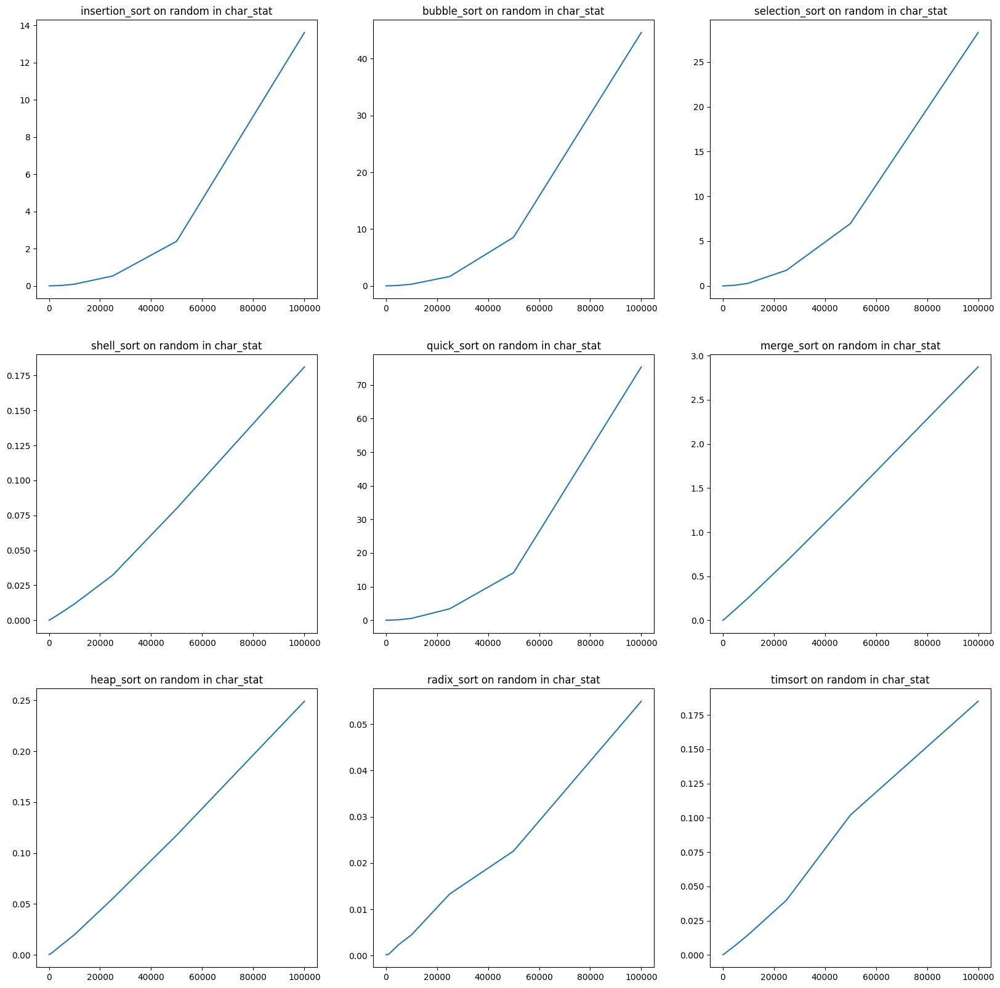

In [59]:
draw_statistic_exp(char_stat, 'random', 'char_stat')

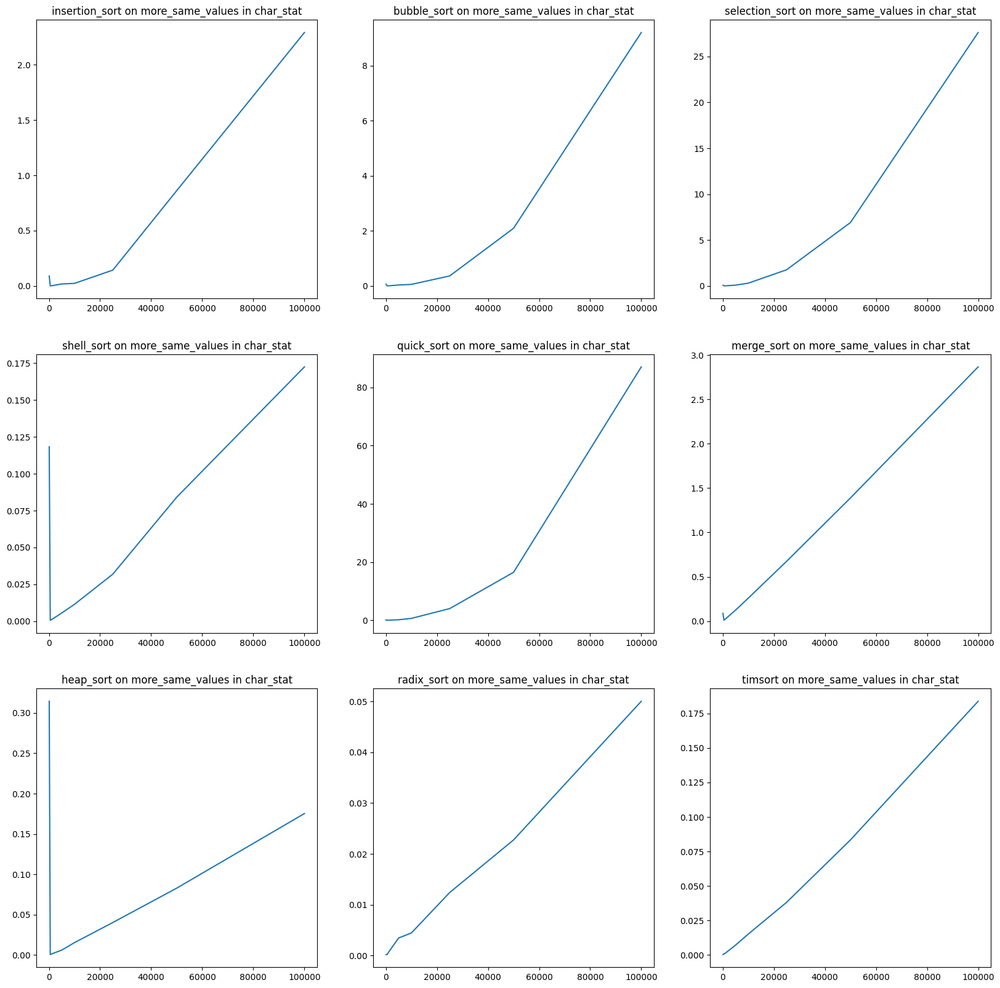

In [60]:
draw_statistic_exp(char_stat, 'more_same_values', 'char_stat')

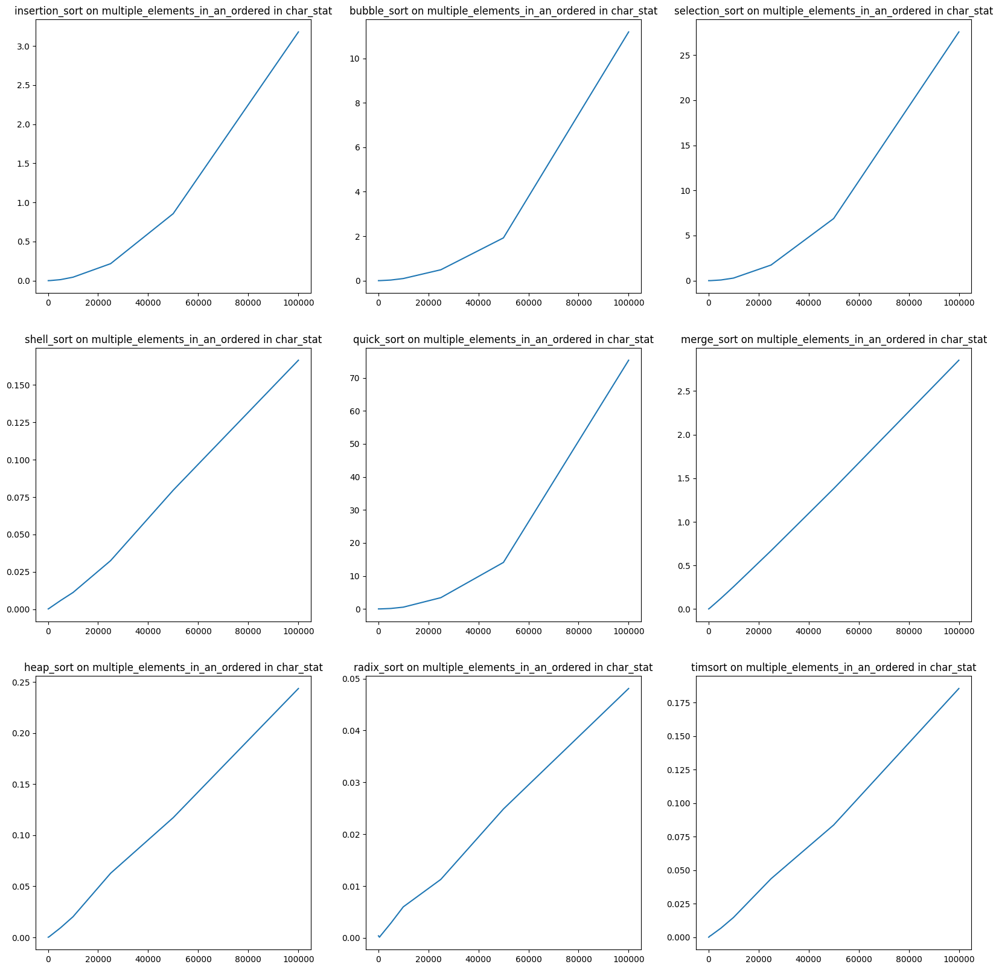

In [61]:
draw_statistic_exp(char_stat, 'multiple_elements_in_an_ordered', 'char_stat')

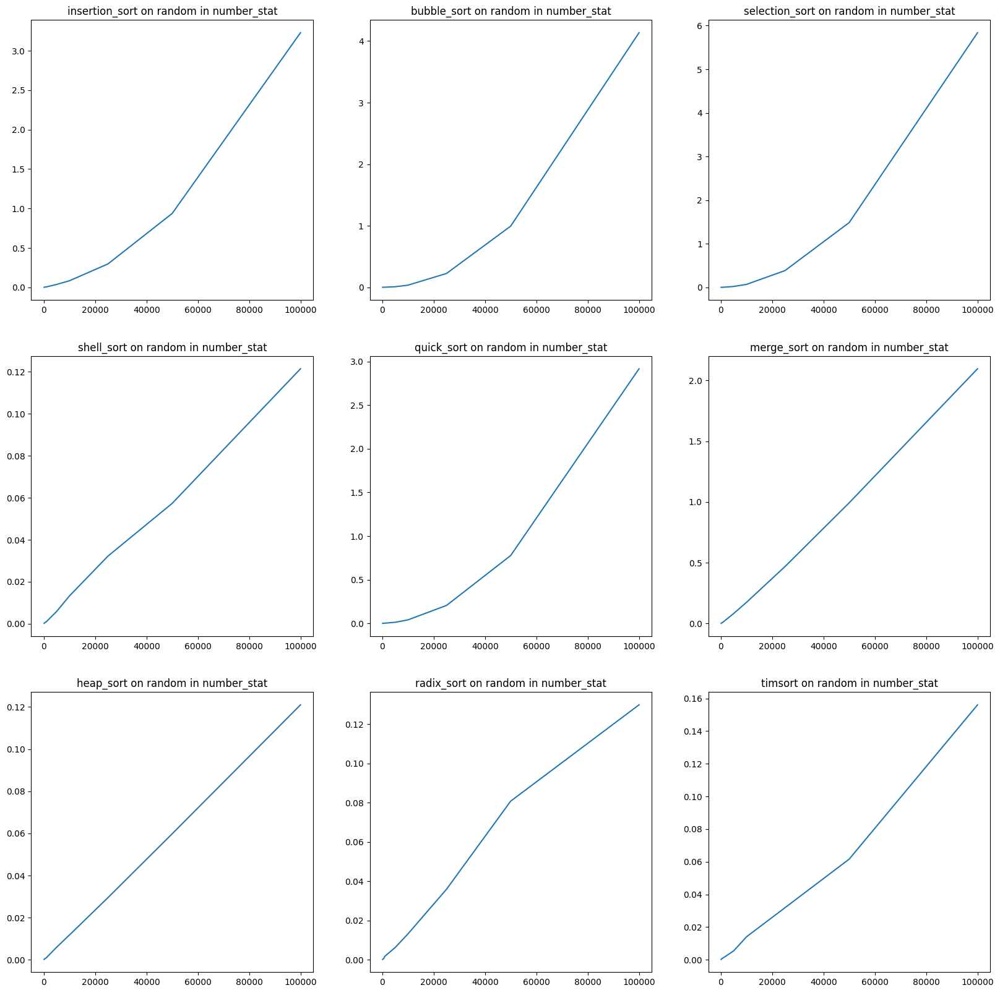

In [62]:
draw_statistic_exp(number_stat, 'random', 'number_stat')

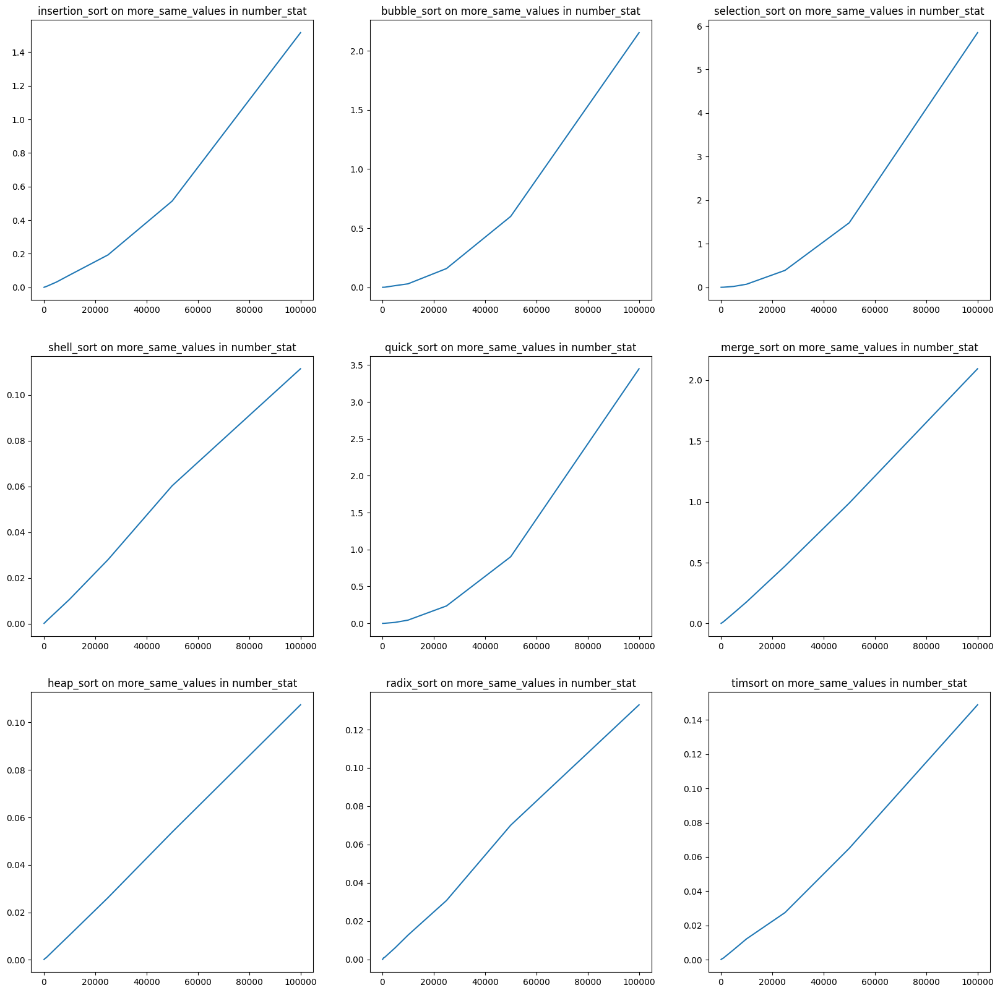

In [63]:
draw_statistic_exp(number_stat, 'more_same_values', 'number_stat')

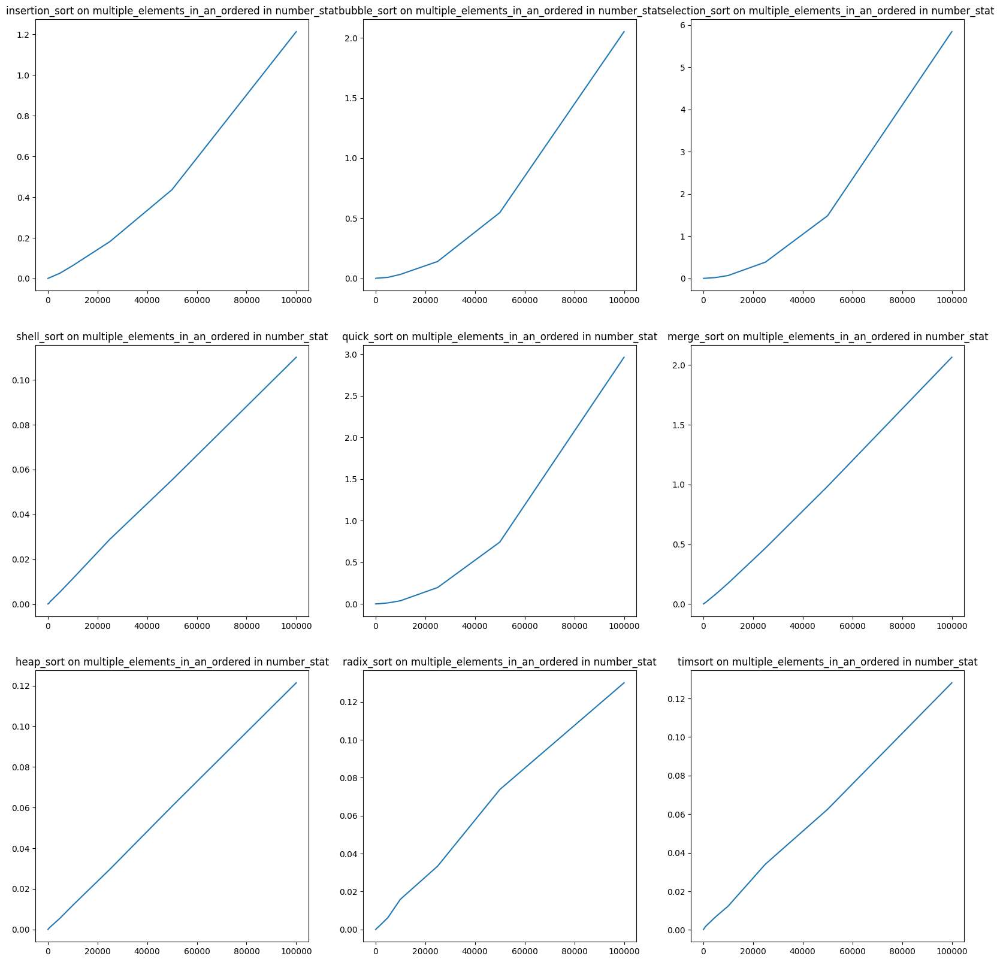

In [64]:
draw_statistic_exp(number_stat, 'multiple_elements_in_an_ordered', 'number_stat')

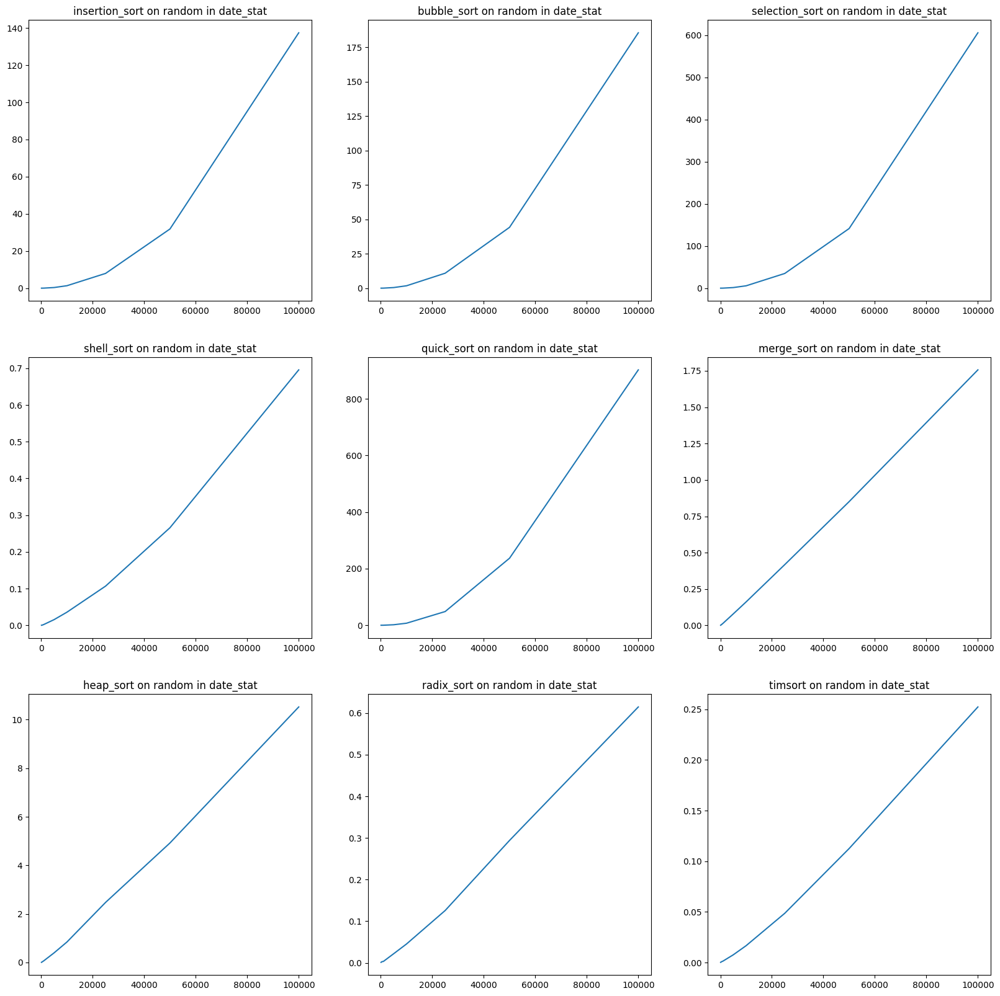

In [65]:
draw_statistic_exp(date_stat, 'random', 'date_stat')

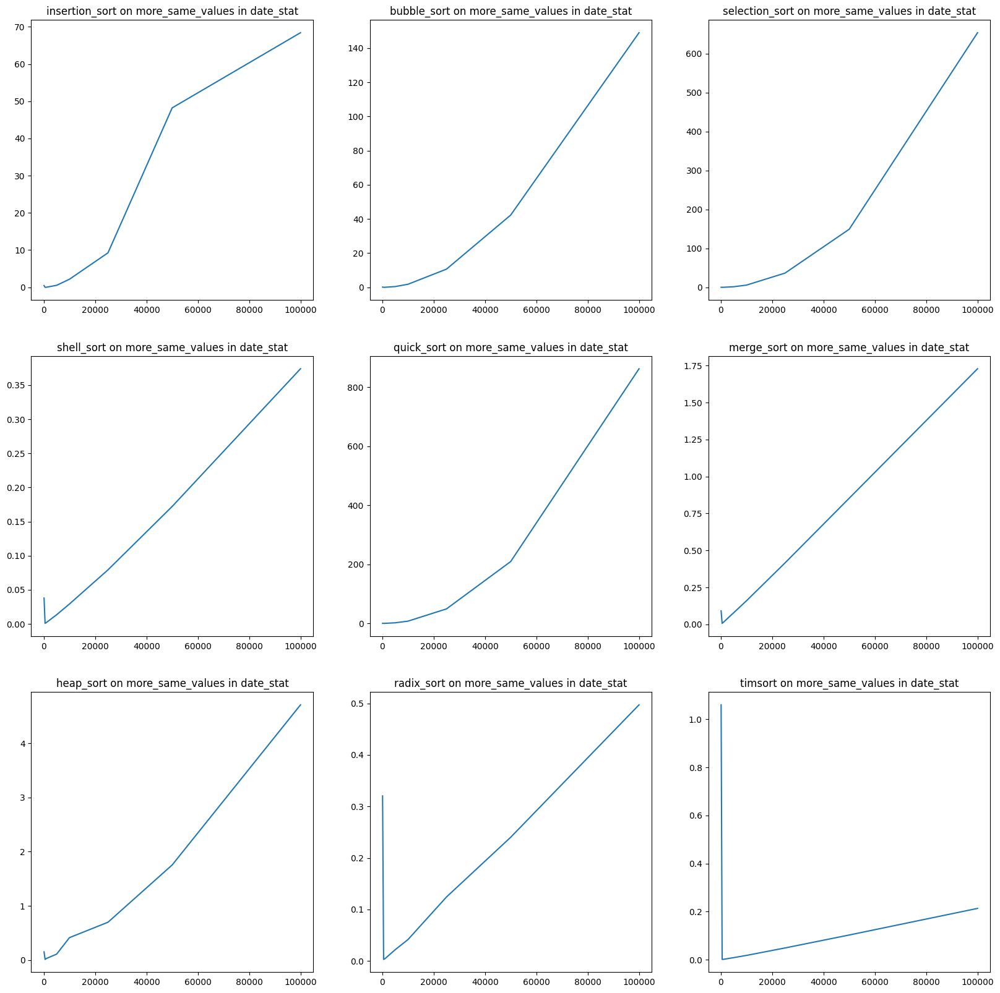

In [66]:
draw_statistic_exp(date_stat, 'more_same_values', 'date_stat')

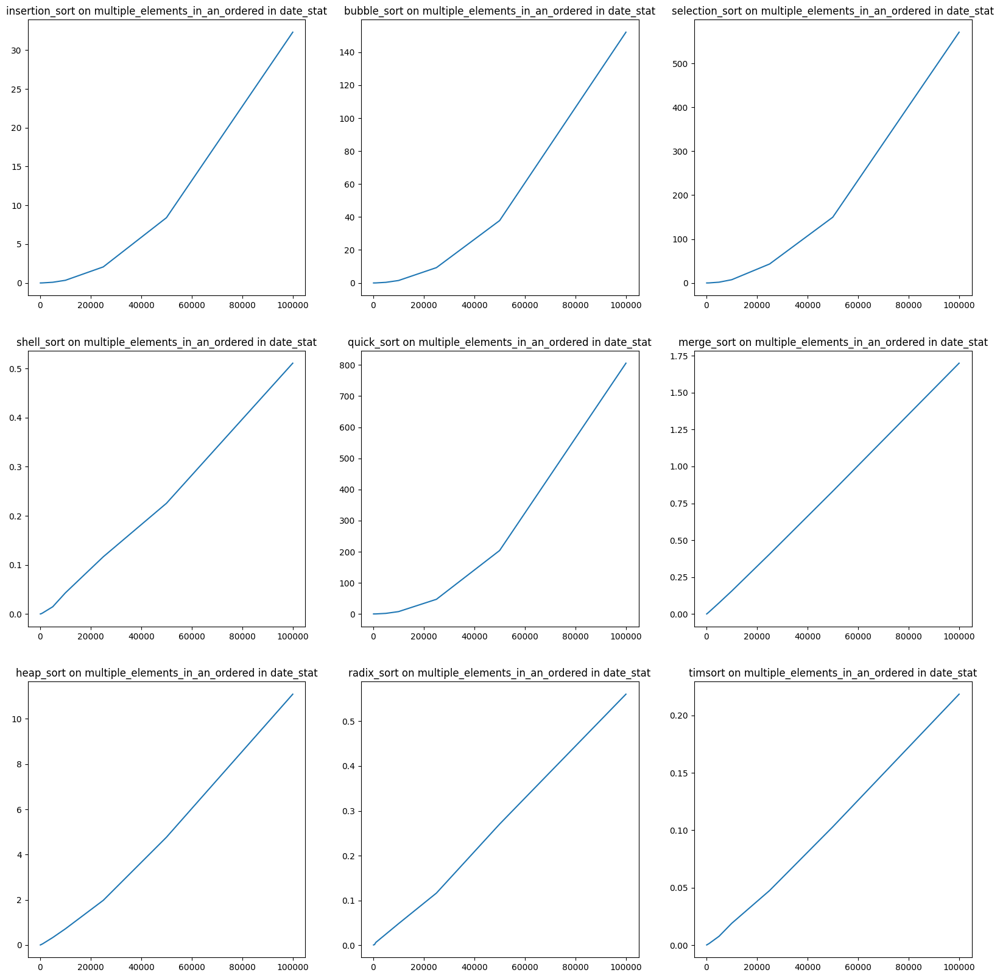

In [67]:
draw_statistic_exp(date_stat, 'multiple_elements_in_an_ordered', 'date_stat')

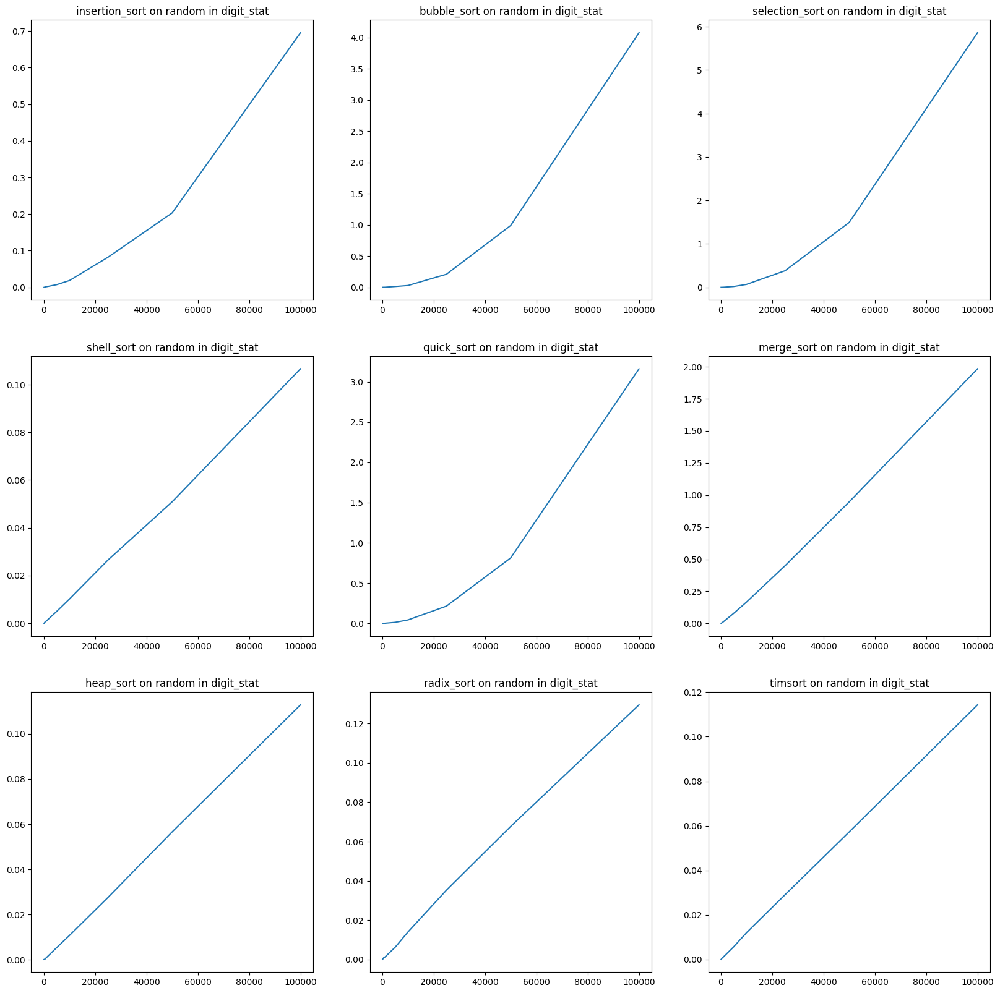

In [68]:
draw_statistic_exp(digit_stat, 'random', 'digit_stat')

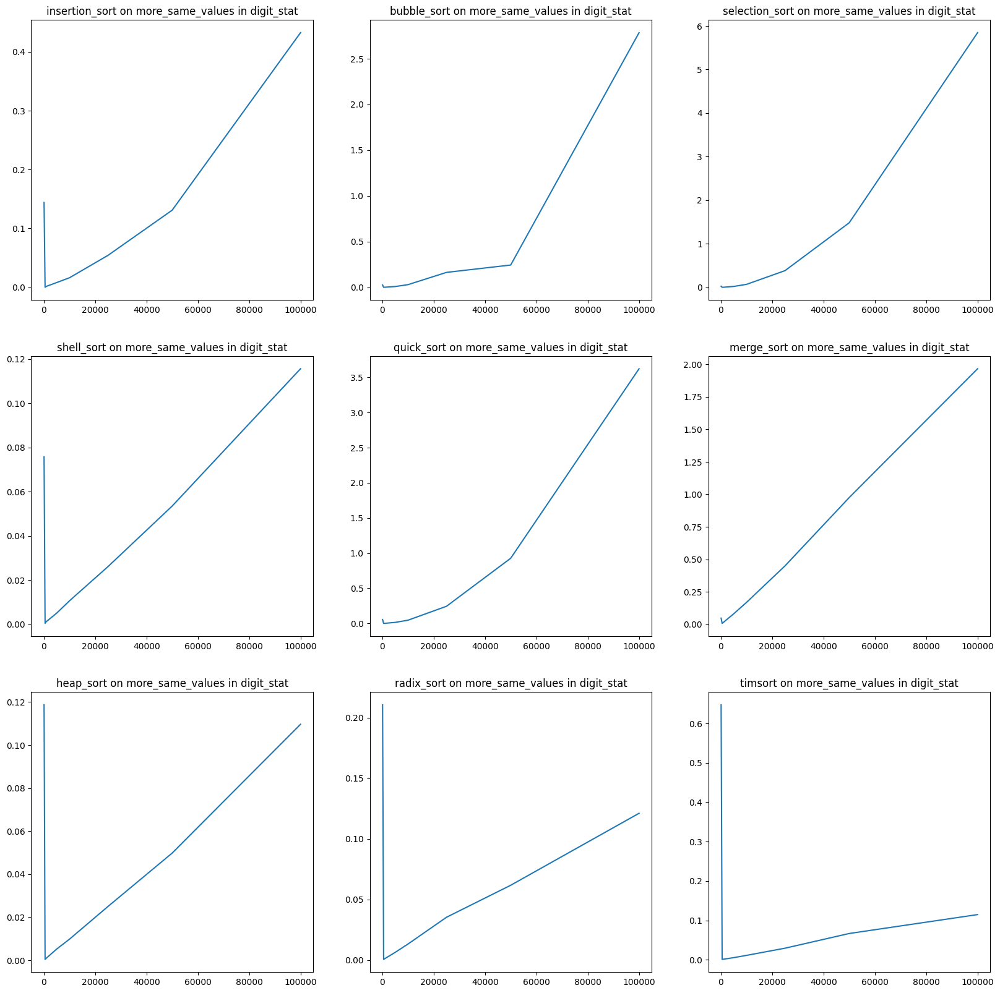

In [69]:
draw_statistic_exp(digit_stat, 'more_same_values', 'digit_stat')

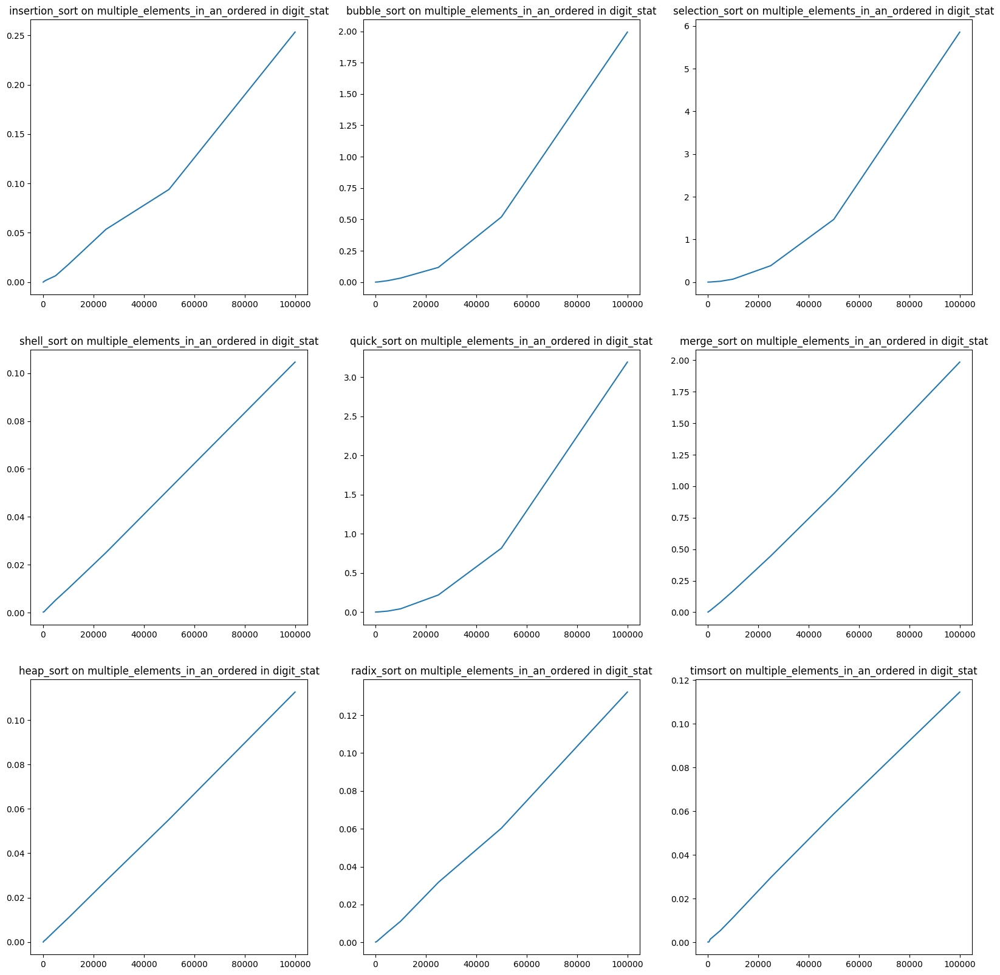

In [70]:
draw_statistic_exp(digit_stat, 'multiple_elements_in_an_ordered', 'digit_stat')

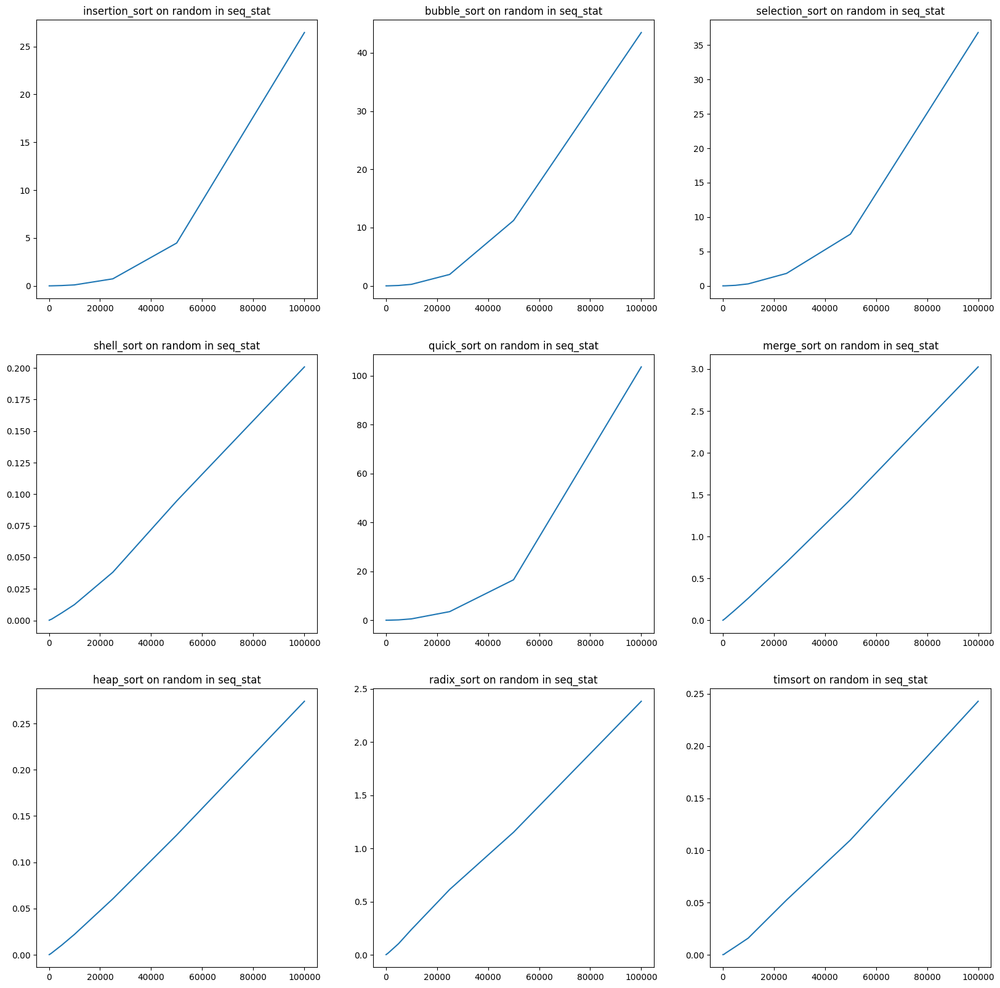

In [71]:
draw_statistic_exp(seq_stat, 'random', 'seq_stat')

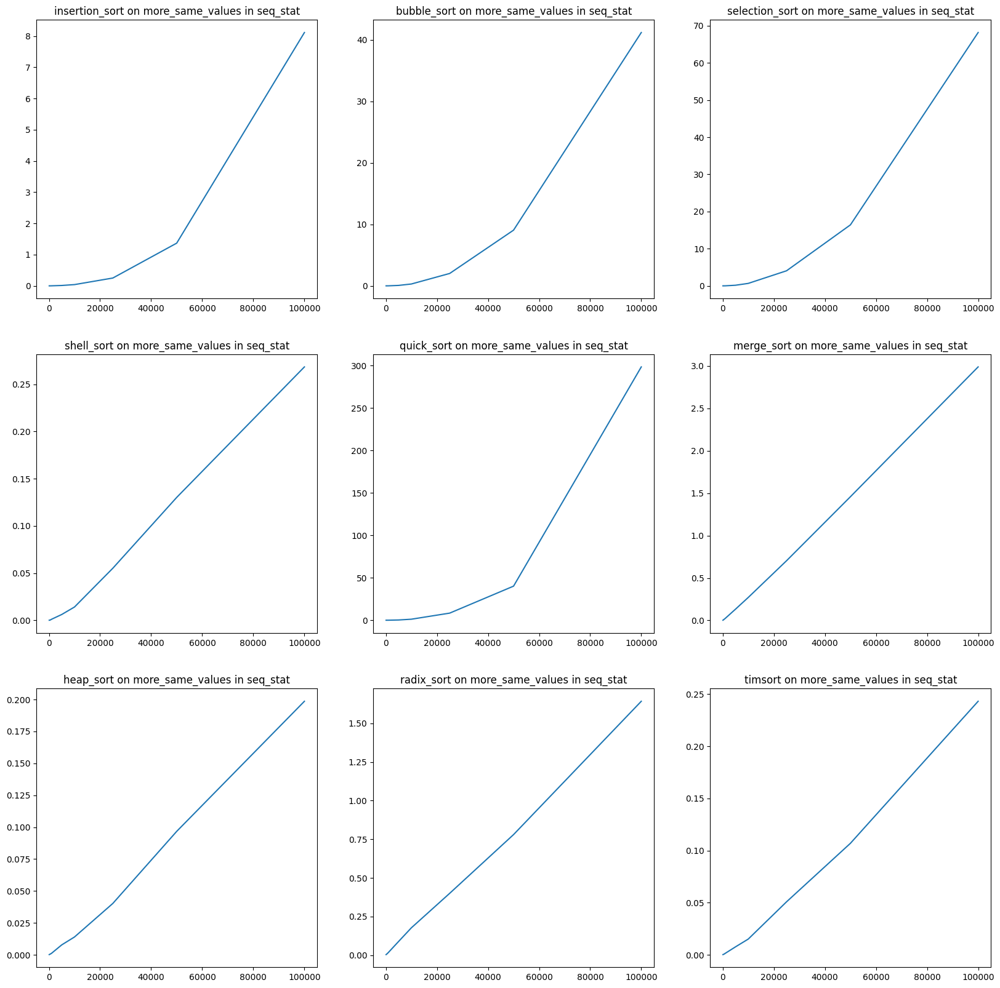

In [72]:
draw_statistic_exp(seq_stat, 'more_same_values', 'seq_stat')

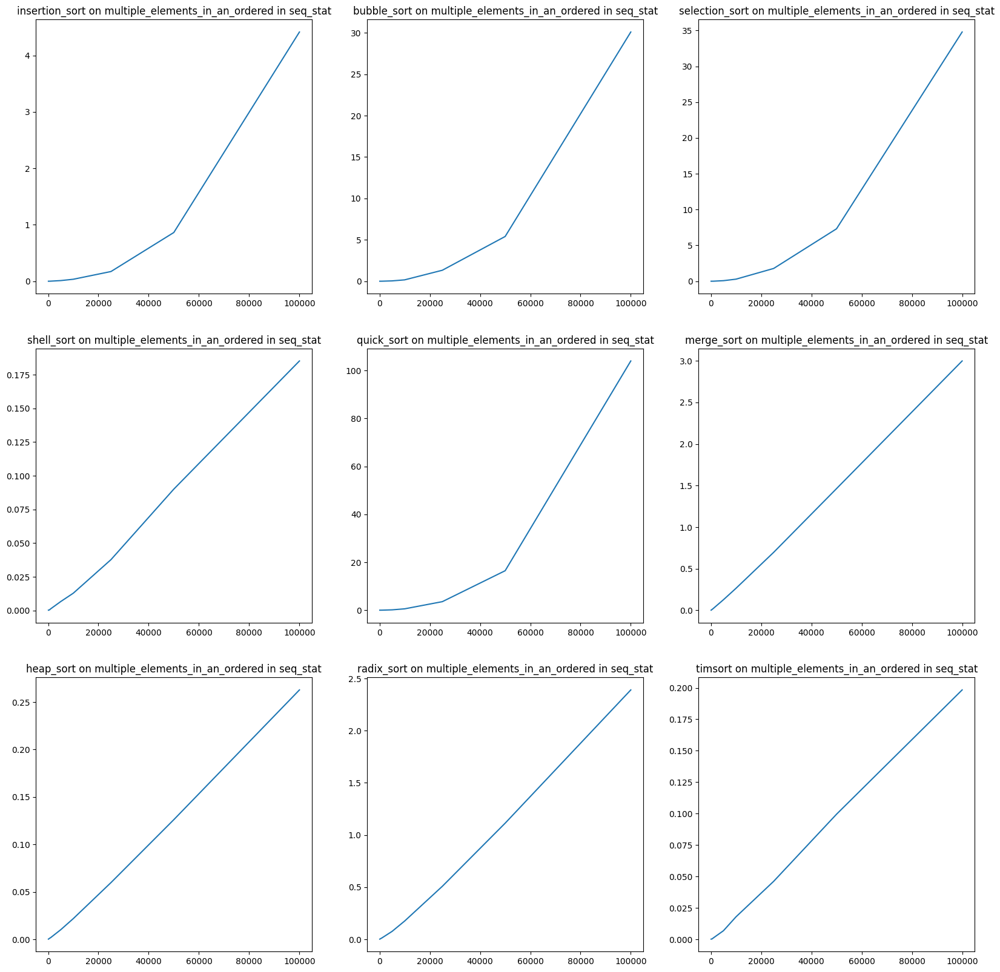

In [73]:
draw_statistic_exp(seq_stat, 'multiple_elements_in_an_ordered', 'seq_stat')

## Statistic on char_data

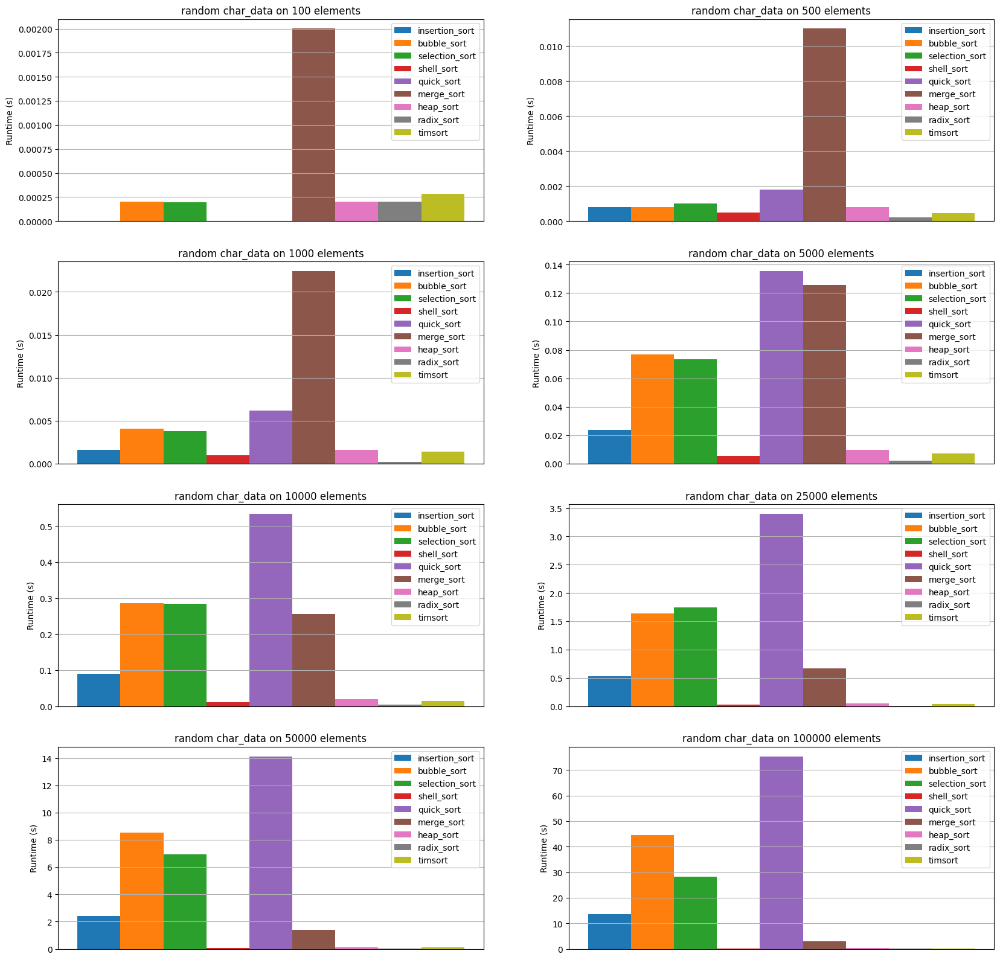

In [7]:
draw_bars_on_data(char_stat, 'random', 'char_data')

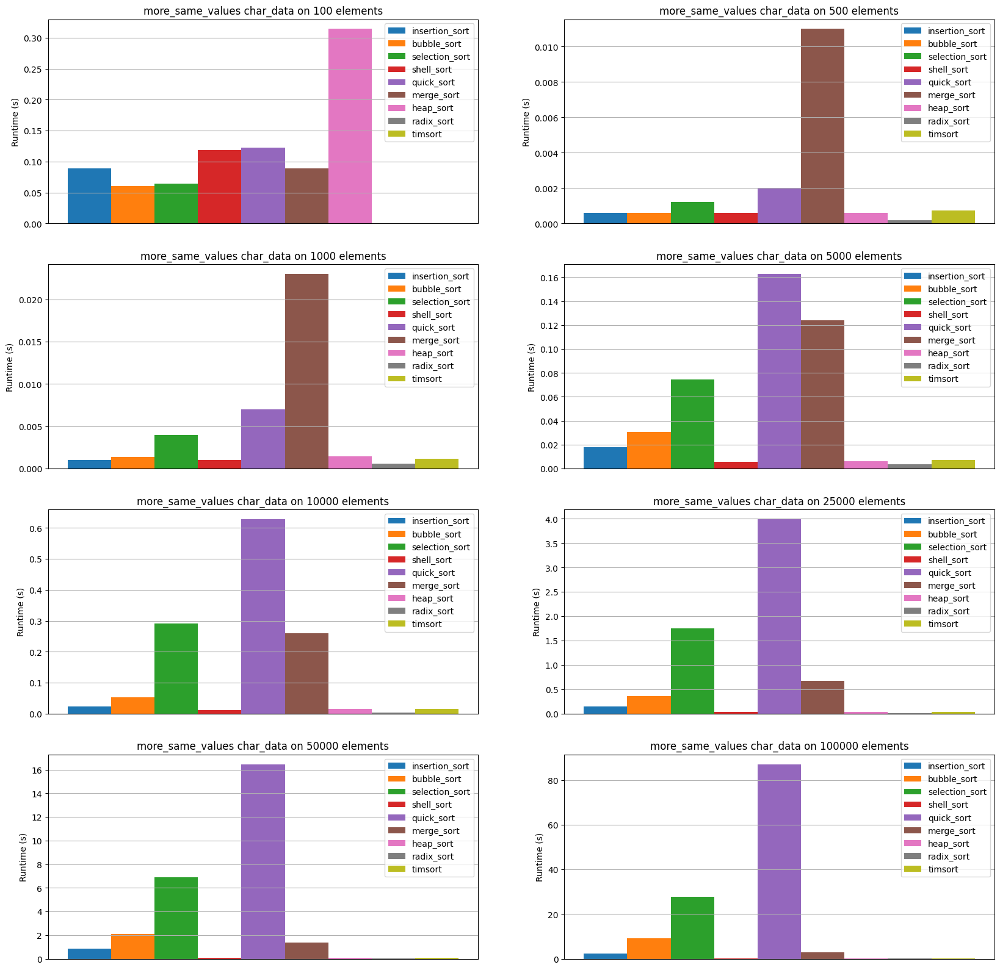

In [63]:
draw_bars_on_data(char_stat, 'more_same_values', 'char_data')

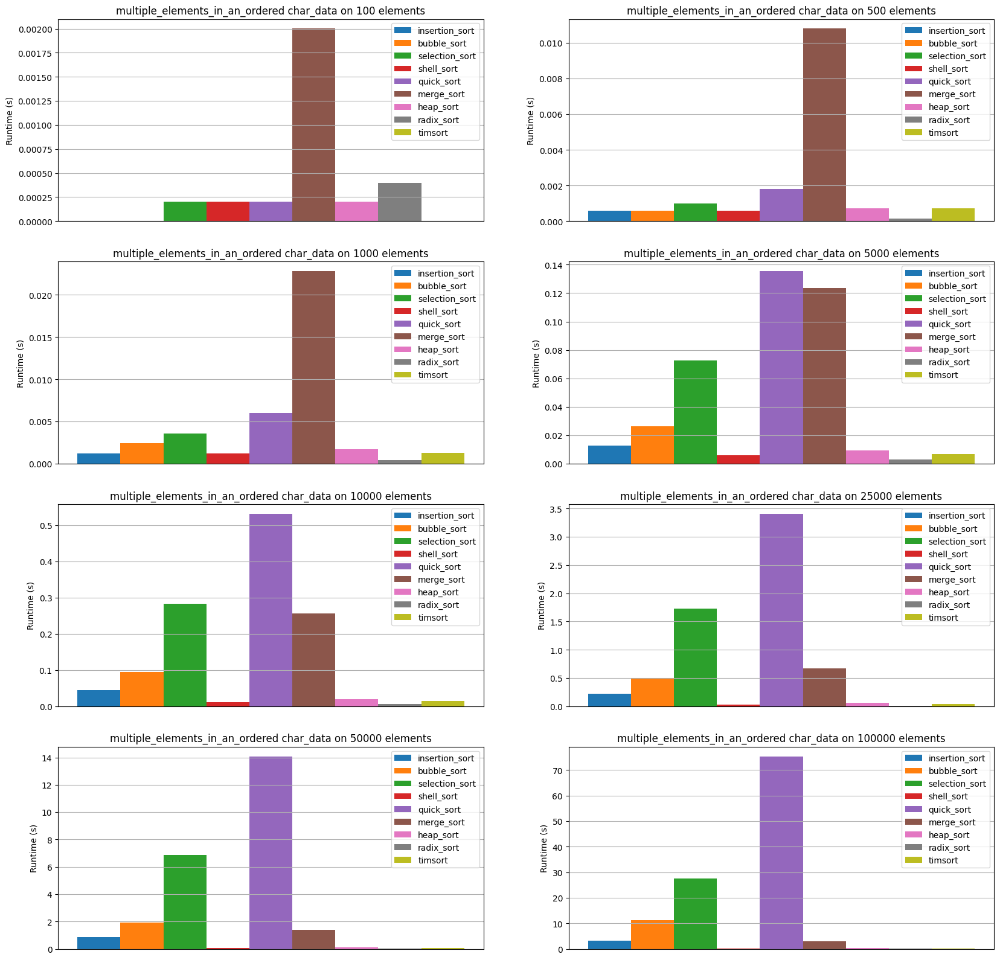

In [8]:
draw_bars_on_data(char_stat, 'multiple_elements_in_an_ordered', 'char_data')

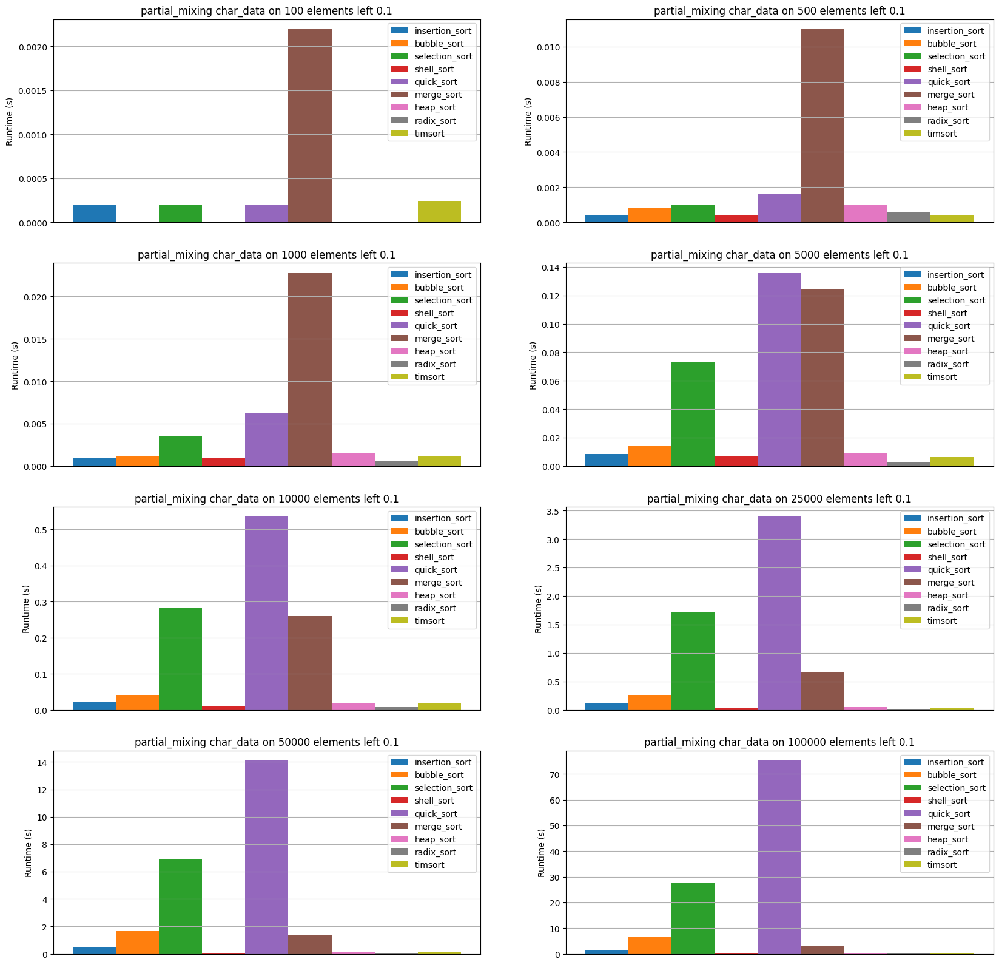

In [65]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='left', cf=0.1)

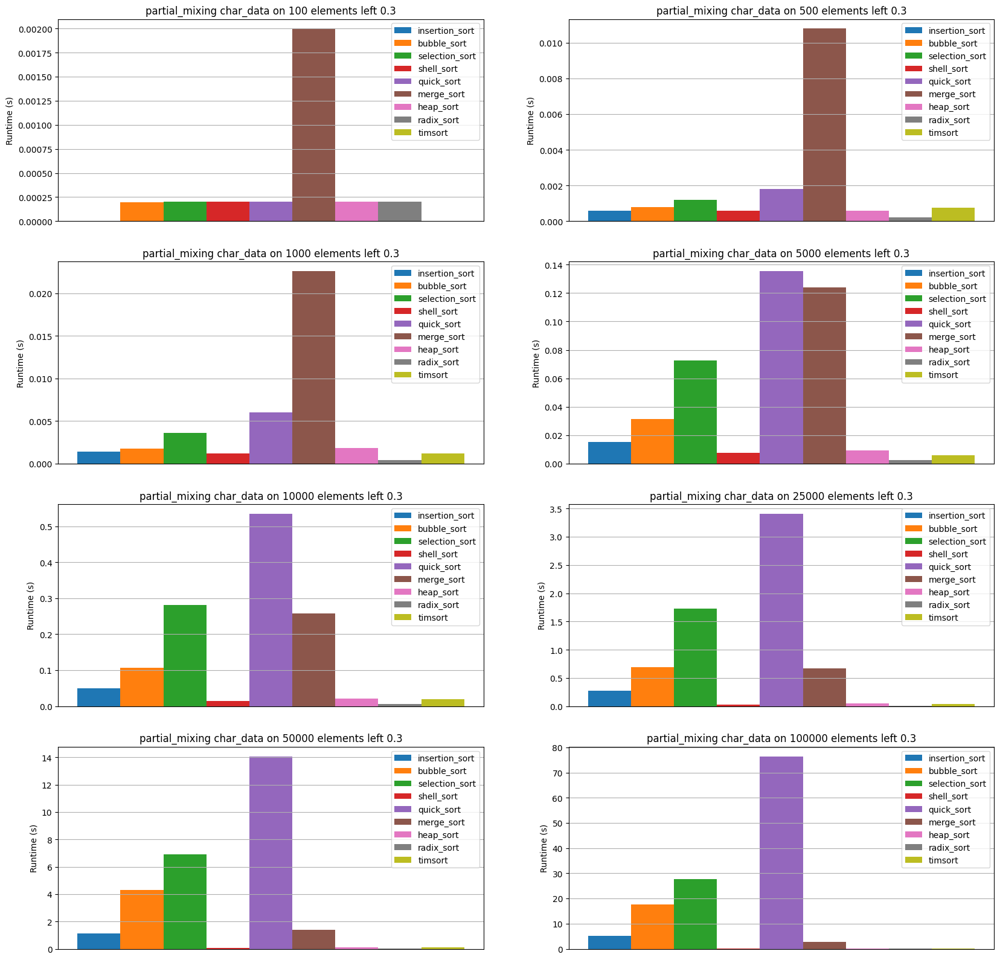

In [66]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='left', cf=0.3)

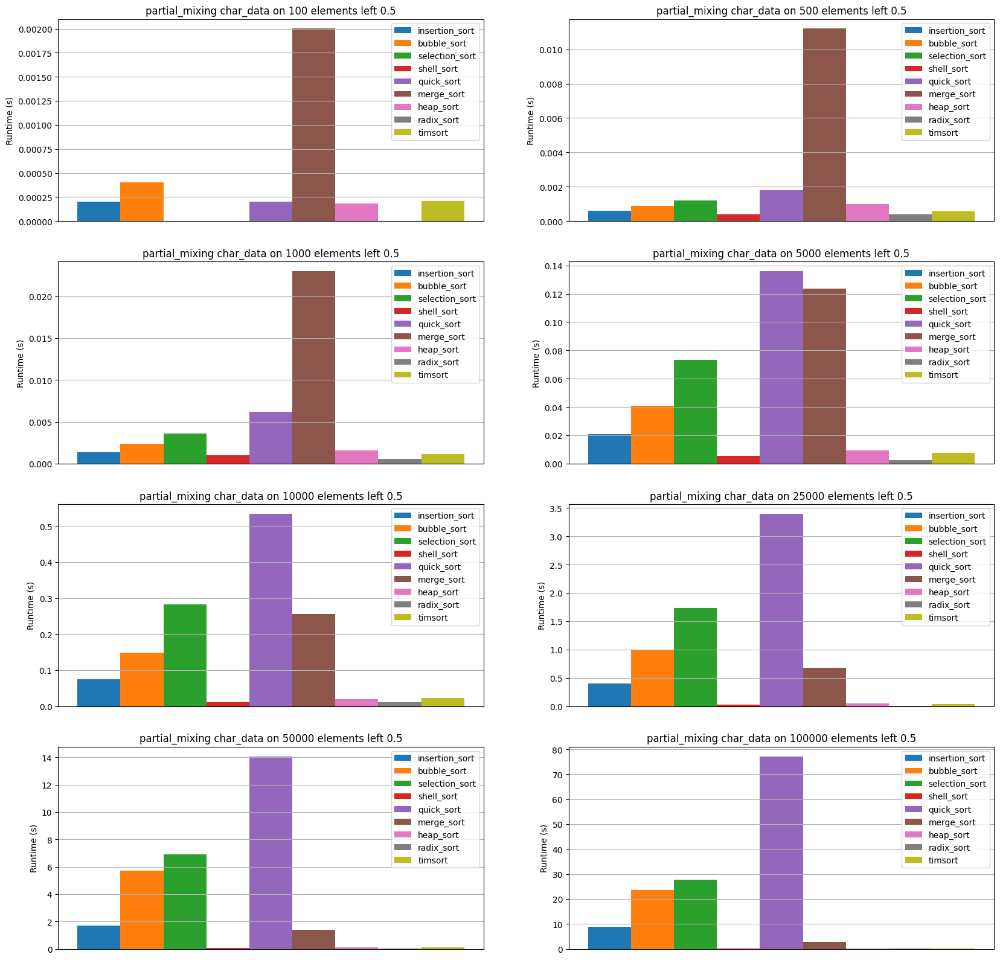

In [67]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='left', cf=0.5)

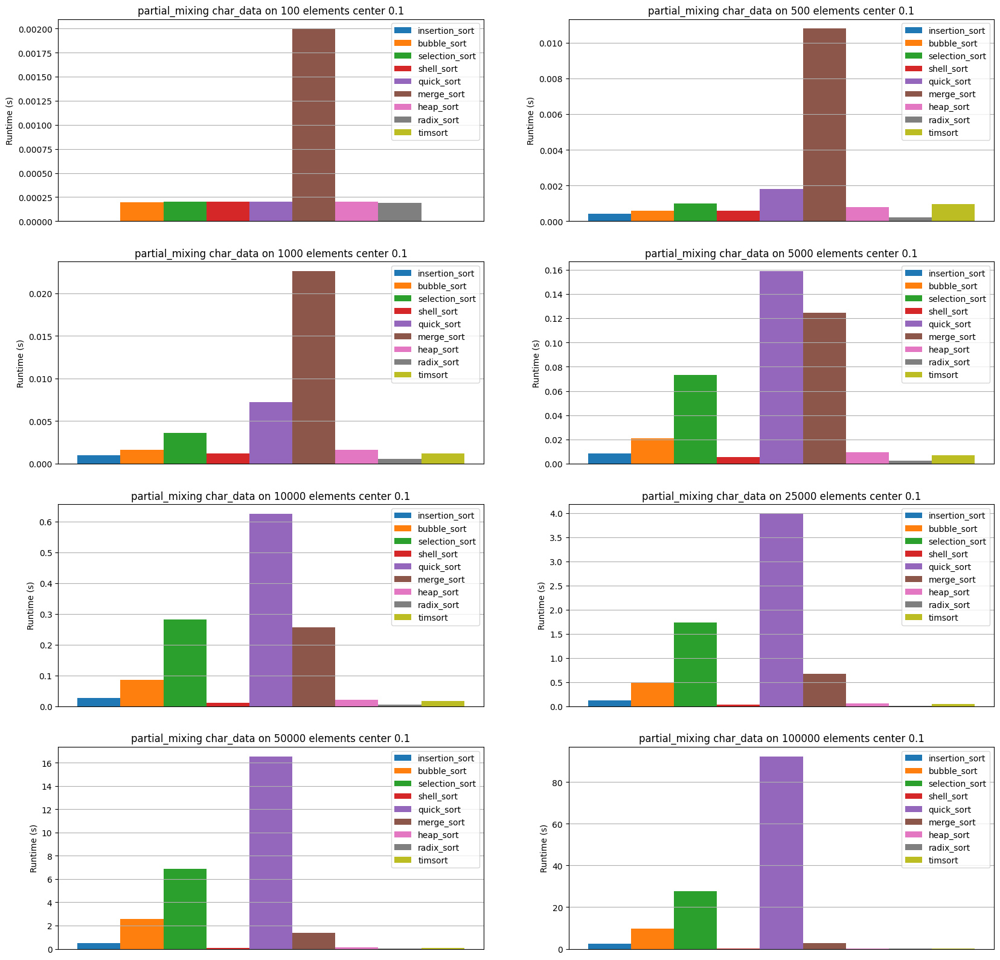

In [68]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='center', cf=0.1)

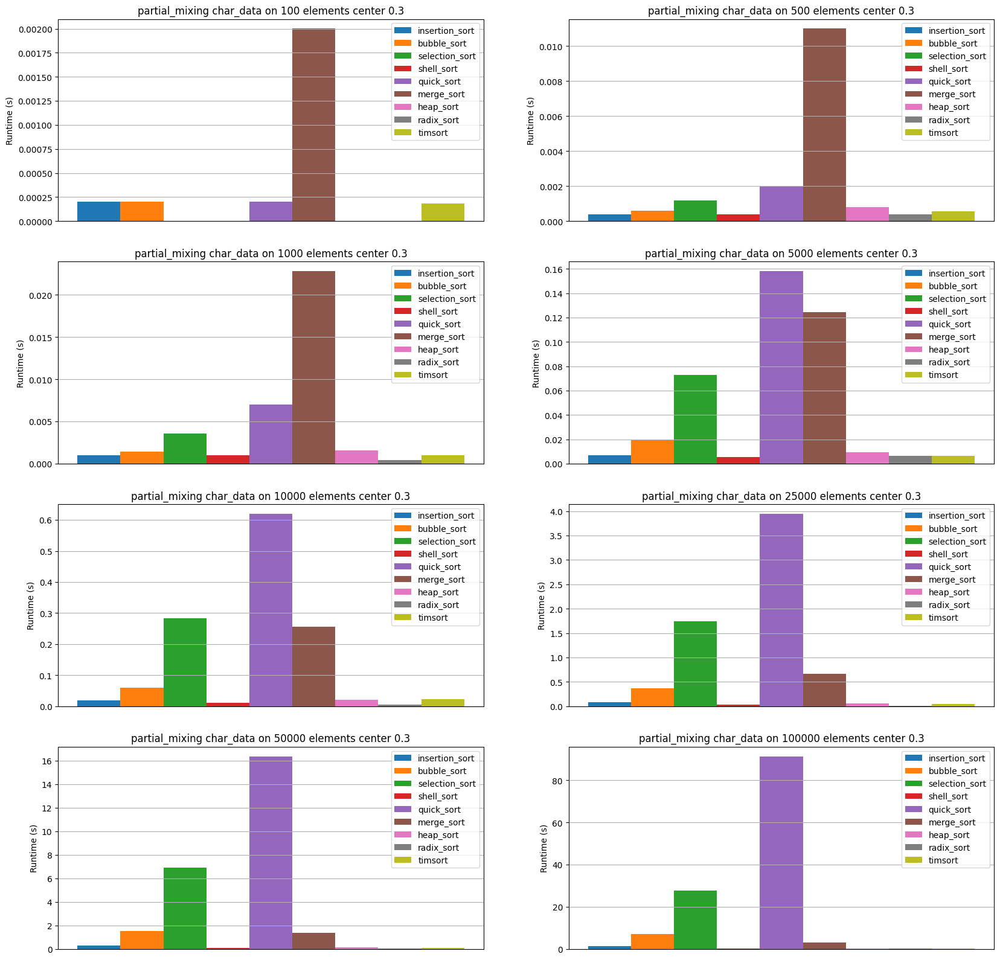

In [69]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='center', cf=0.3)

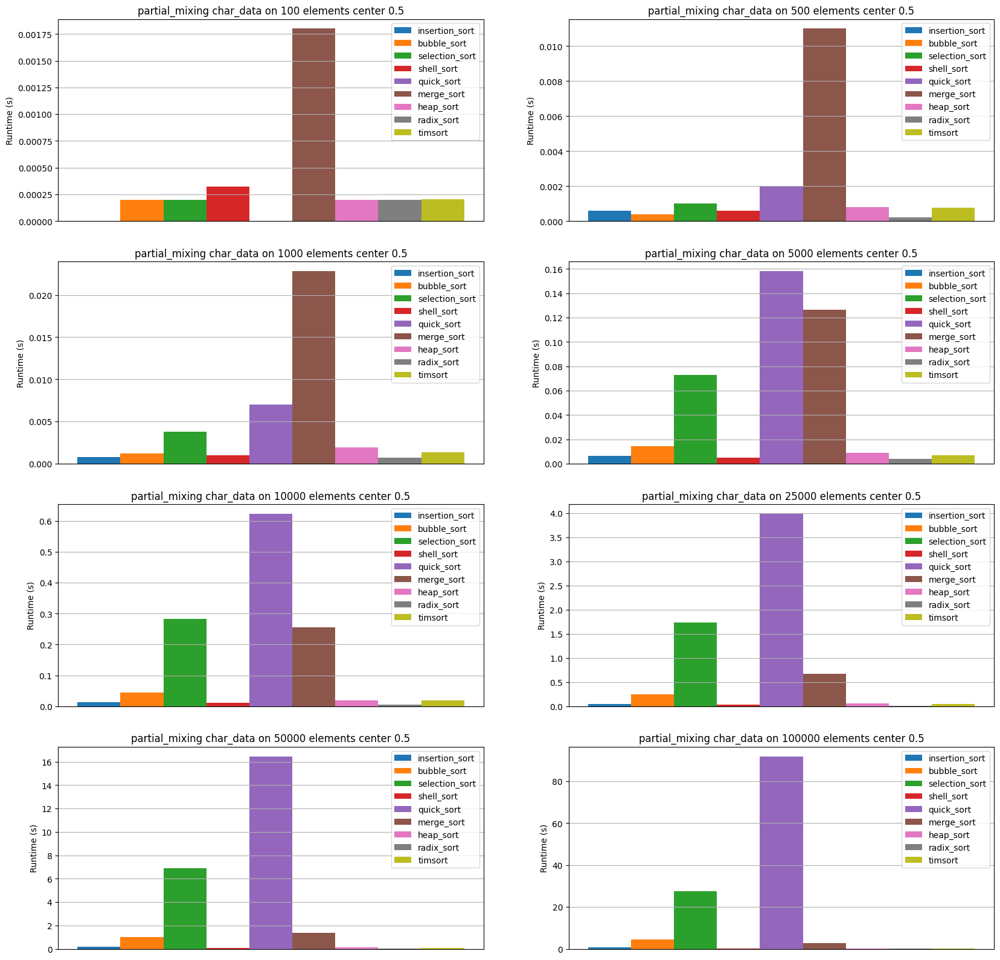

In [70]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='center', cf=0.5)

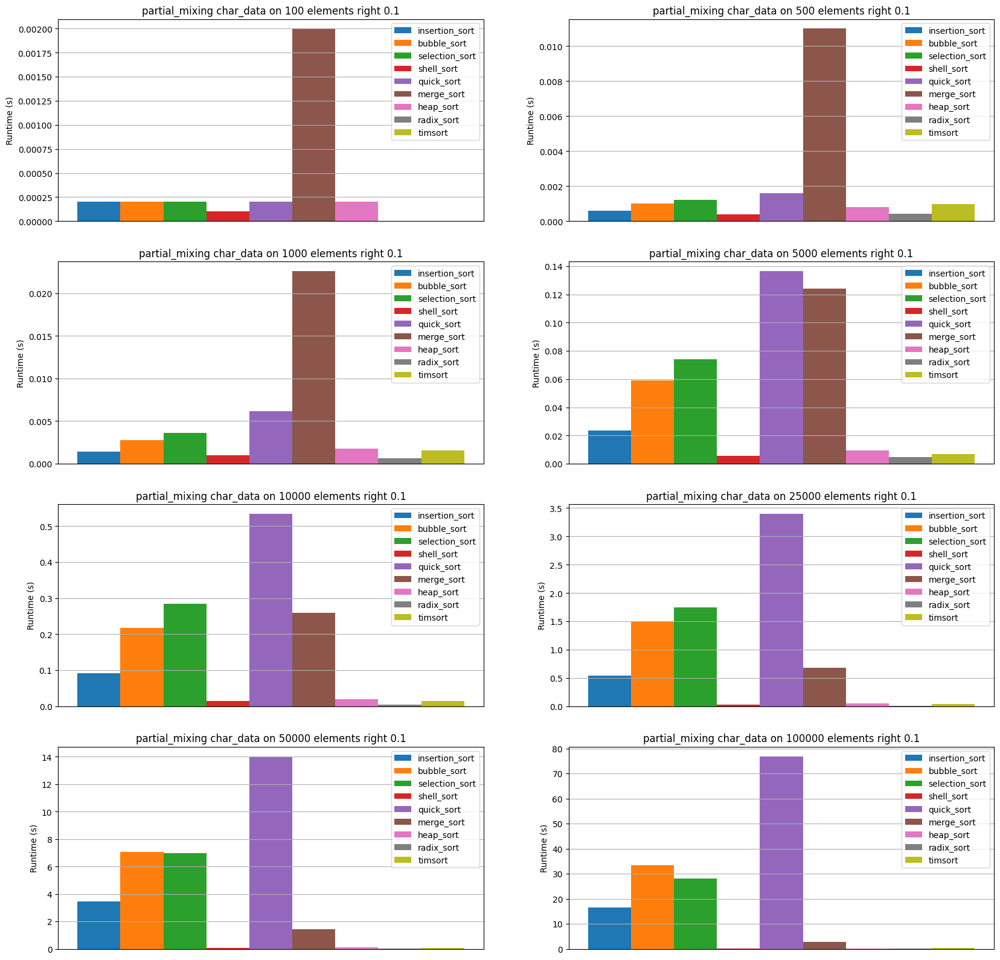

In [71]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='right', cf=0.1)

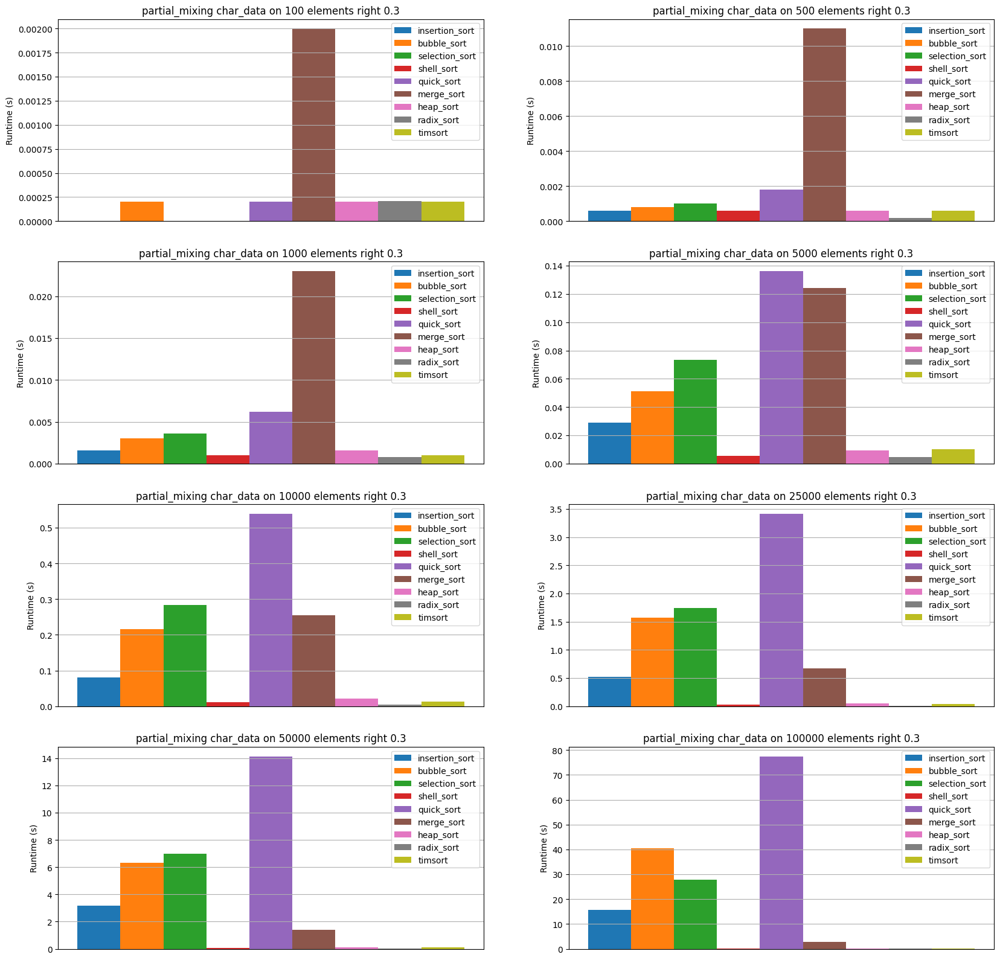

In [72]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='right', cf=0.3)

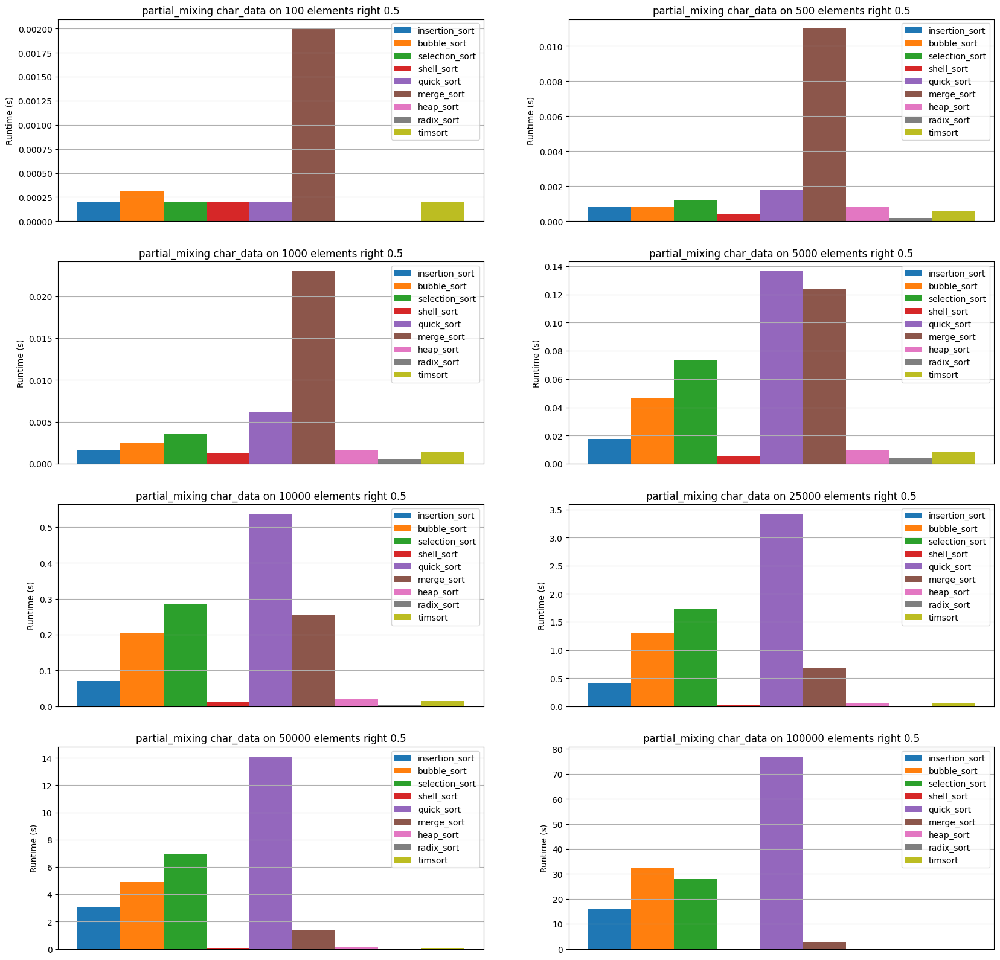

In [73]:
draw_bars_on_data(char_stat, 'partial_mixing', 'char_data', pos='right', cf=0.5)

## Statistic on number_data

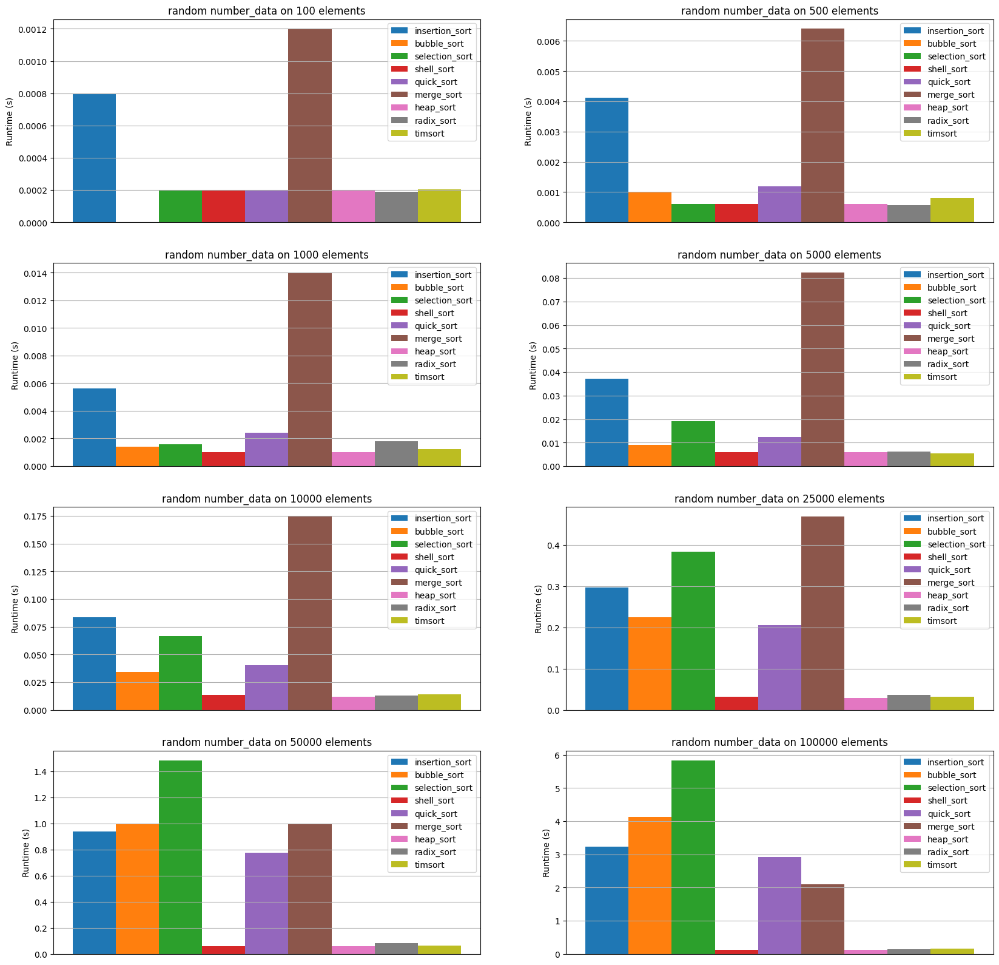

In [74]:
draw_bars_on_data(number_stat, 'random', 'number_data')

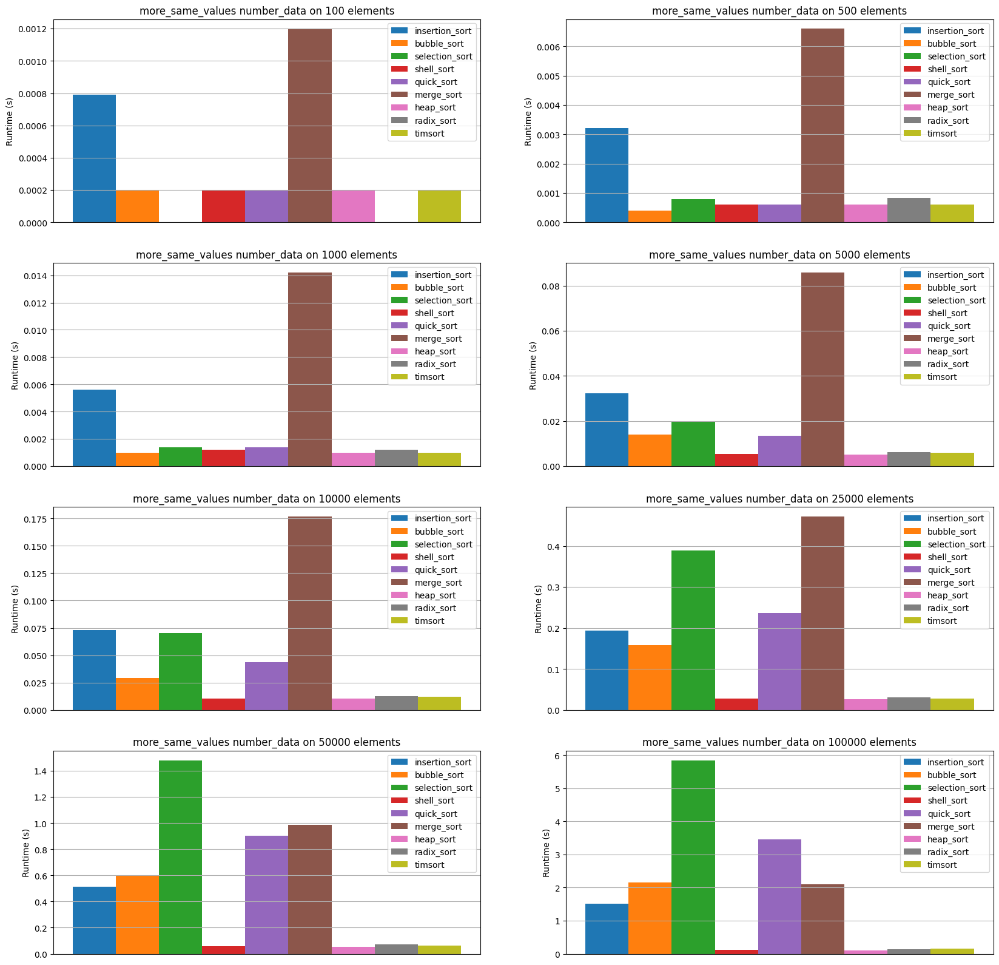

In [75]:
draw_bars_on_data(number_stat, 'more_same_values', 'number_data')

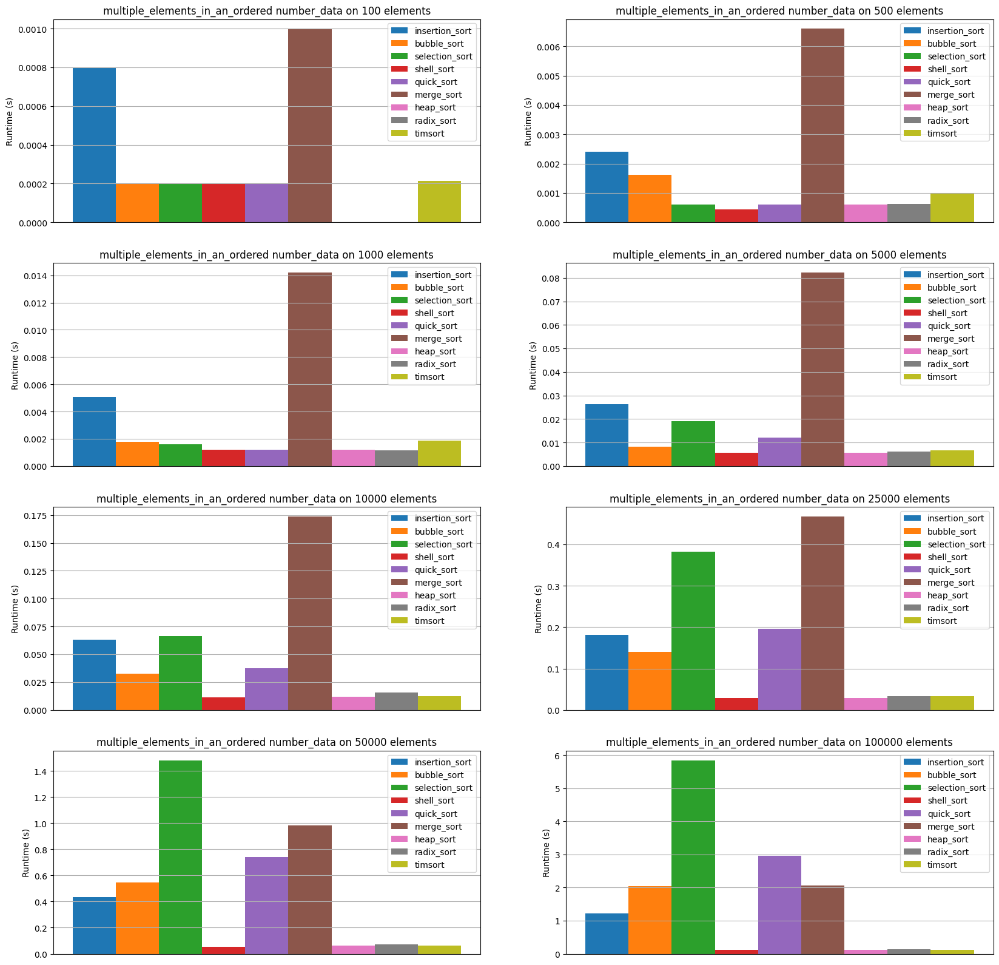

In [76]:
draw_bars_on_data(number_stat, 'multiple_elements_in_an_ordered', 'number_data')

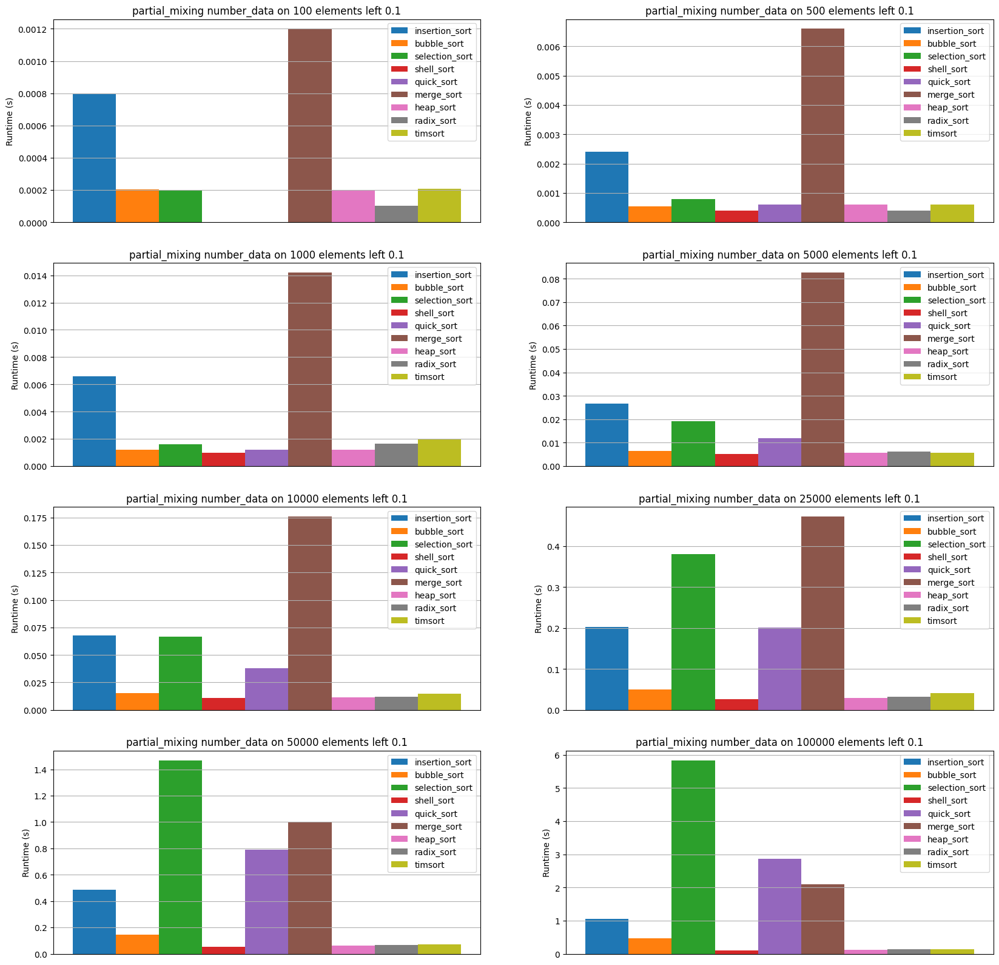

In [77]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='left', cf=0.1)

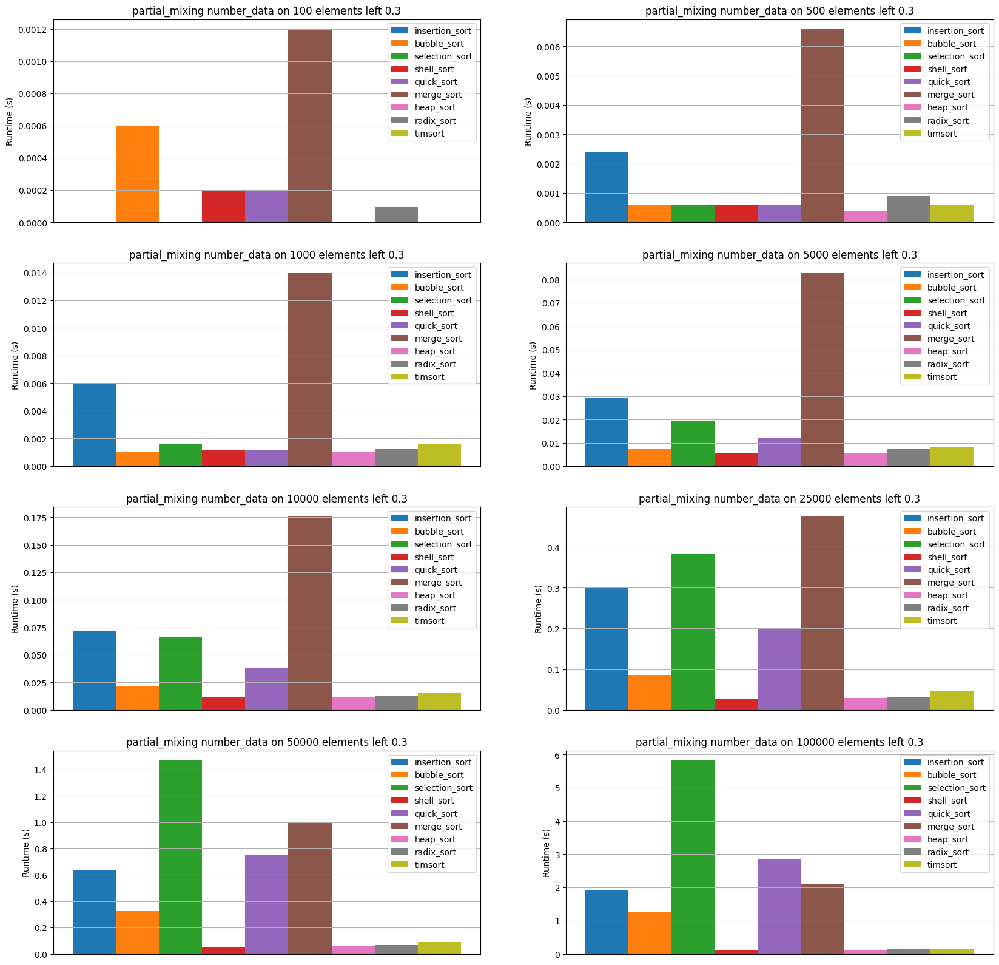

In [78]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='left', cf=0.3)

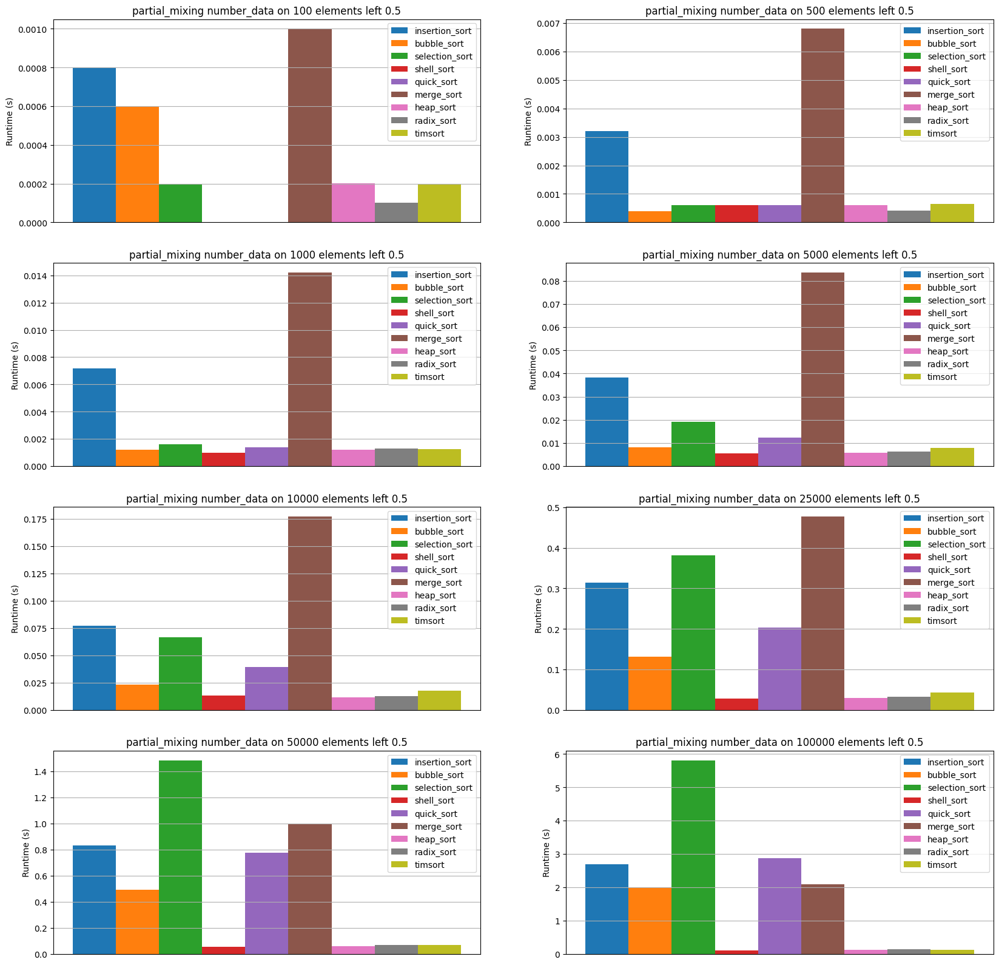

In [79]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='left', cf=0.5)

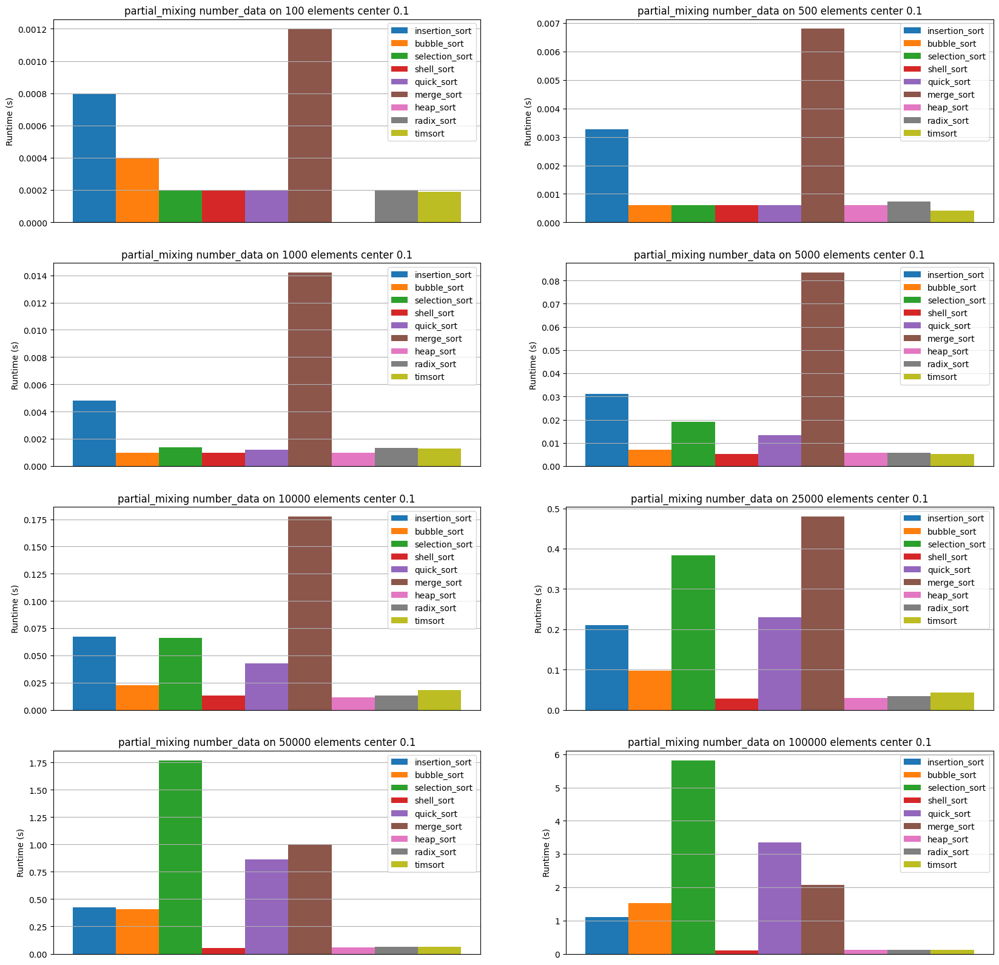

In [80]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='center', cf=0.1)

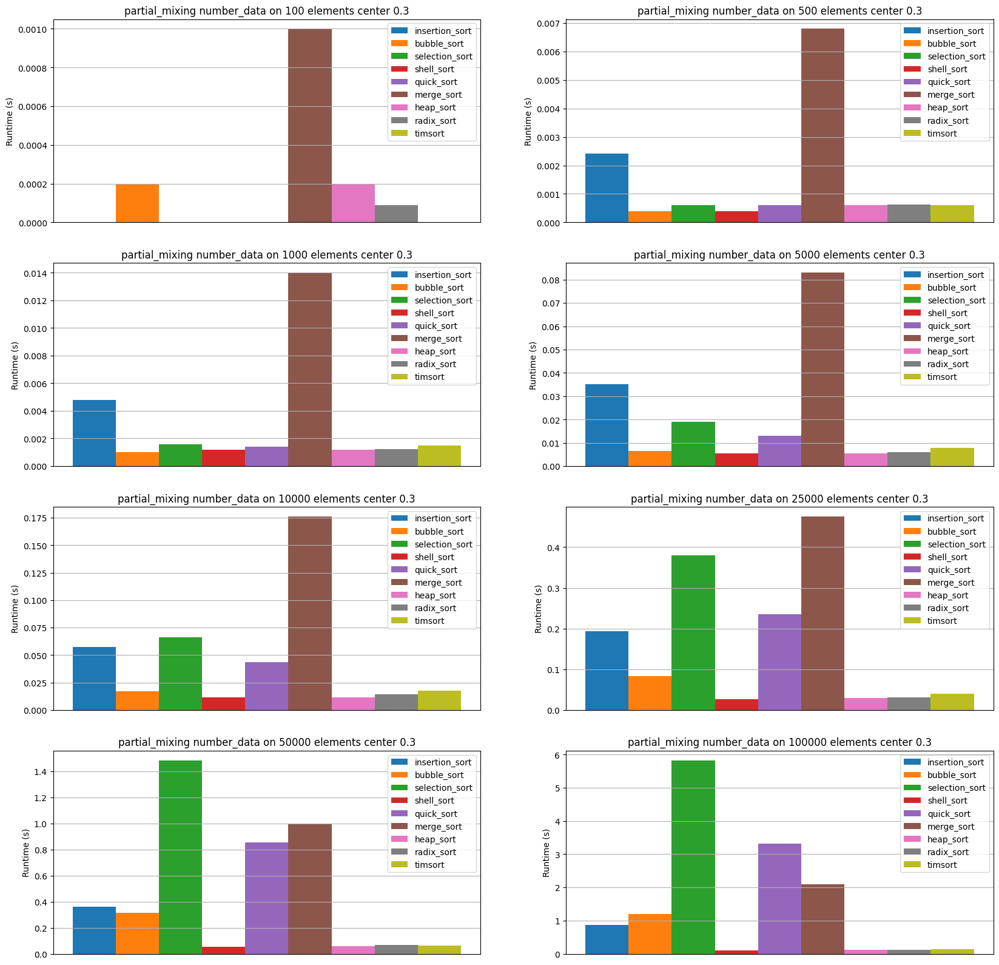

In [81]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='center', cf=0.3)

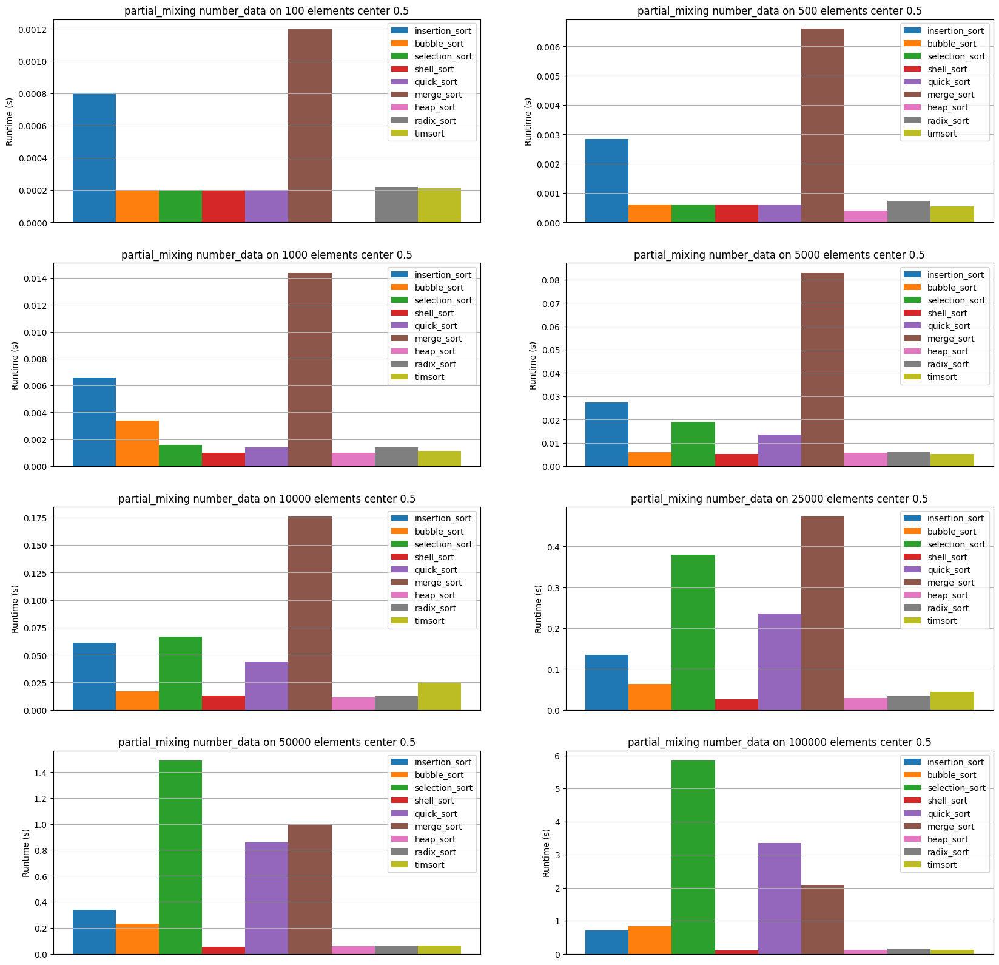

In [82]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='center', cf=0.5)

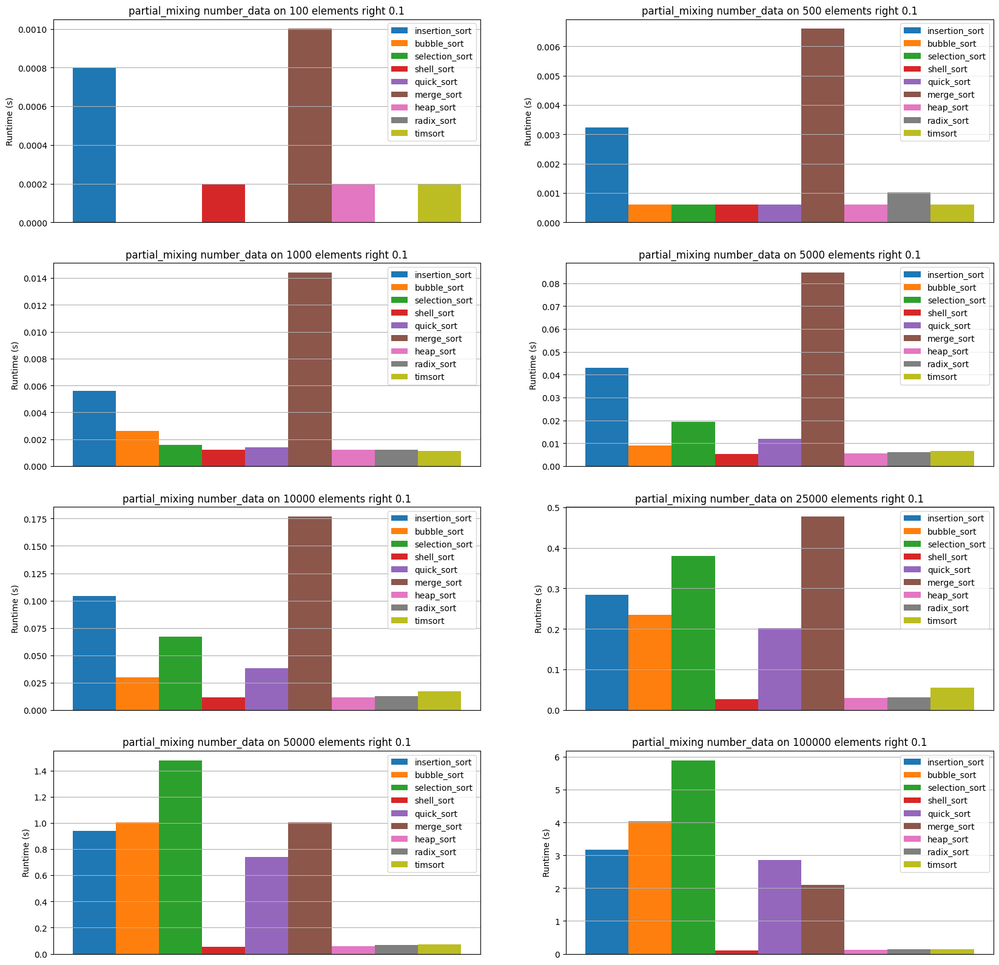

In [83]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='right', cf=0.1)

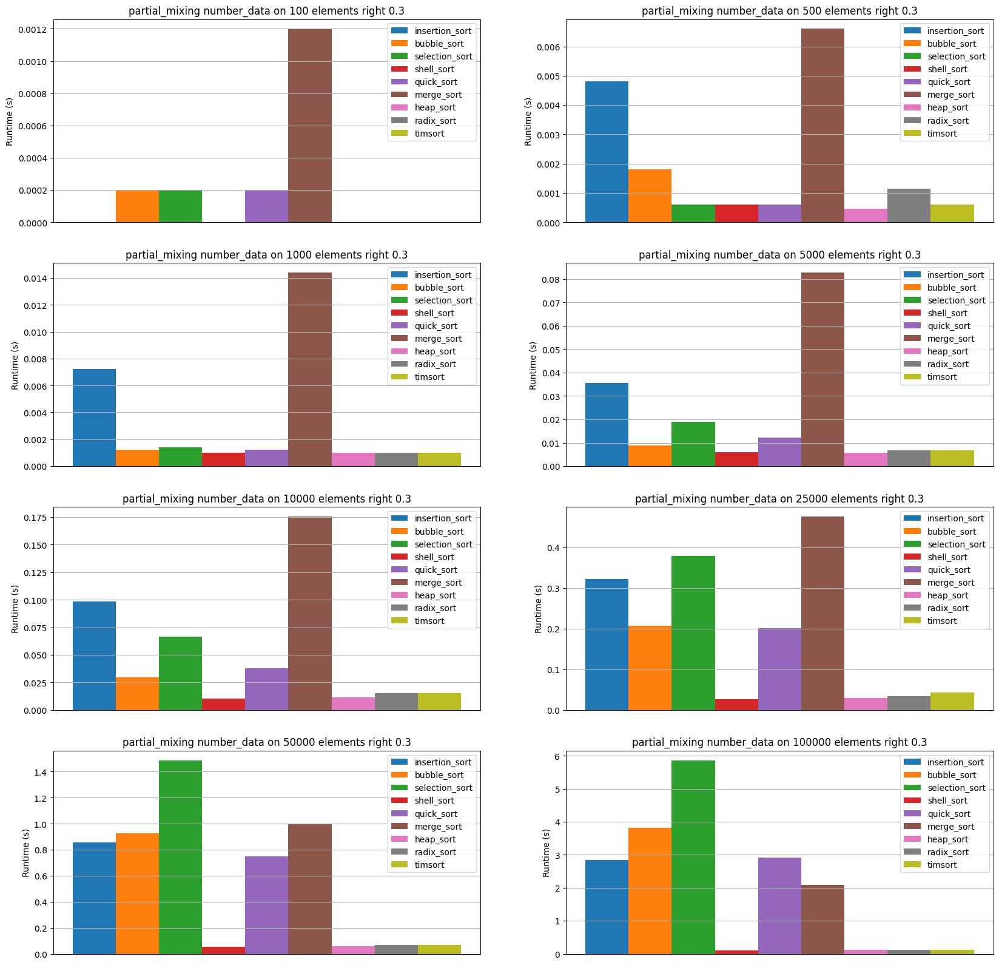

In [84]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='right', cf=0.3)

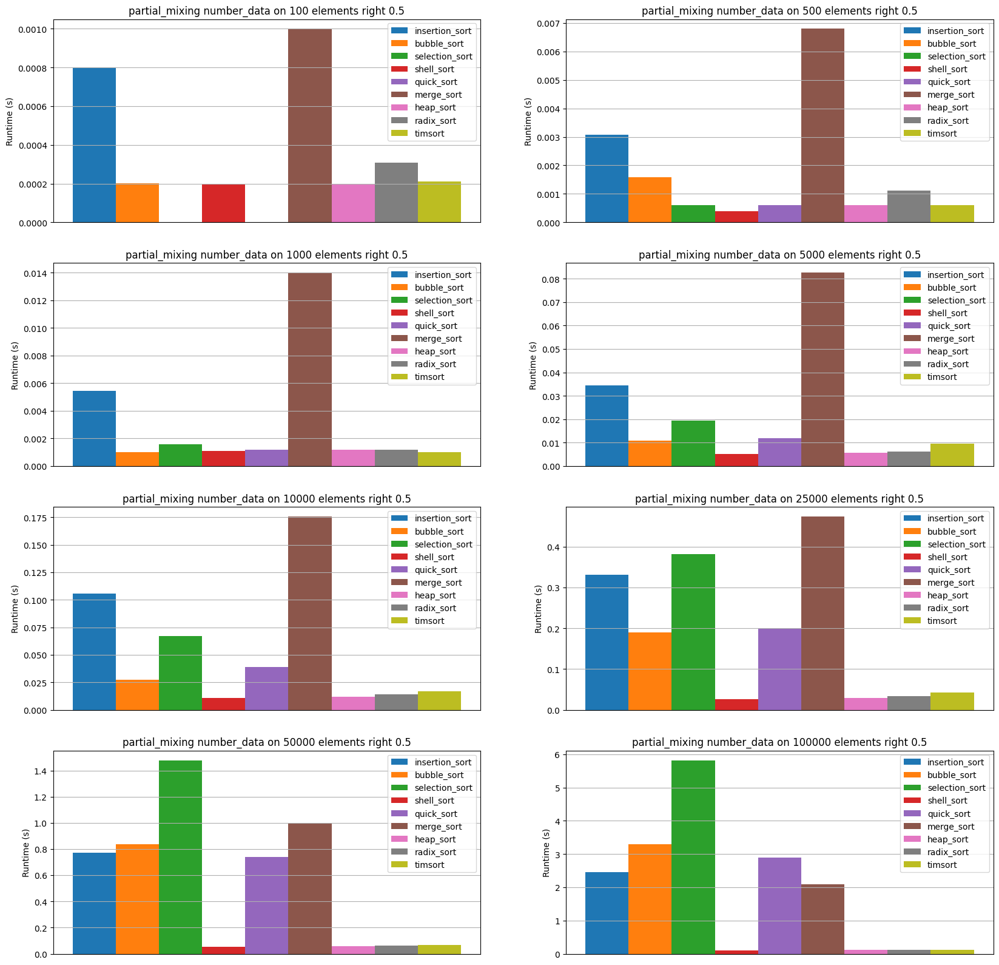

In [85]:
draw_bars_on_data(number_stat, 'partial_mixing', 'number_data', pos='right', cf=0.5)

## Statistic on date_data

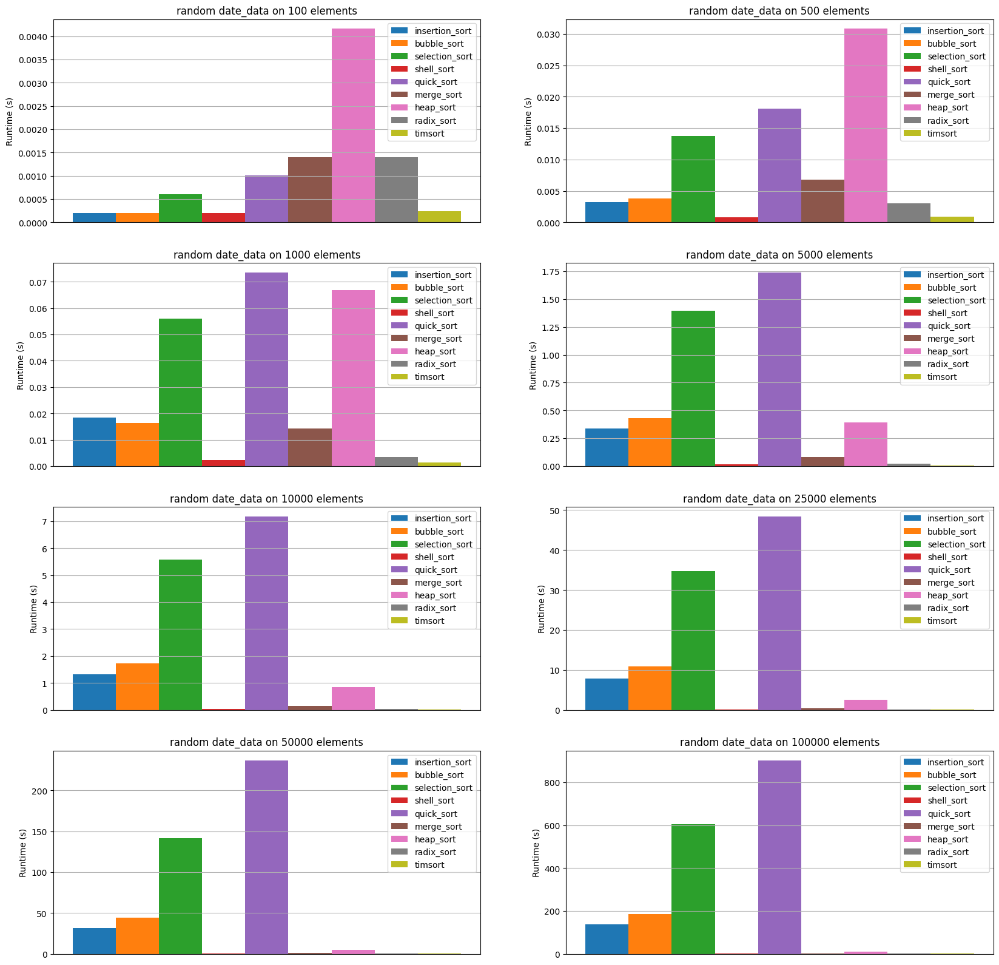

In [86]:
draw_bars_on_data(date_stat, 'random', 'date_data')

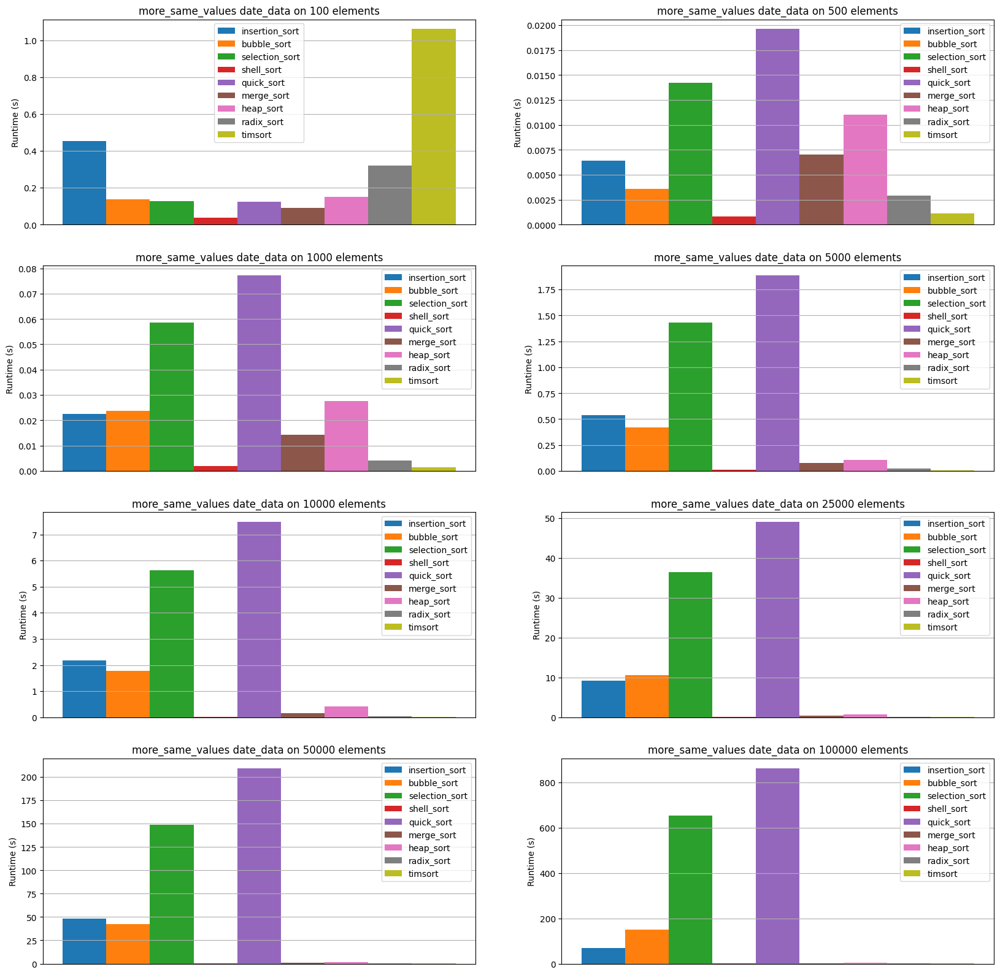

In [87]:
draw_bars_on_data(date_stat, 'more_same_values', 'date_data')

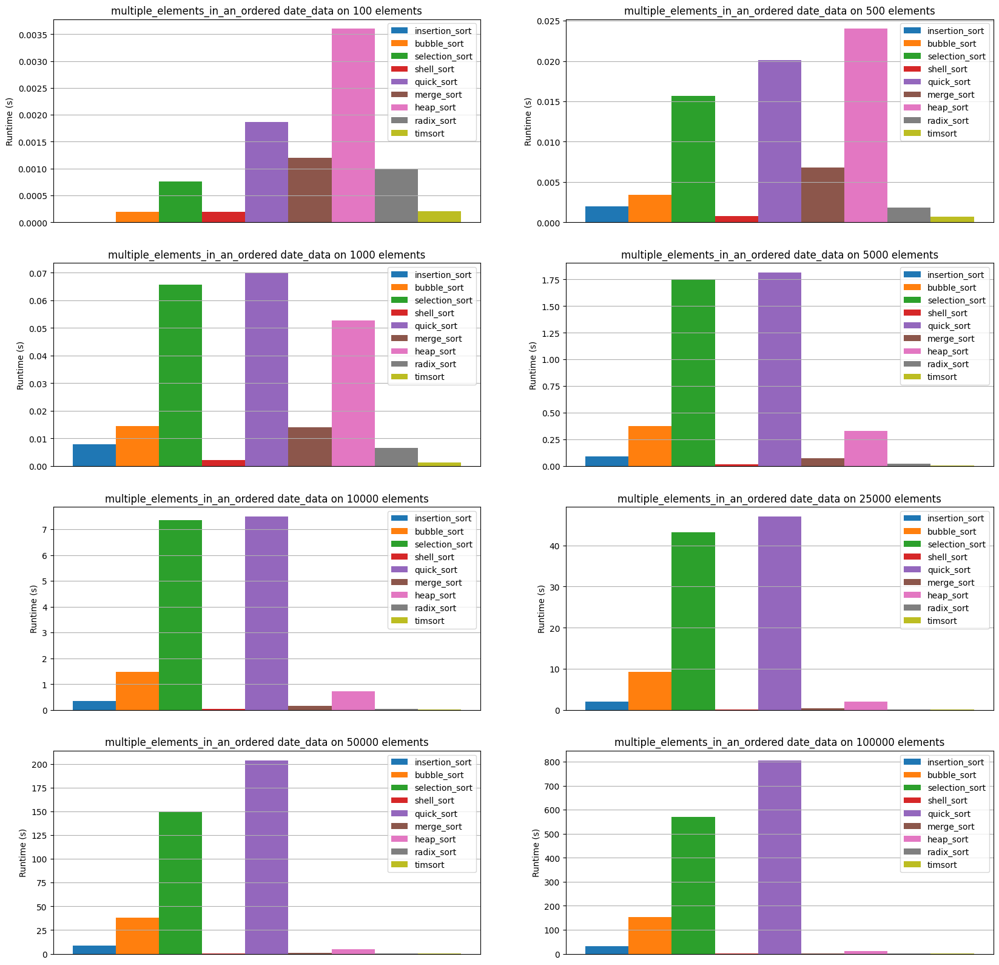

In [88]:
draw_bars_on_data(date_stat, 'multiple_elements_in_an_ordered', 'date_data')

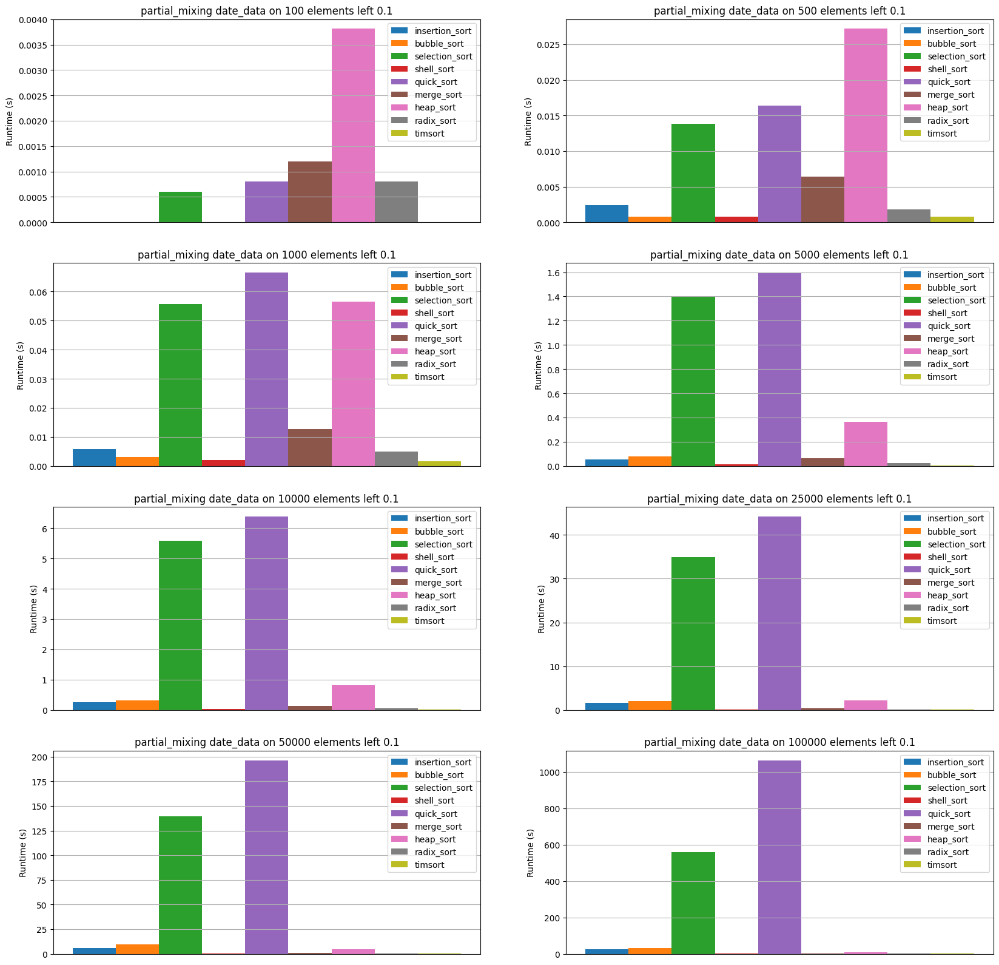

In [89]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='left', cf=0.1)

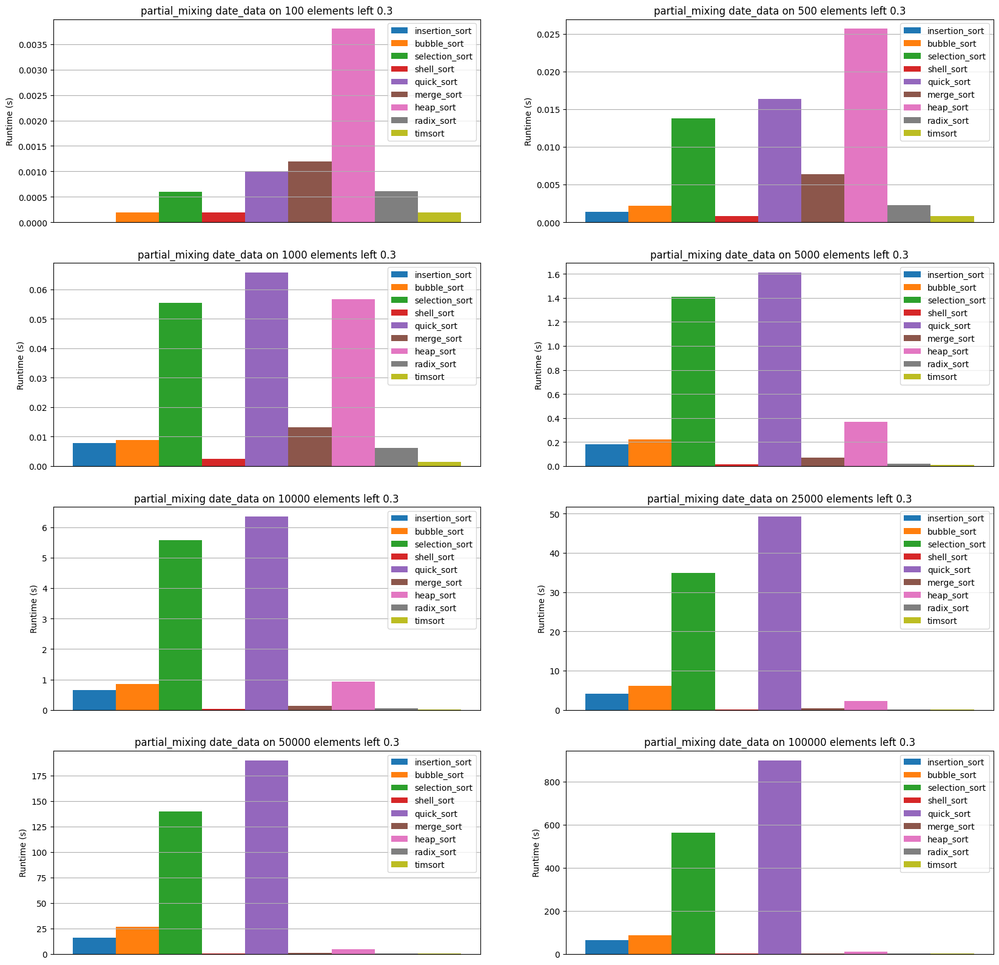

In [90]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='left', cf=0.3)

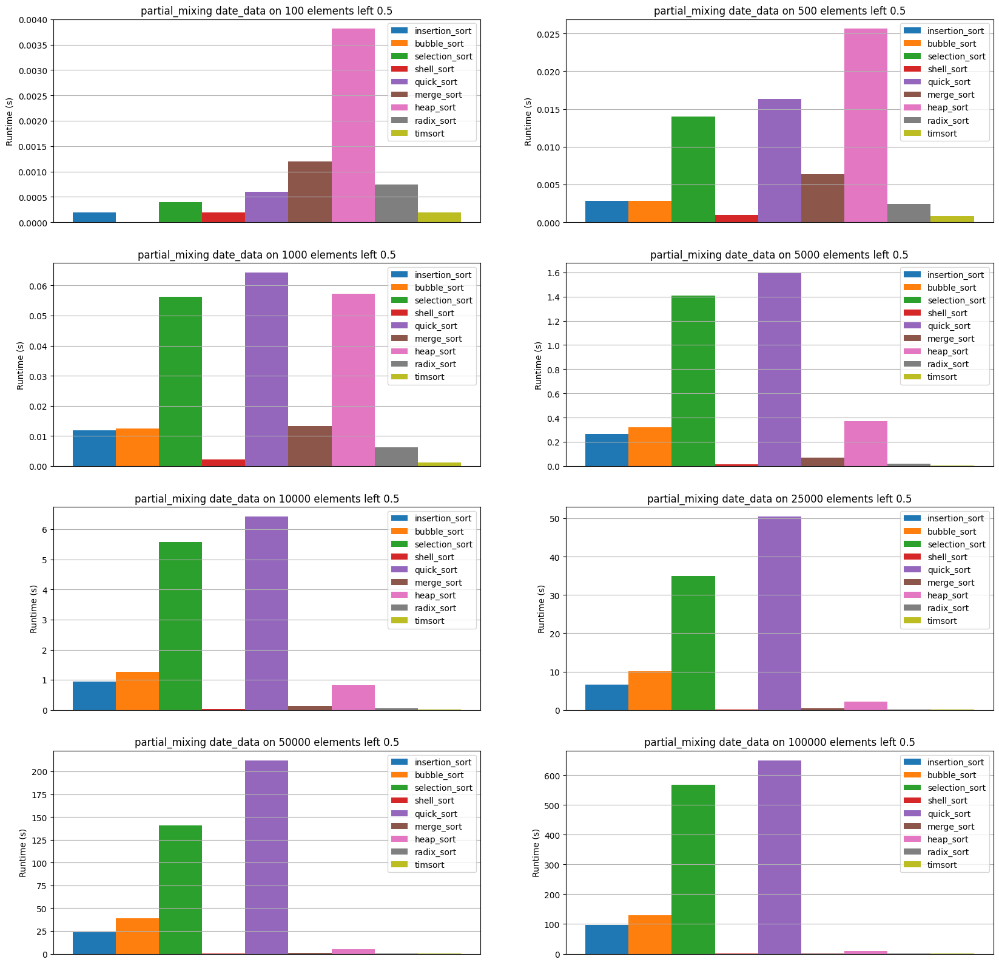

In [91]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='left', cf=0.5)

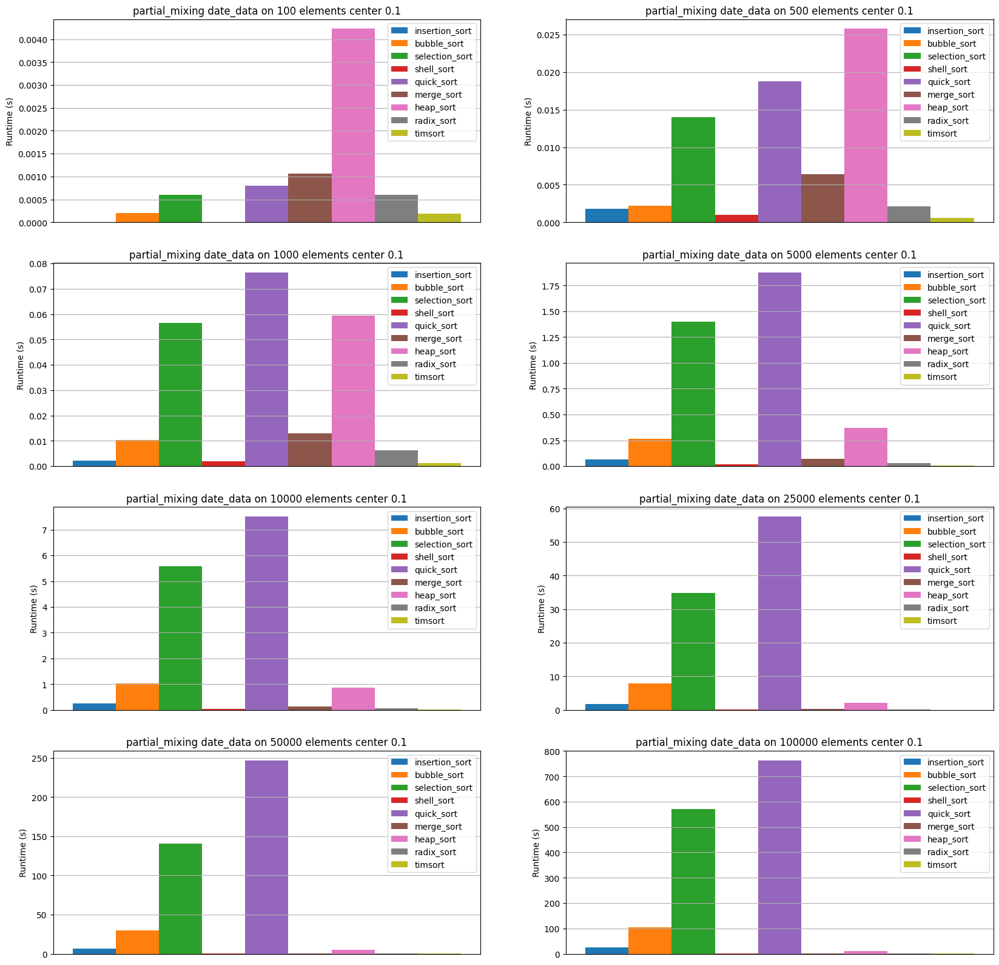

In [92]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='center', cf=0.1)

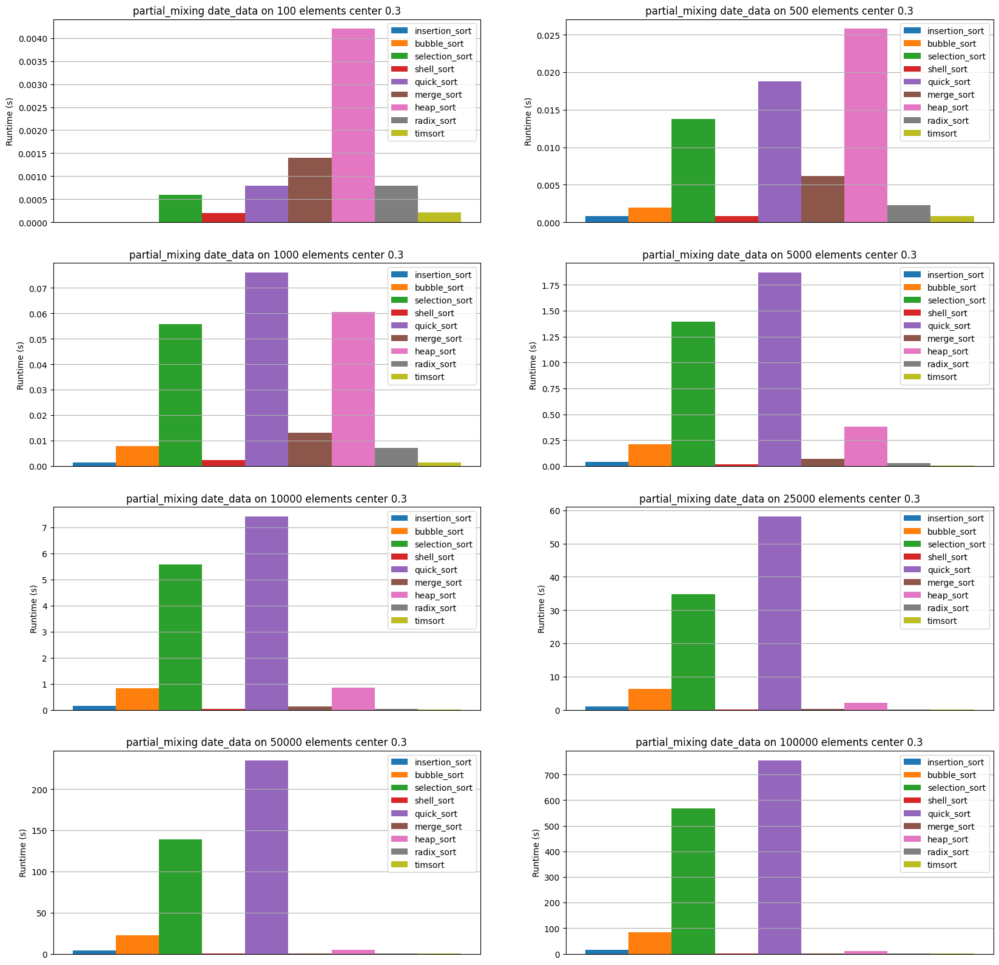

In [93]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='center', cf=0.3)

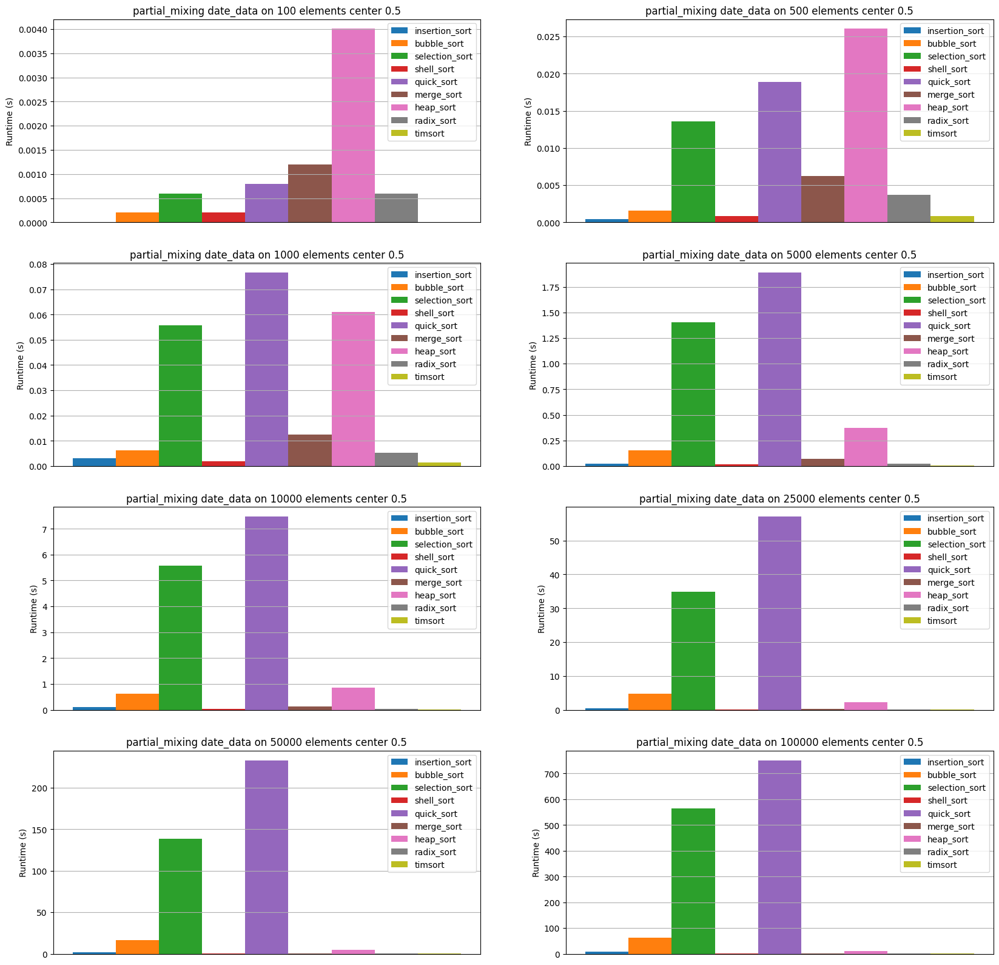

In [94]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='center', cf=0.5)

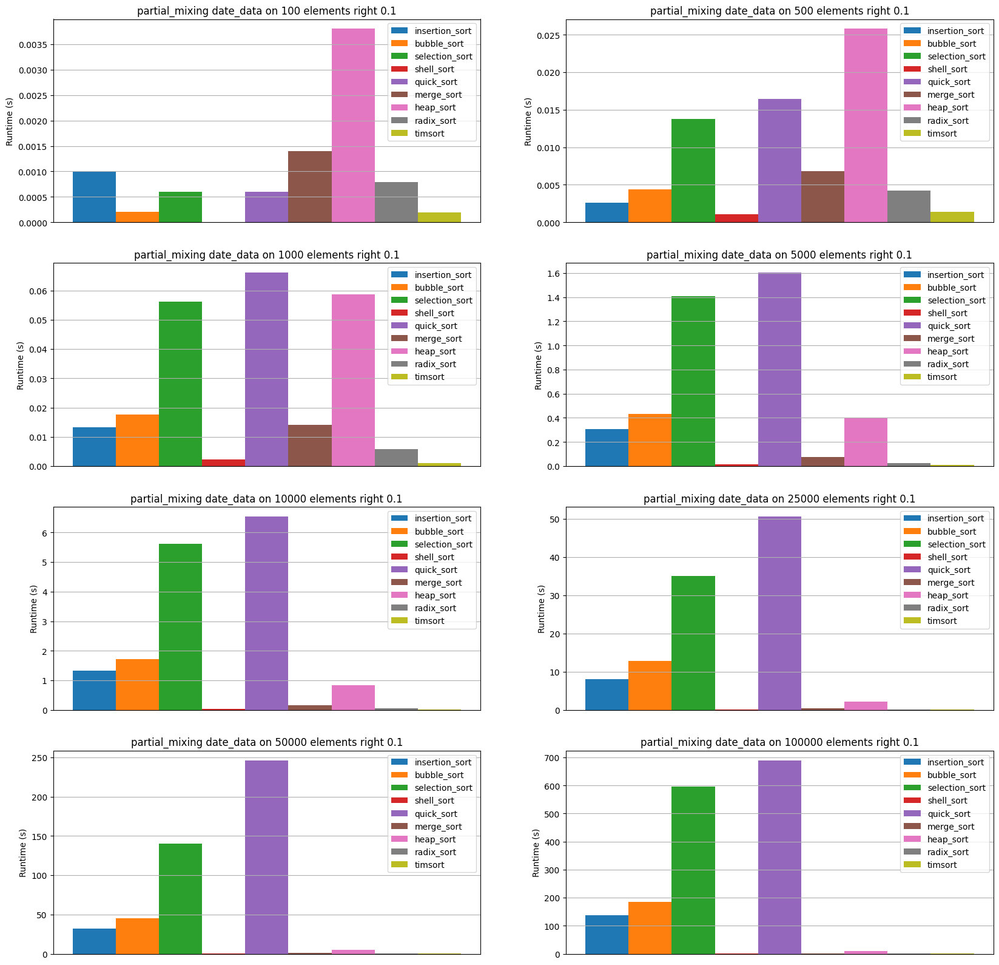

In [95]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='right', cf=0.1)

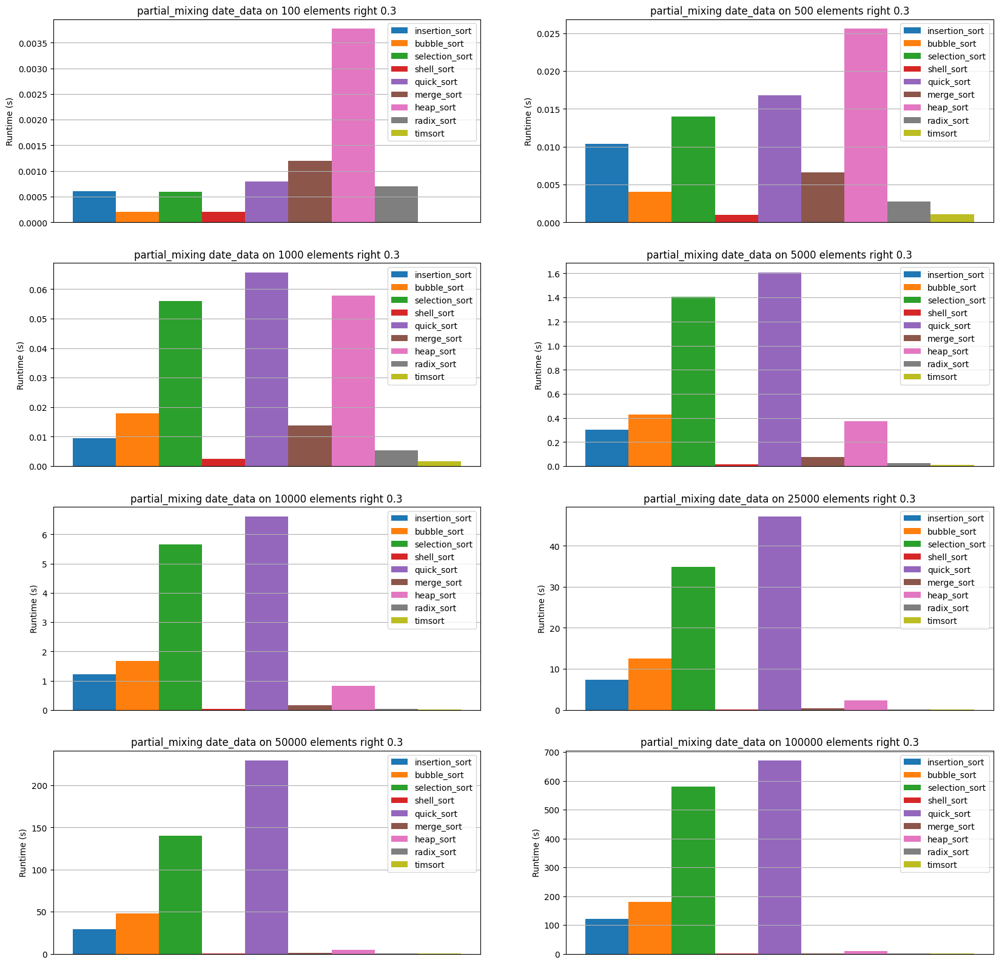

In [96]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='right', cf=0.3)

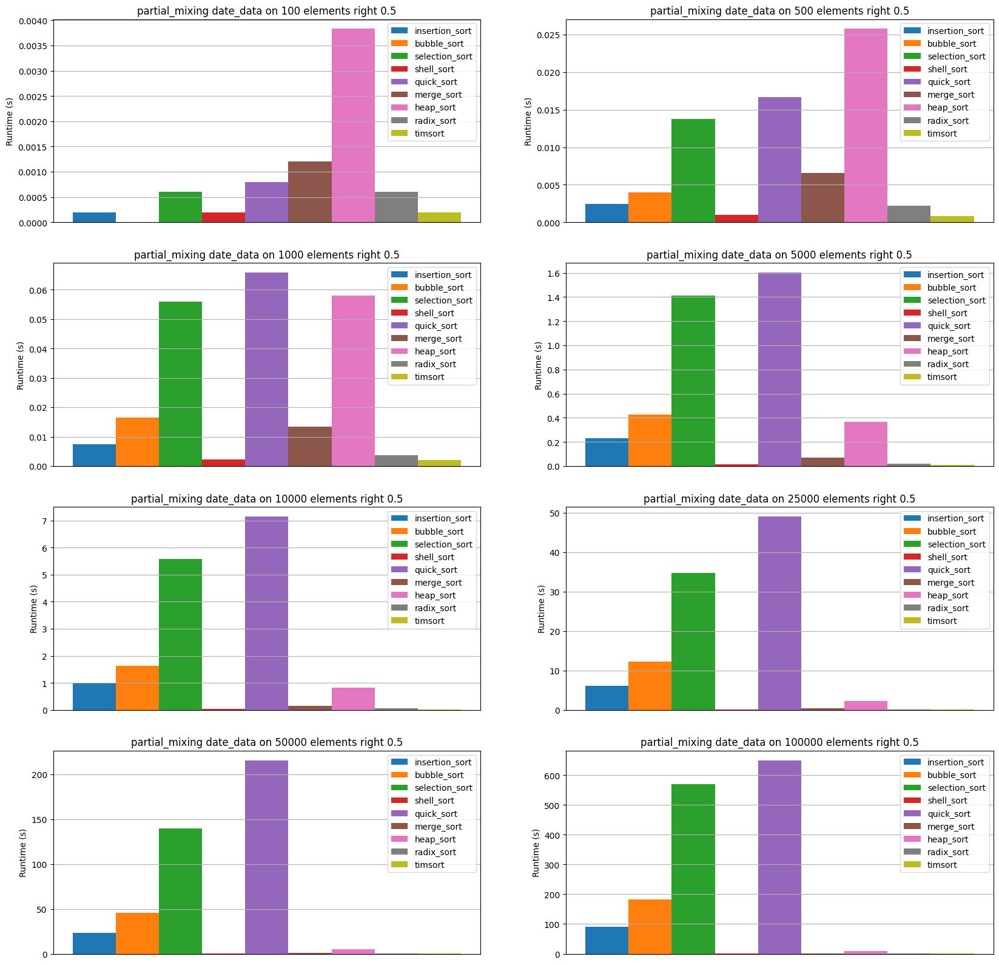

In [97]:
draw_bars_on_data(date_stat, 'partial_mixing', 'date_data', pos='right', cf=0.5)

## Statistic on digit_data

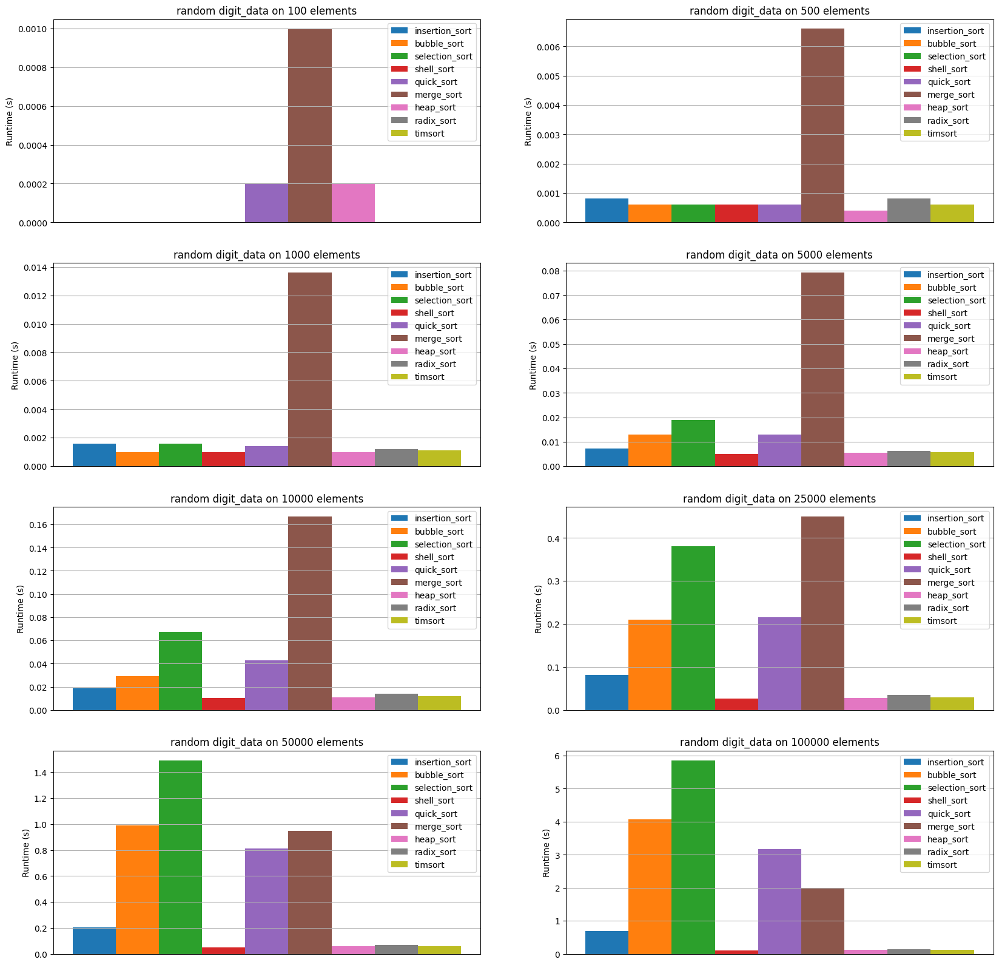

In [98]:
draw_bars_on_data(digit_stat, 'random', 'digit_data')

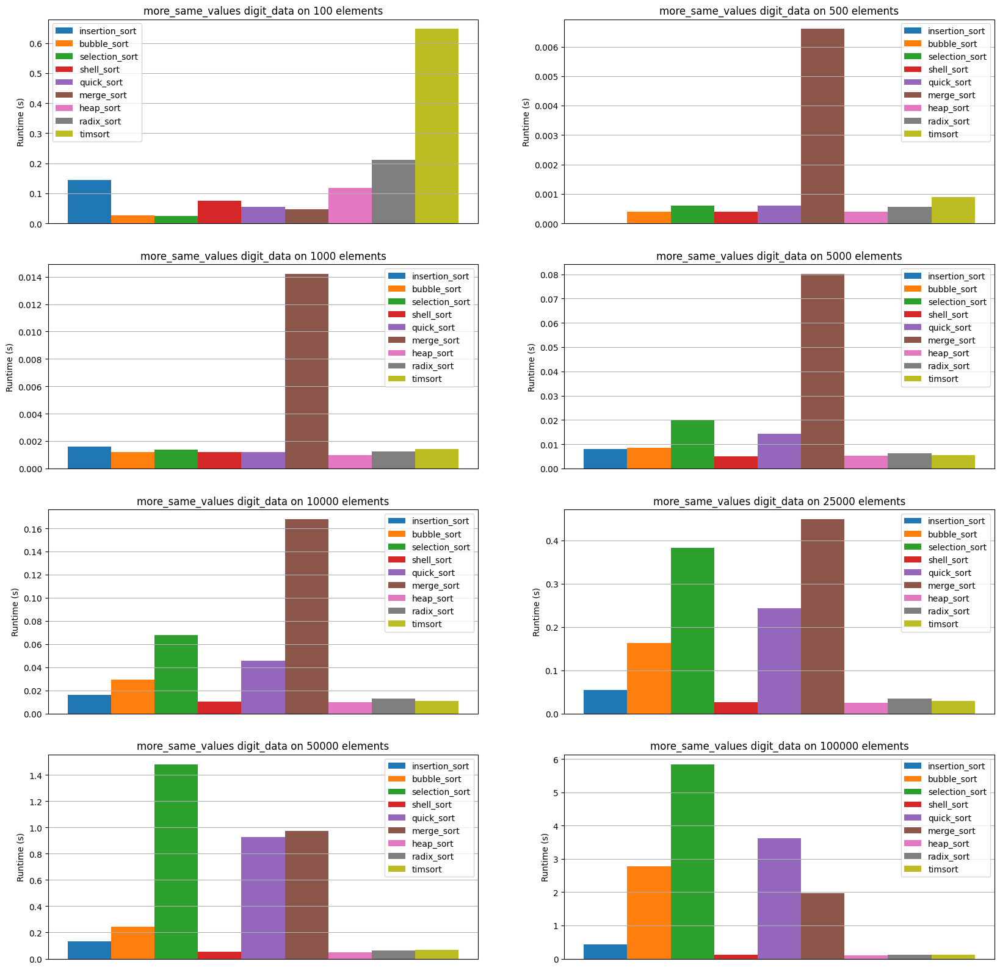

In [99]:
draw_bars_on_data(digit_stat, 'more_same_values', 'digit_data')

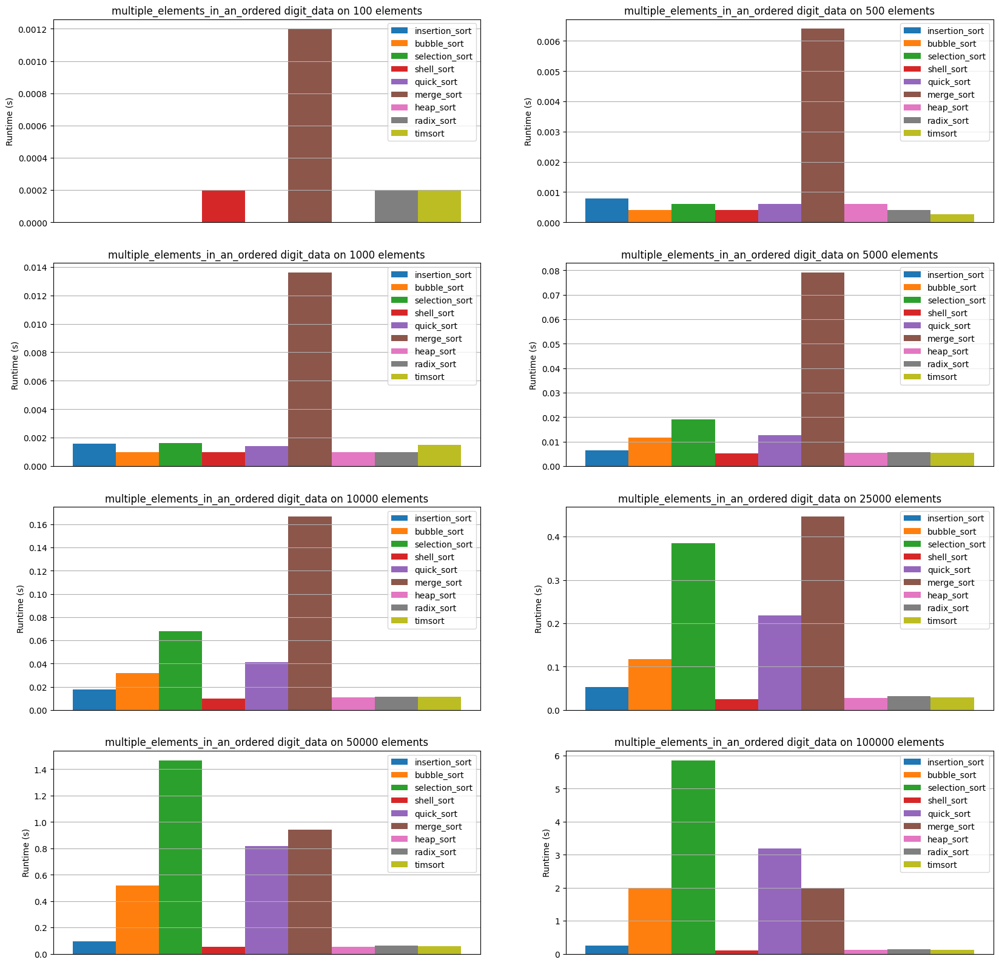

In [100]:
draw_bars_on_data(digit_stat, 'multiple_elements_in_an_ordered', 'digit_data')

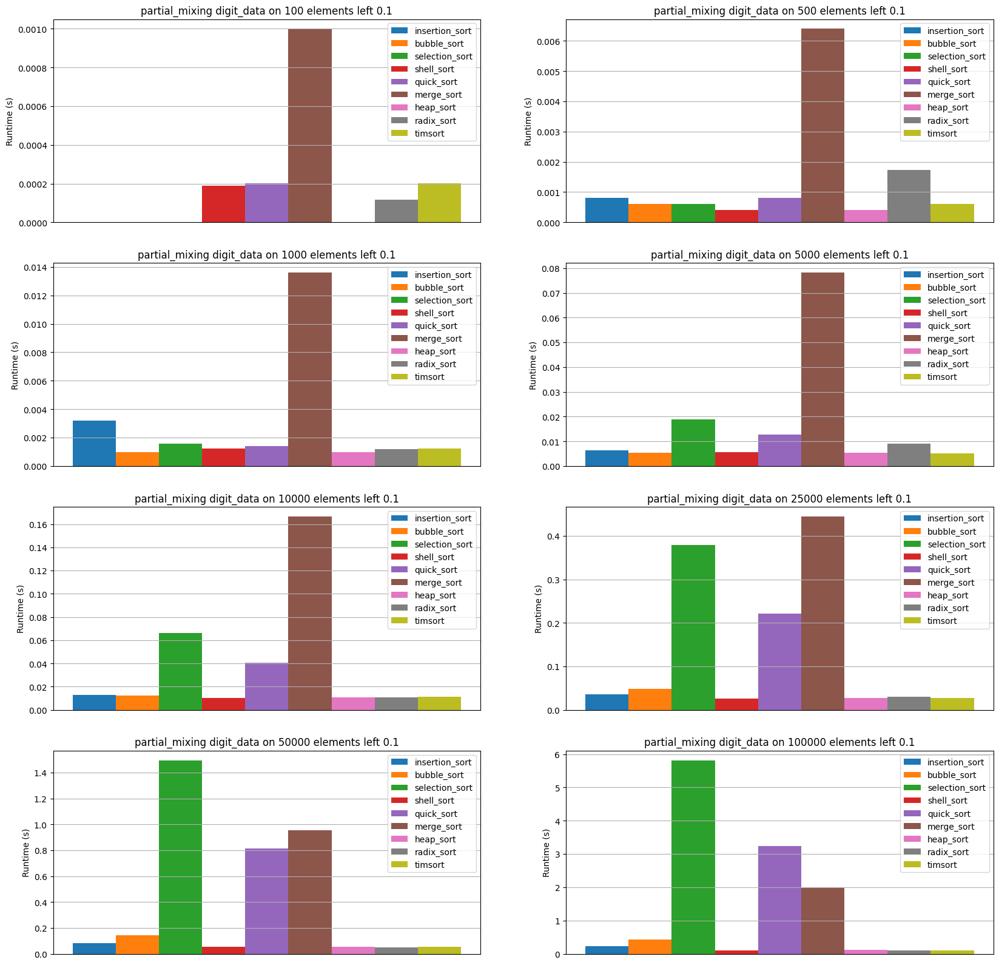

In [101]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='left', cf=0.1)

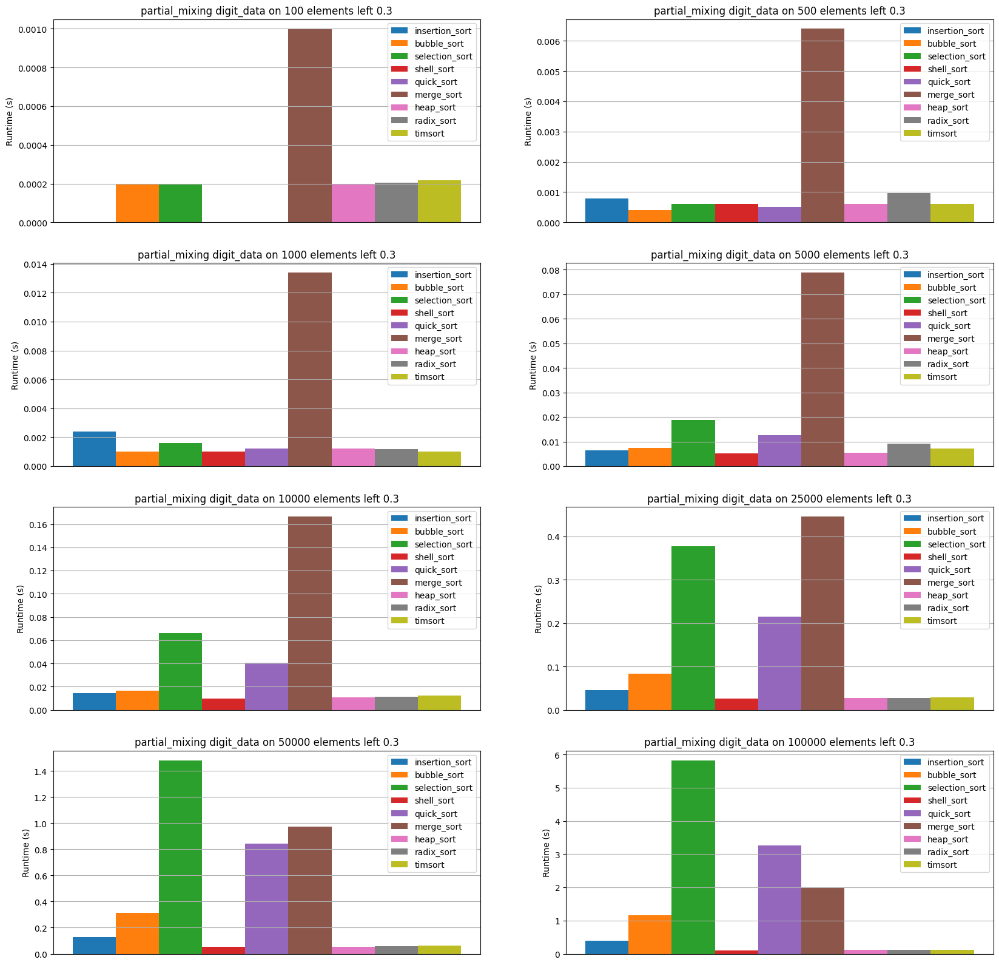

In [102]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='left', cf=0.3)

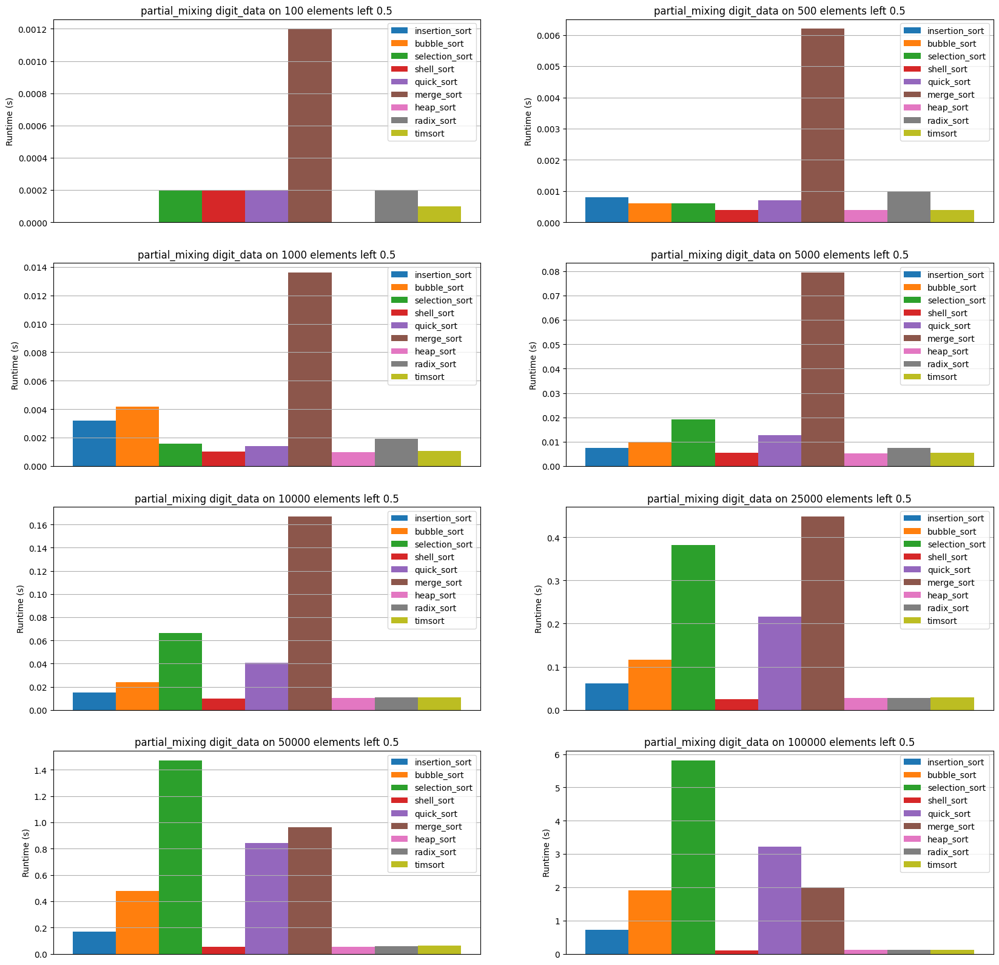

In [103]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='left', cf=0.5)

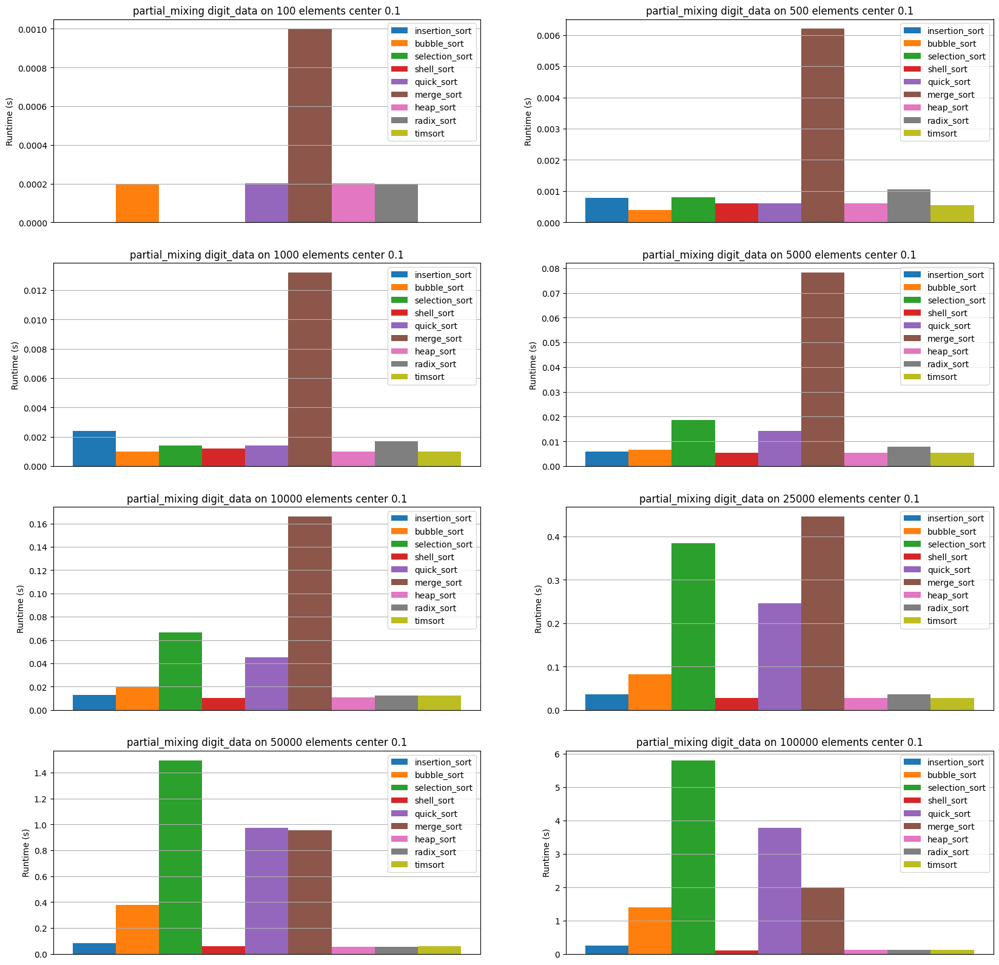

In [104]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='center', cf=0.1)

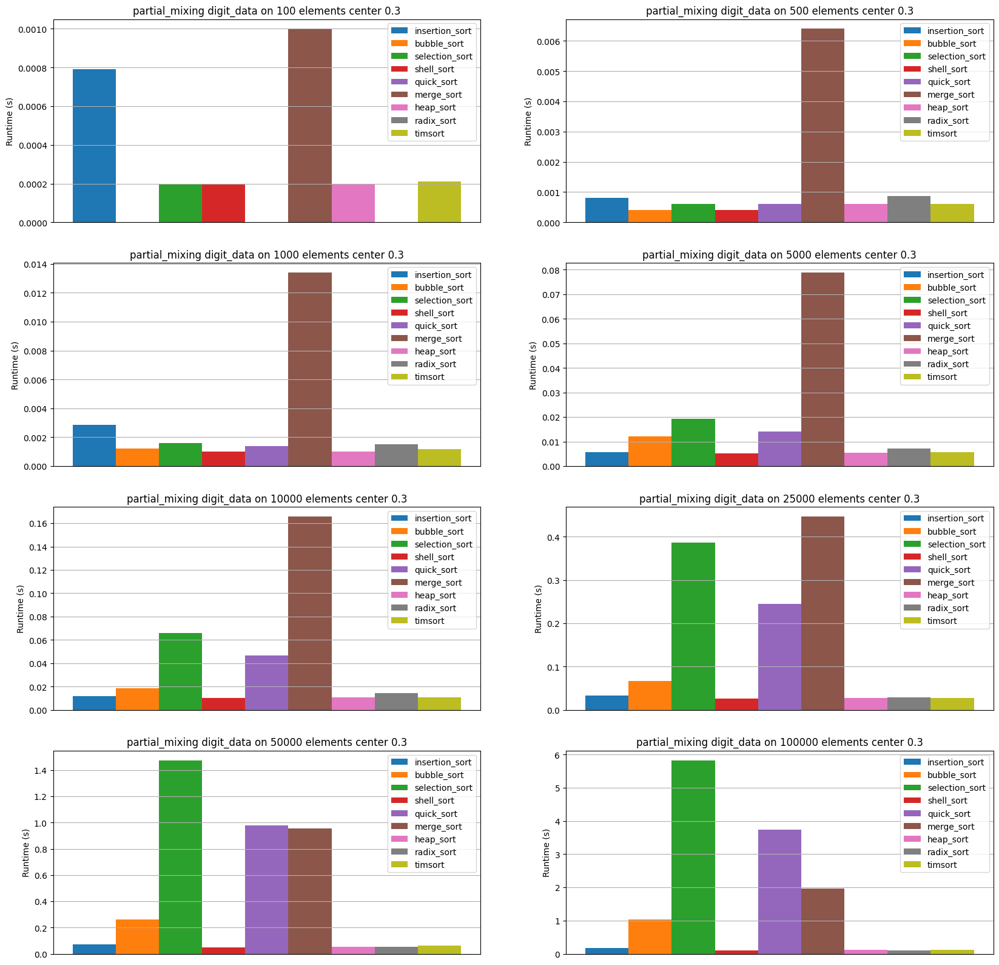

In [105]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='center', cf=0.3)

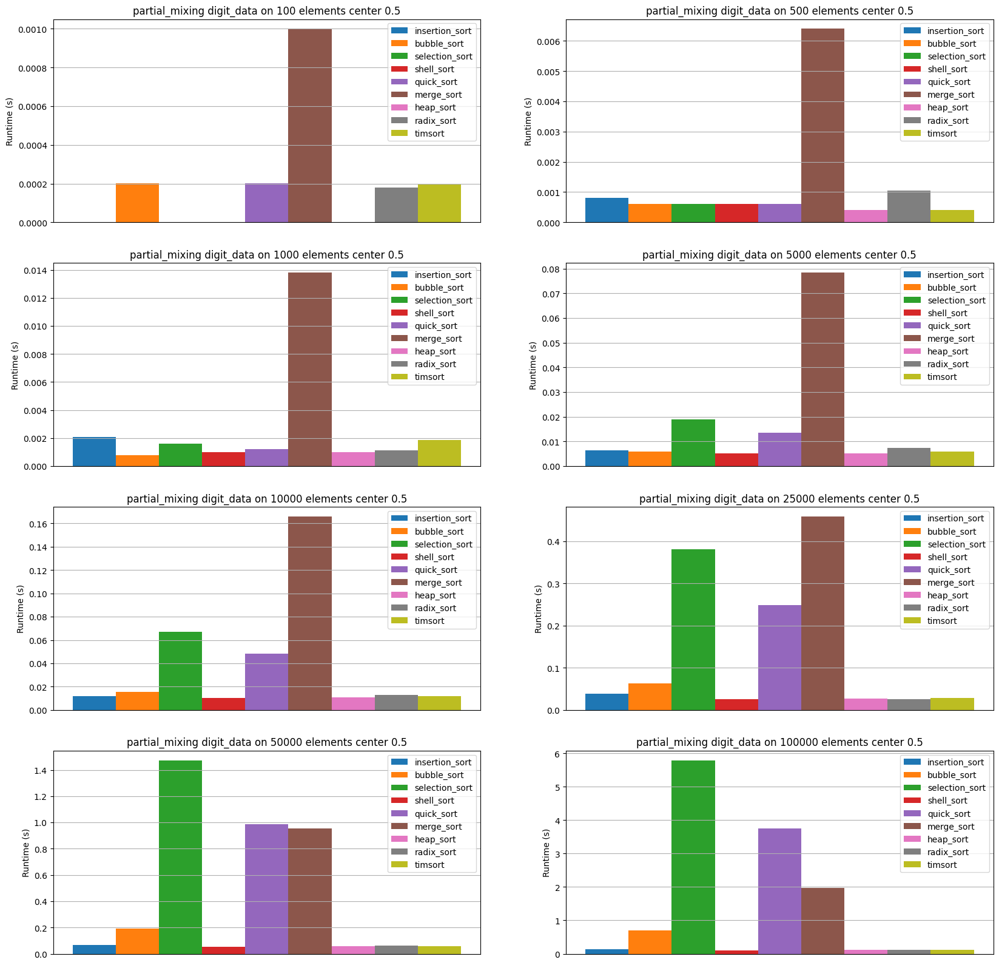

In [106]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='center', cf=0.5)

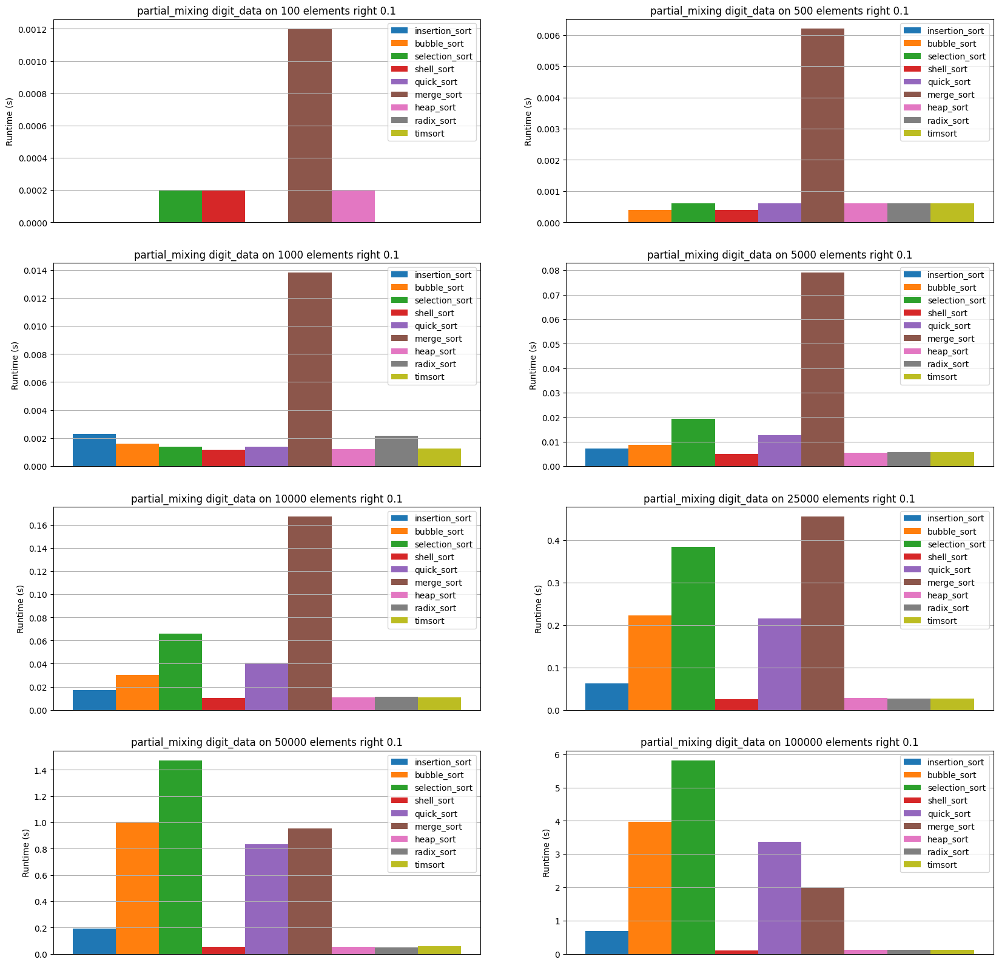

In [107]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='right', cf=0.1)

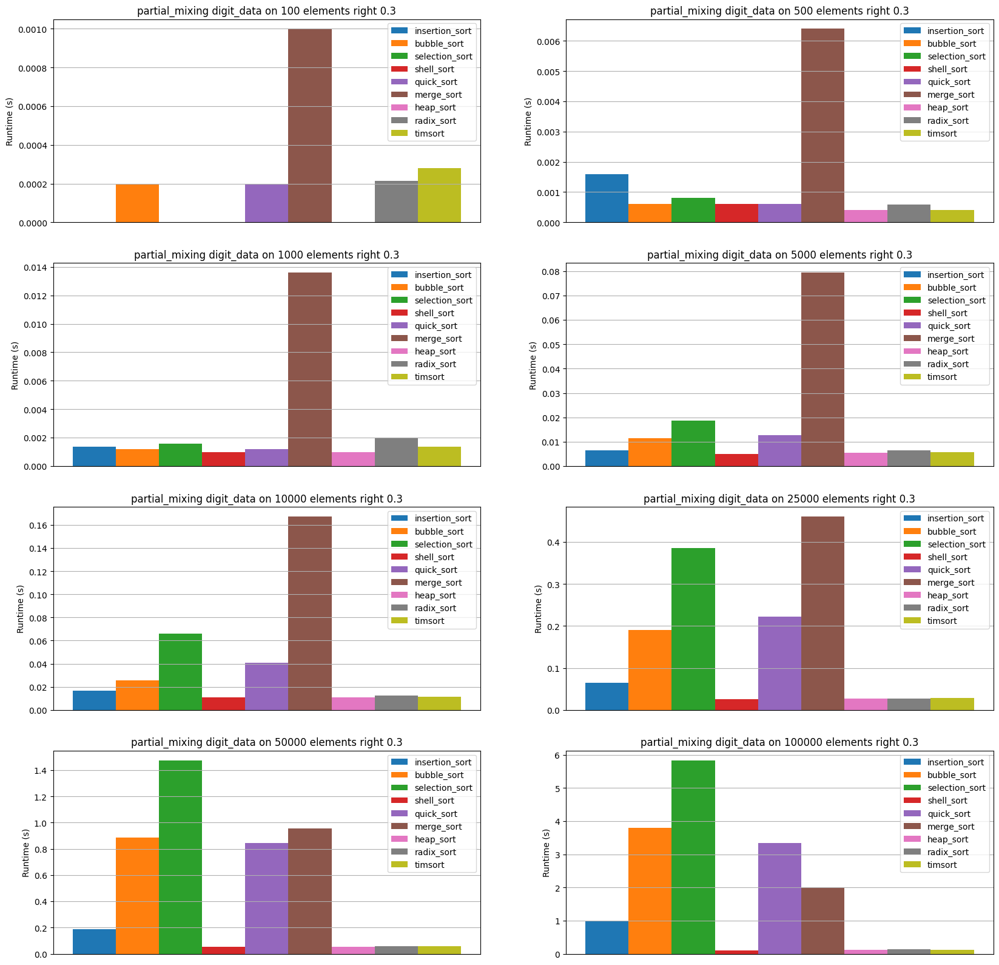

In [108]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='right', cf=0.3)

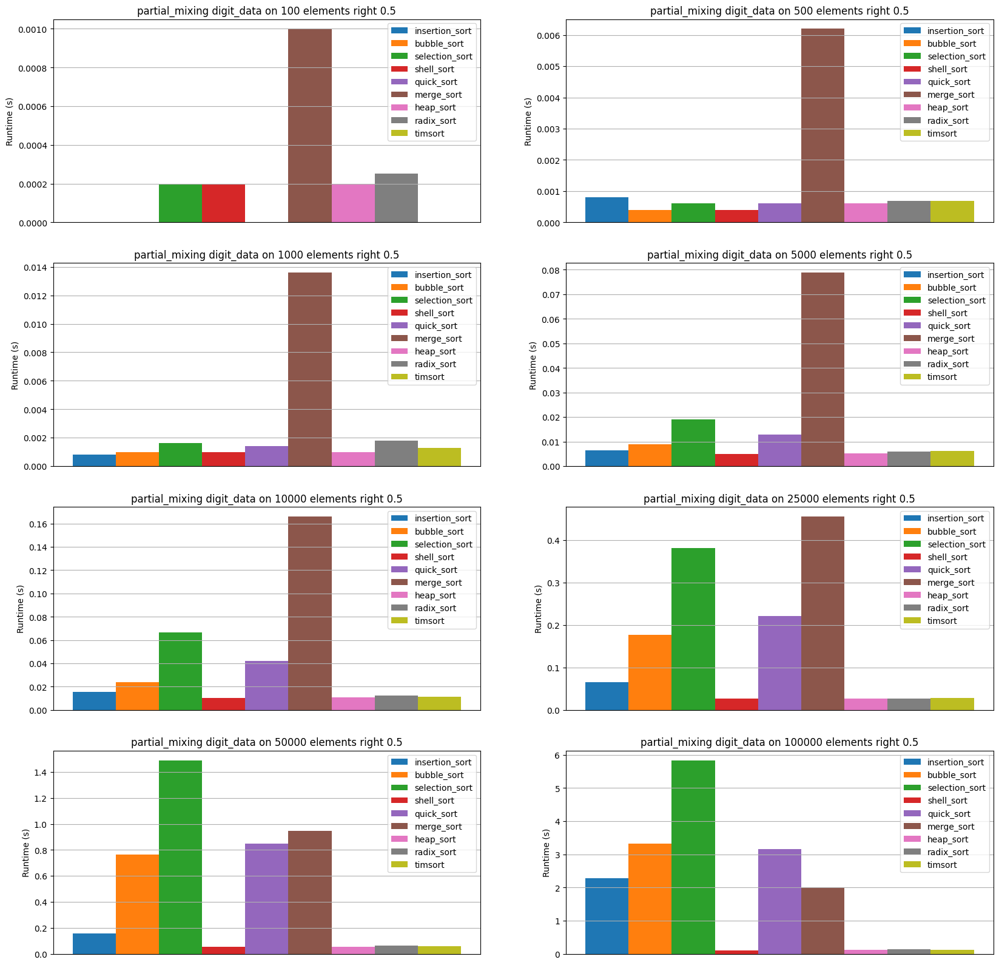

In [109]:
draw_bars_on_data(digit_stat, 'partial_mixing', 'digit_data', pos='right', cf=0.5)

## Statistic on seq_data

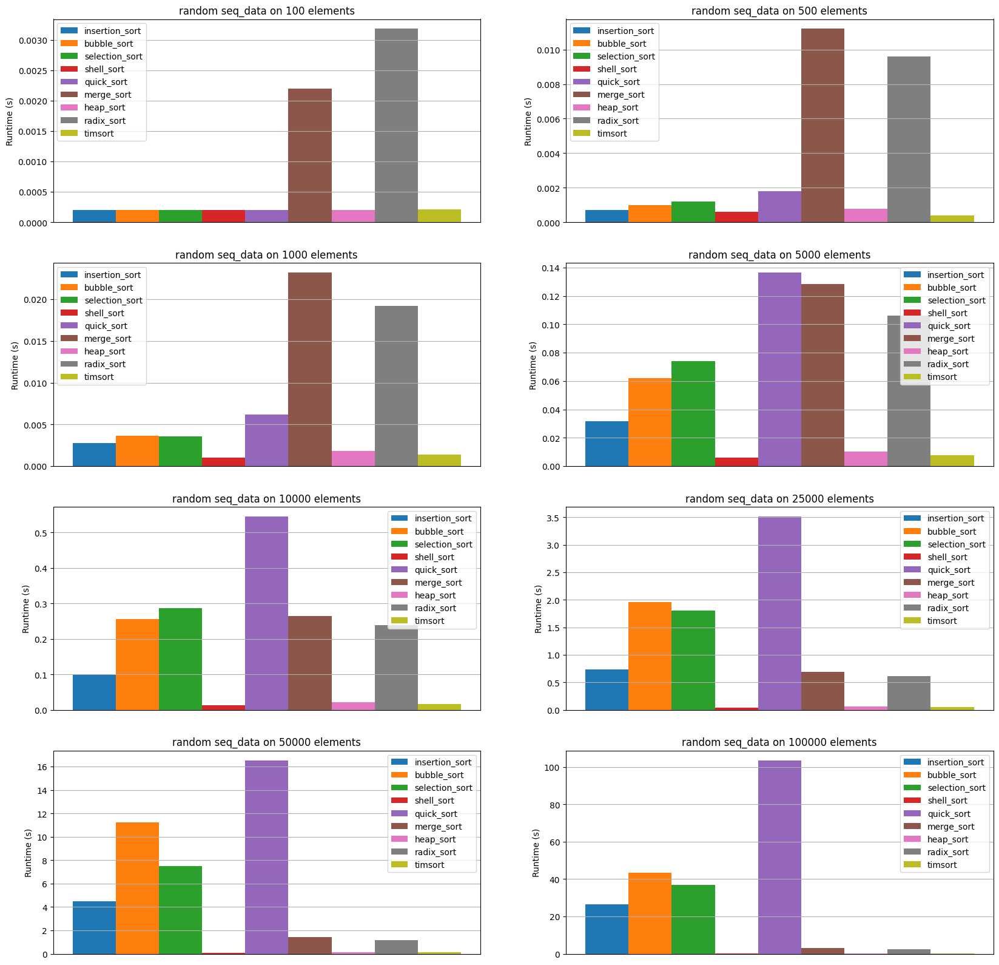

In [110]:
draw_bars_on_data(seq_stat, 'random', 'seq_data')

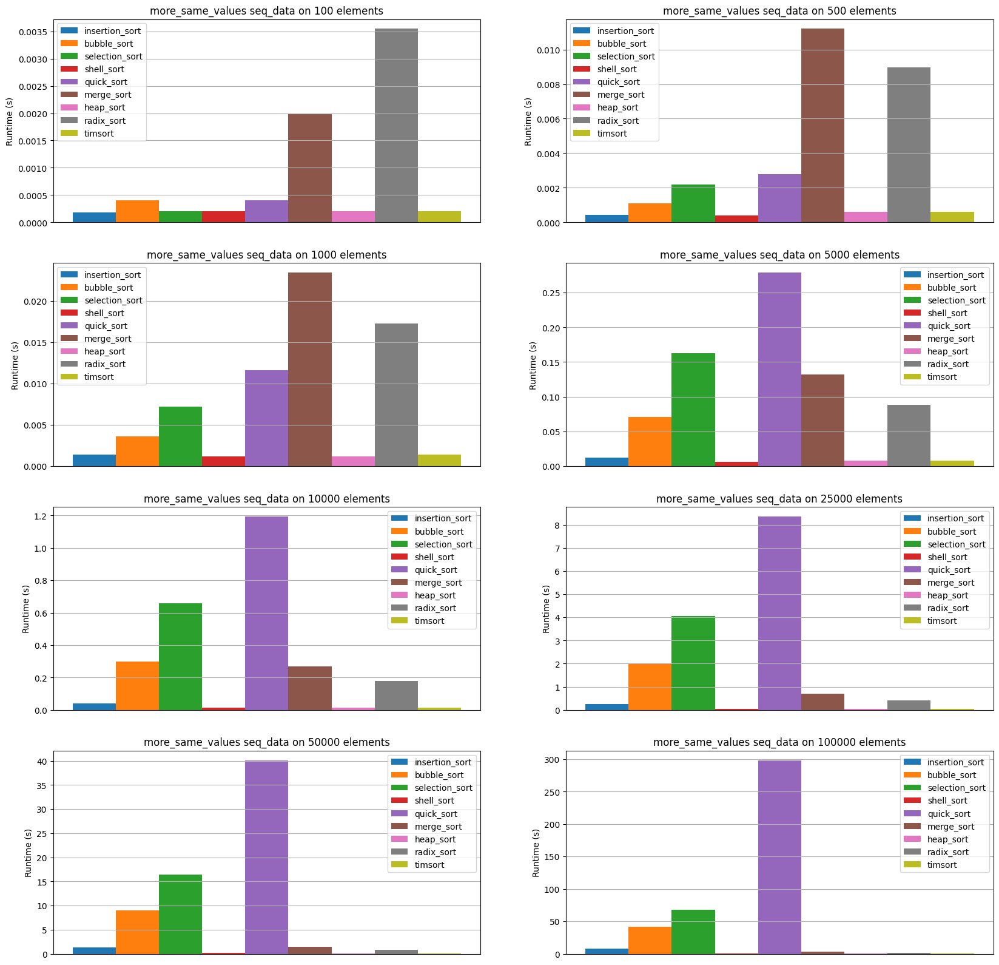

In [111]:
draw_bars_on_data(seq_stat, 'more_same_values', 'seq_data')

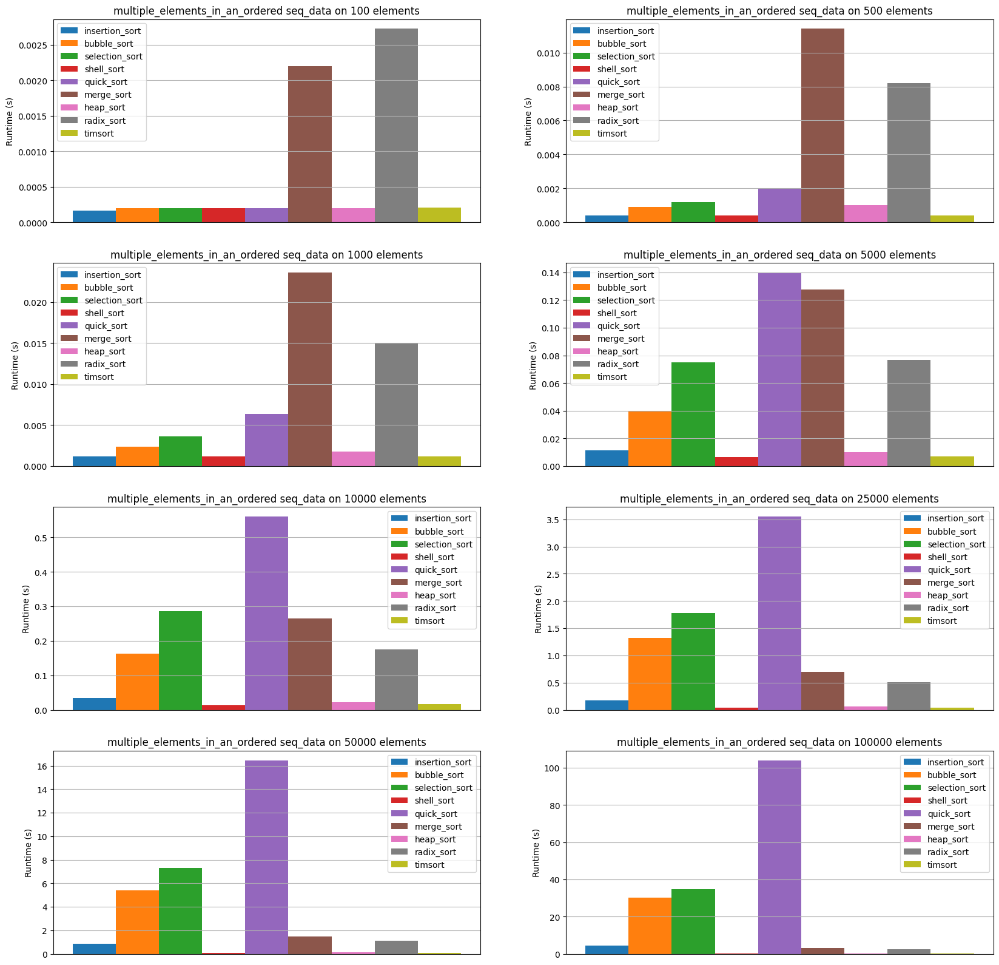

In [112]:
draw_bars_on_data(seq_stat, 'multiple_elements_in_an_ordered', 'seq_data')

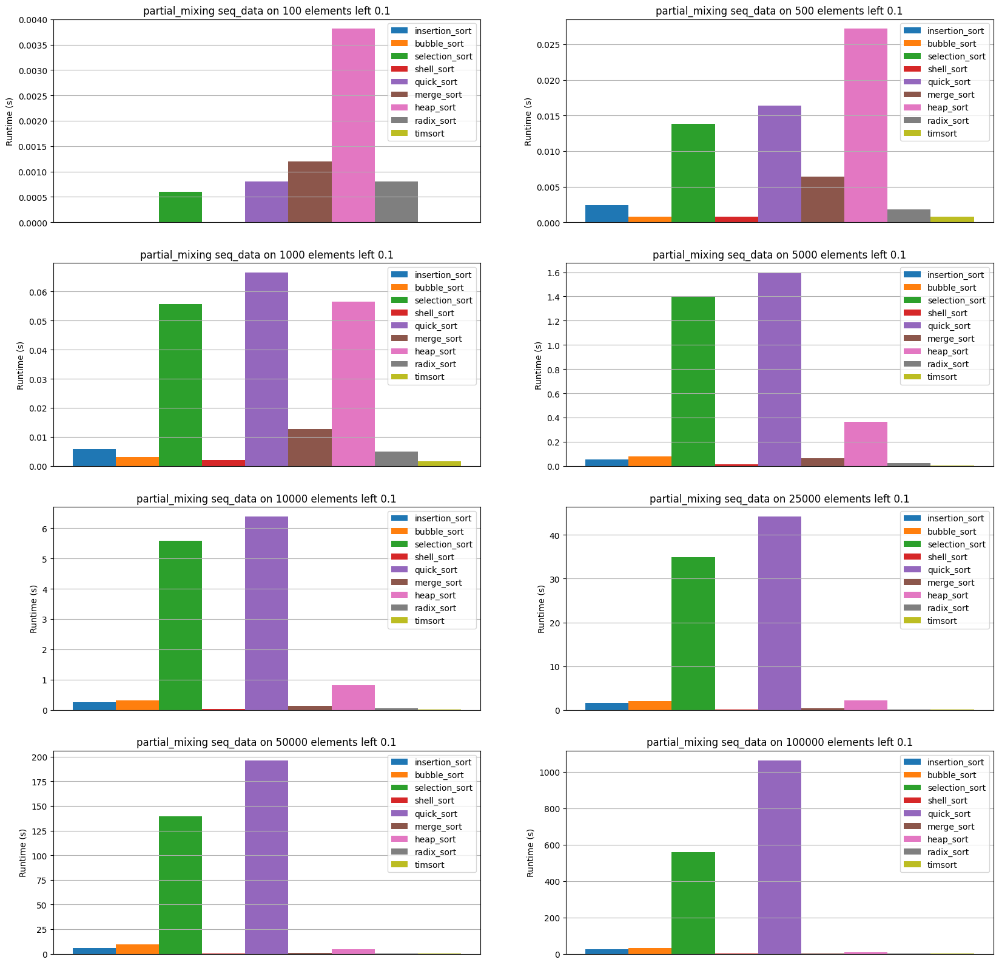

In [113]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='left', cf=0.1)

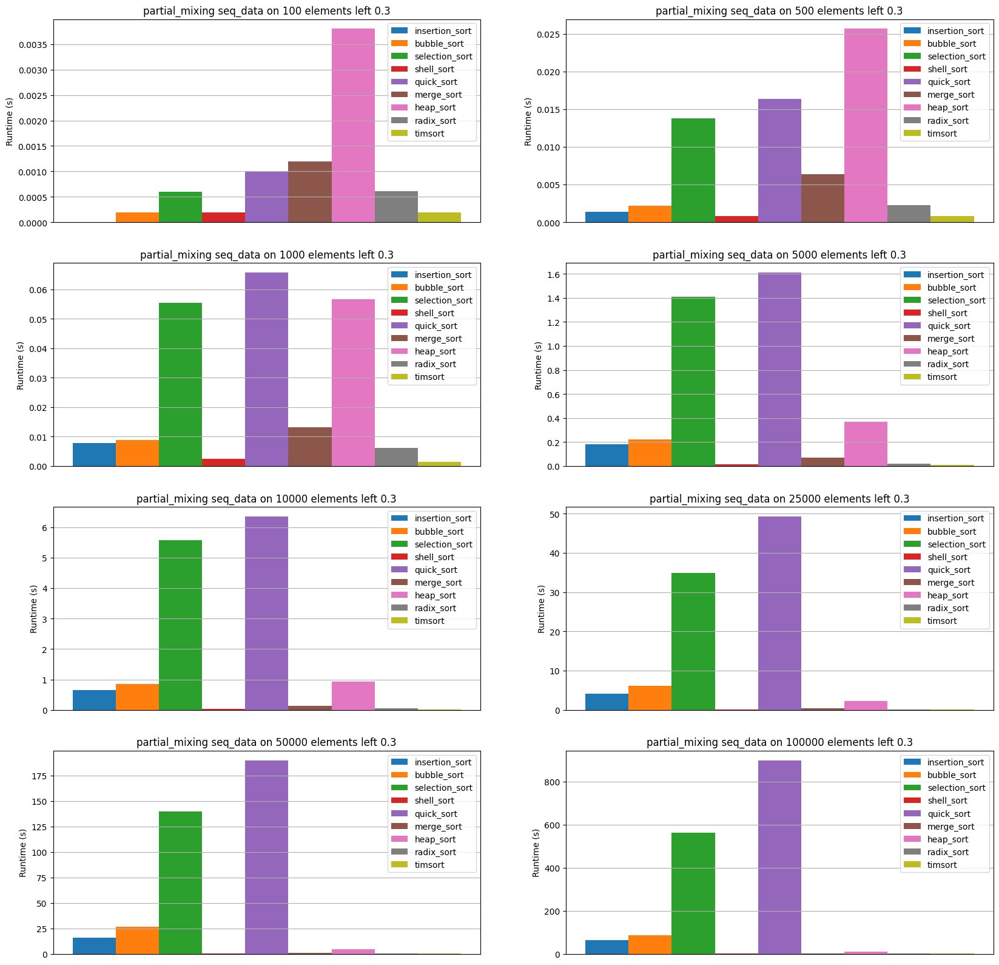

In [114]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='left', cf=0.3)

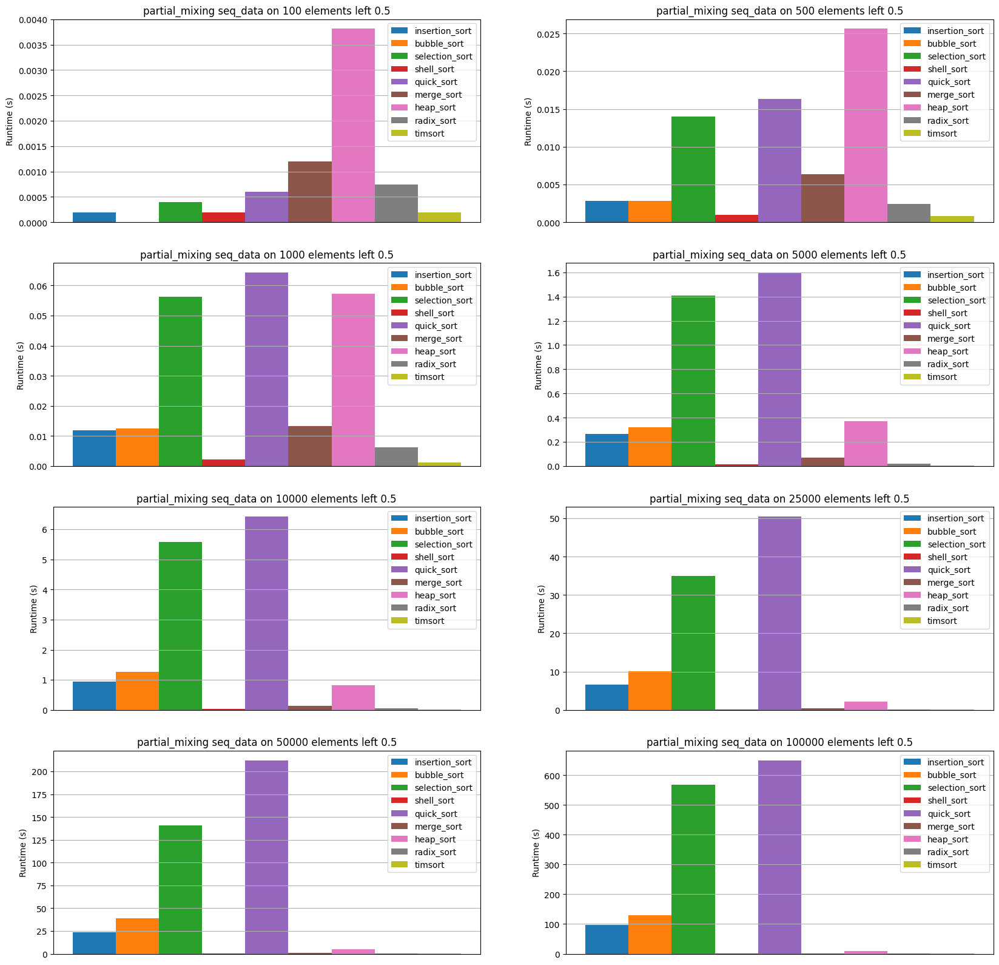

In [115]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='left', cf=0.5)

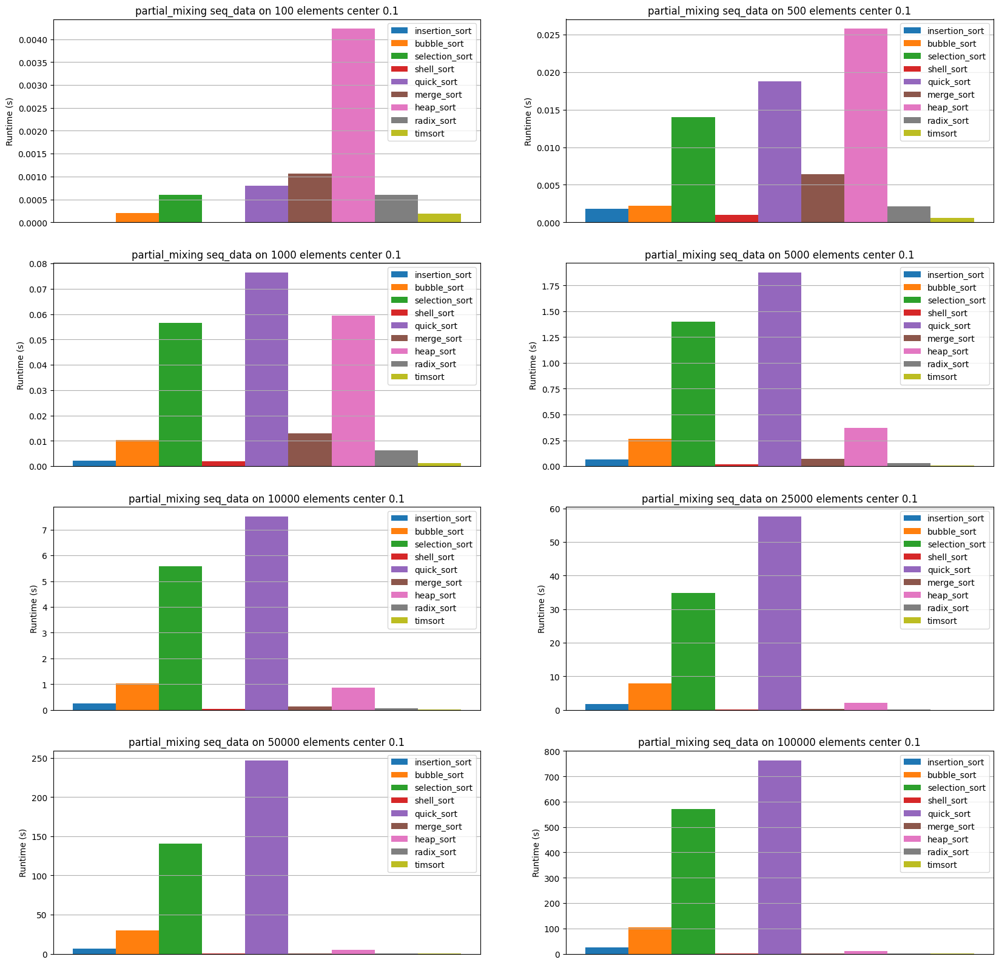

In [116]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='center', cf=0.1)

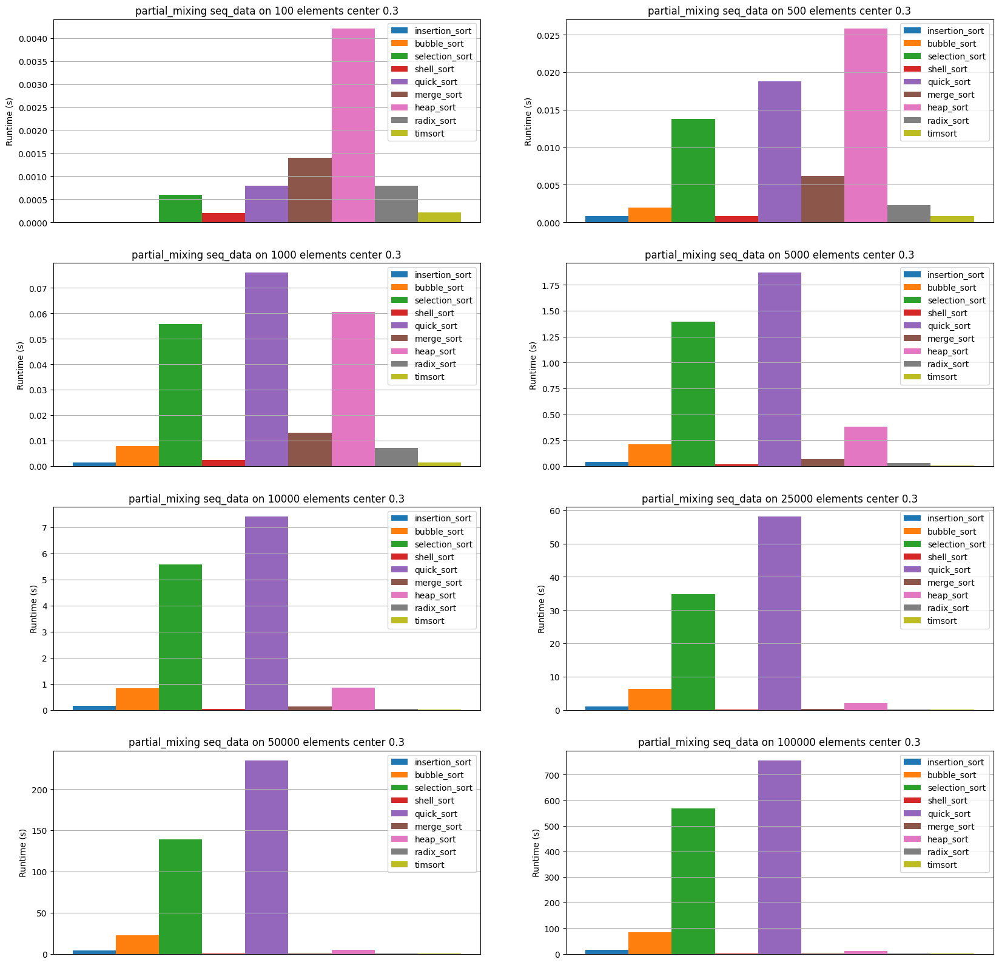

In [117]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='center', cf=0.3)

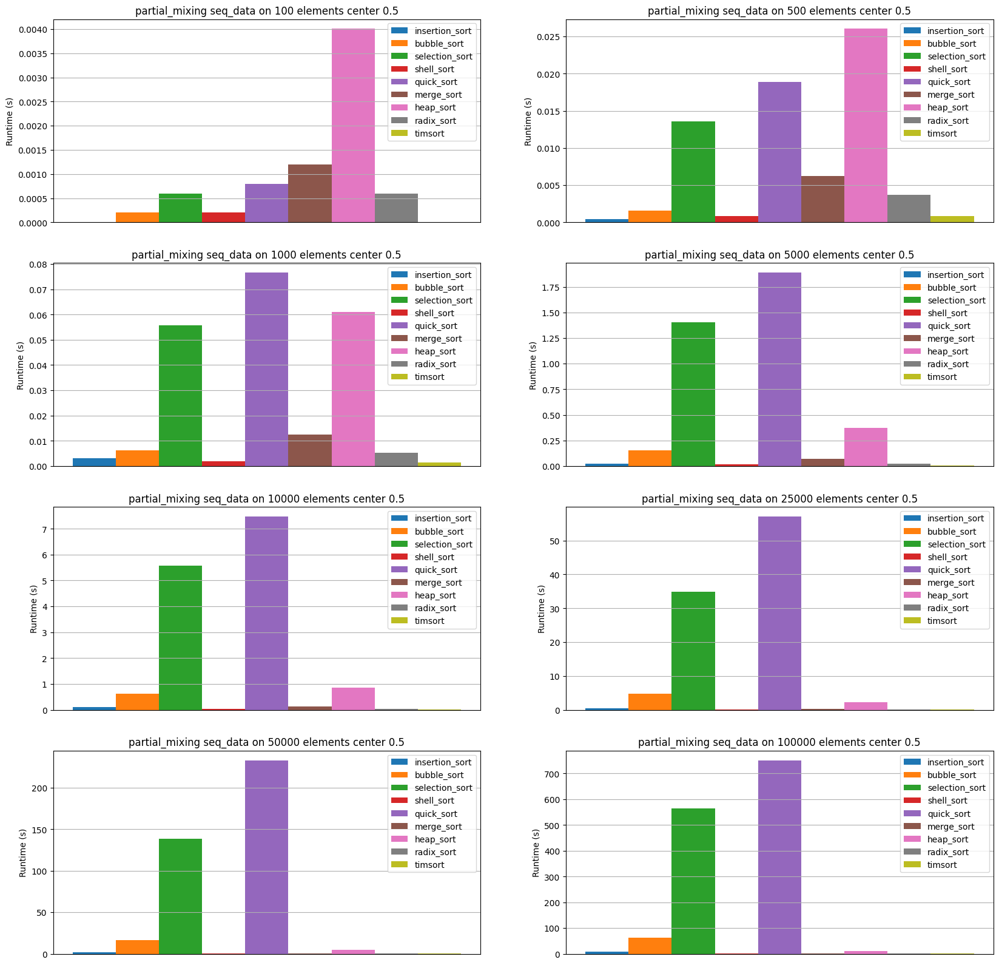

In [118]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='center', cf=0.5)

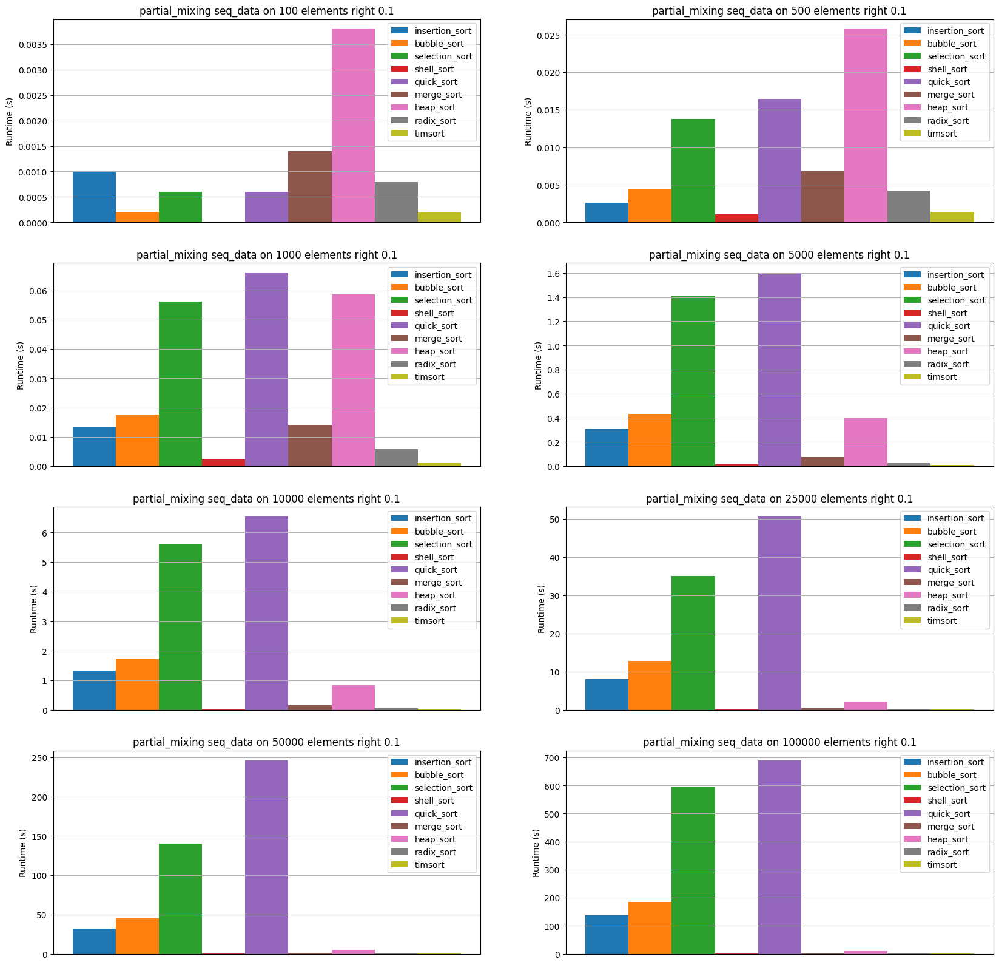

In [119]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='right', cf=0.1)

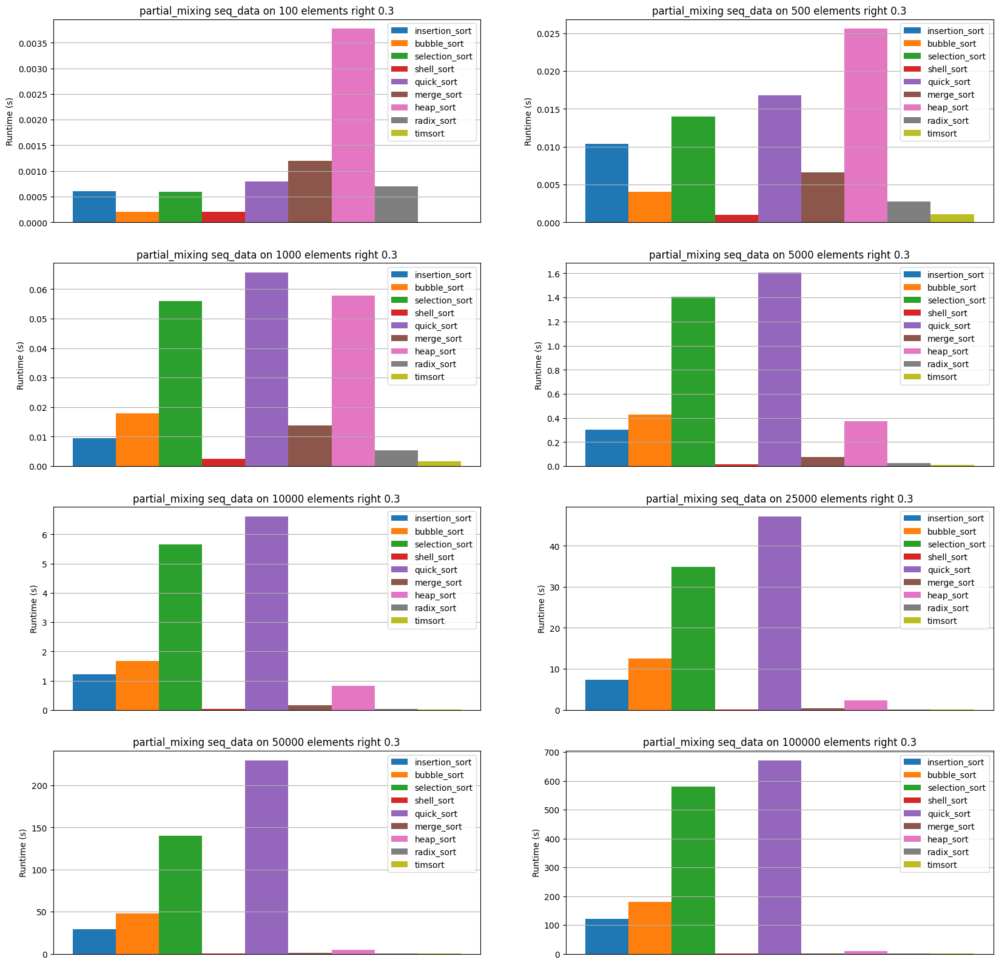

In [120]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='right', cf=0.3)

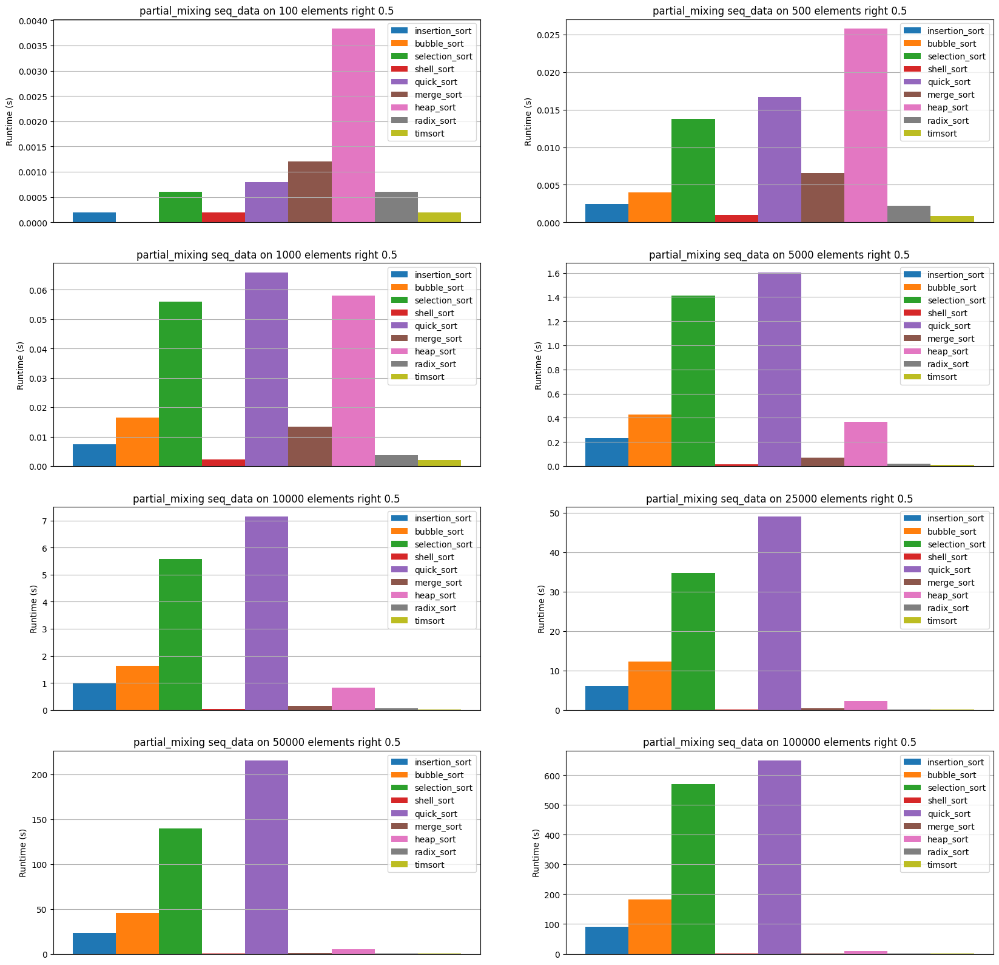

In [121]:
draw_bars_on_data(date_stat, 'partial_mixing', 'seq_data', pos='right', cf=0.5)